In [ ]:
#Decoding with SVM averaged over 100 random seeds
#Decoding of each 500 days of Summer character separately for significant channels only

In [ ]:
import os
import glob
import time 
import copy
import pickle
import random
import sklearn
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA 
from sklearn.inspection import permutation_importance
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import f1_score, roc_curve, auc, plot_confusion_matrix
from sklearn.model_selection import ShuffleSplit, train_test_split, GridSearchCV
from mlxtend.plotting import plot_decision_regions

import utils.helper_func as hf
import utils.plotting as plotting
import utils.decoding as decoding

warnings.filterwarnings("ignore")

In [3]:
patient_id = 46
session_nr = 1

#top_dir = '/media/alado/TOSHIBA_EXT/thesis/output'
top_dir = '/home/anastasia/epiphyte/anastasia/output'
folder = f'05-Hilbert_transform_{patient_id}'
filtering_type = ['theta', 'slow_gamma', 'fast_gamma']

fs = 32768
#The resulting sample rate is up / down times the original sample rate.
up = 1
down=32
fs_downs = (up/down)*fs
dt = 1/fs_downs      # sampling period/time/interval or time resolution, often denoted as T

times = np.linspace(-500, 1000, num = 1501)
time_zero_idx = np.where(times == hf.find_nearest(times, 0))[0][0]

df_patient_info = pd.read_csv(f'{top_dir}/{patient_id}_channel_info.csv')
dict_replace = {'LA1':'LAA1', 'LA2':'LAA2', 'LA3':'LAA3', 'LA4':'LAA4', 'LA5':'LAA5', 'LA6':'LAA6', 'LA7':'LAA7', 'LA8':'LAA8',
               'RA1':'RAA1', 'RA2':'RAA2', 'RA3':'RAA3', 'RA4':'RAA4', 'RA5':'RAA5', 'RA6':'RAA6', 'RA7':'RAA7', 'RA8':'RAA8',}
df_patient_info_new = df_patient_info.replace(dict_replace)
df_stim_info = pd.read_csv(f'{top_dir}/{patient_id}_df_stim_info.csv')
all_stim = np.unique(df_stim_info['stim_id'])
all_stim_name = np.unique(df_stim_info['stim_name'])
all_brain_areas = np.unique(df_patient_info_new['recording_site'])
#brain_areas = ['LAA', 'LAH', 'LEC','LMH', 'LPHC', 'RAA', 'RAH', 'REC', 'RMH', 'RPHC']
brain_areas = np.unique(df_patient_info_new['brain_area'])
selected_channels = ['CSC2', 'CSC8', 'CSC12', 'CSC26', 'CSC28', 'CSC29', 'CSC41', 'CSC42', 'CSC47', 'CSC52', 'CSC67']

n_channels = 80
n_stim_present = 10
n_stim = 42
n_stim_types = len(np.unique(df_stim_info['stim_name']))

In [4]:
time_chunks = ['200_500', '500_800', '200_600', '400_800']
time_chunks_dict = {'200_500_st':700, '200_500_end':1000, '500_800_st':1000, '500_800_end':1300, 
                    '200_600_st':700, '200_600_end':1100,'400_800_st':900, '400_800_end':1300}
n_pca_comp = 10

columns_data_array = []
for j in filtering_type:
    for i in range(len(df_patient_info['channel_name'])):
        ch = df_patient_info.loc[i,'channel_name']
        ch_site = df_patient_info.loc[i,'recording_site']
        
        for tm in time_chunks:
            columns_data_array.append(f'{j}_{ch}_{tm}')
        
        for comp in range(n_pca_comp):
            columns_data_array.append(f'{j}_{ch}_pca_{comp+1}')

In [5]:
for i in range(len(df_patient_info['channel_name'])):
    ch = df_patient_info.loc[i,'channel_name']
    ch_site = df_patient_info.loc[i,'recording_site']
    
    path = f'{top_dir}/{folder}/theta/envelope/{ch}_{ch_site}'
    file_1 = f'{path}/{ch}_{ch_site}_38_???_amplitude_envelope_pre.npy'
    file_2 = f'{path}/{ch}_{ch_site}_38_unknown_amplitude_envelope_pre.npy'
    os.rename(file_1, file_2)

FileNotFoundError: [Errno 2] No such file or directory: '/home/anastasia/epiphyte/anastasia/output/05-Hilbert_transform_46/theta/envelope/CSC1_LA1/CSC1_LA1_38_???_amplitude_envelope_pre.npy' -> '/home/anastasia/epiphyte/anastasia/output/05-Hilbert_transform_46/theta/envelope/CSC1_LA1/CSC1_LA1_38_unknown_amplitude_envelope_pre.npy'

In [6]:
if os.path.isfile(f'{top_dir}/06-decoding_{patient_id}/df_data_post.csv'):
    df_data_post = pd.read_csv(f'{top_dir}/06-decoding_{patient_id}/df_data_post.csv')
    df_stimuli = pd.read_csv(f'{top_dir}/06-decoding_{patient_id}/df_stimuli.csv')
else:
    n_pca_components = 10
    df_data_pre = decoding.create_data_df(df_stim_info, df_patient_info, all_stim, filtering_type, time_chunks, time_chunks_dict, columns_data_array, folder, n_pca_components, 'pre', pca=True)
    df_data_post, df_stimuli = decoding.create_data_df(df_stim_info, df_patient_info, all_stim, filtering_type, time_chunks, time_chunks_dict, columns_data_array, folder, n_pca_components, 'post', pca=True)
    df_data_post.to_csv(f'{top_dir}/06-decoding_{patient_id}/df_data_post.csv')
    df_stimuli.to_csv(f'{top_dir}/06-decoding_{patient_id}/df_stimuli.csv')

In [7]:
#class labels
arr = [brain_areas[:5], brain_areas[5:]]
stimuli_from_movie = np.unique(df_stim_info[df_stim_info['is_500_days']==1]['stim_name'])
classes = df_stim_info[['stim_name','is_500_days', 'position']]
for i in range(len(stimuli_from_movie)):
    for j in range(len(classes)) :
        if classes.iloc[j]['stim_name'] in stimuli_from_movie[i:]:
            classes['is_500_days'][j] = i+1
classes = classes[classes['position']=='post']

class_labels = np.insert(stimuli_from_movie, 0, 'non-movie', axis=None)

In [8]:
classes

,stim_name,is_500_days,position
420,Vance,10,post
421,McKenzie,4,post
422,A Woman,2,post
423,Summer,8,post
424,A Man,1,post
...,...,...,...
835,Paul,5,post
836,Rachel,6,post
837,Alison,3,post
838,American Beauty,0,post


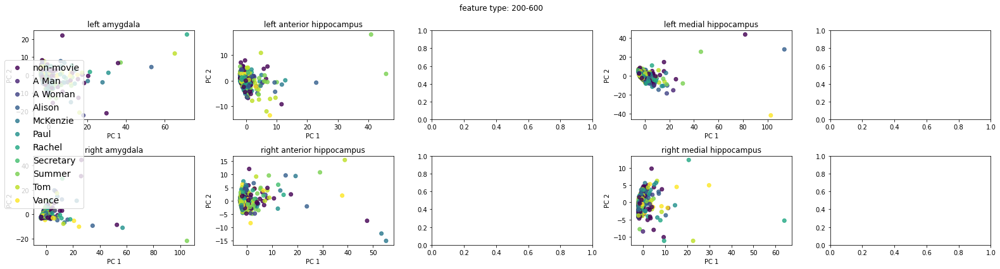

In [7]:
fig, axes = plt.subplots(2,5, figsize=(22,6))
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')                
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']
        
        if not X.empty:
            #2D PCA scatter plot
            pca = PCA(n_components=2)
            components = pca.fit_transform(X)

            scatter = axes[a,j].scatter(components[:,0], components[:,1], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            handles, labels = scatter.legend_elements()
            labels = class_labels
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/post_data_PCA_{feature_type}.png', facecolor='white', transparent=False)

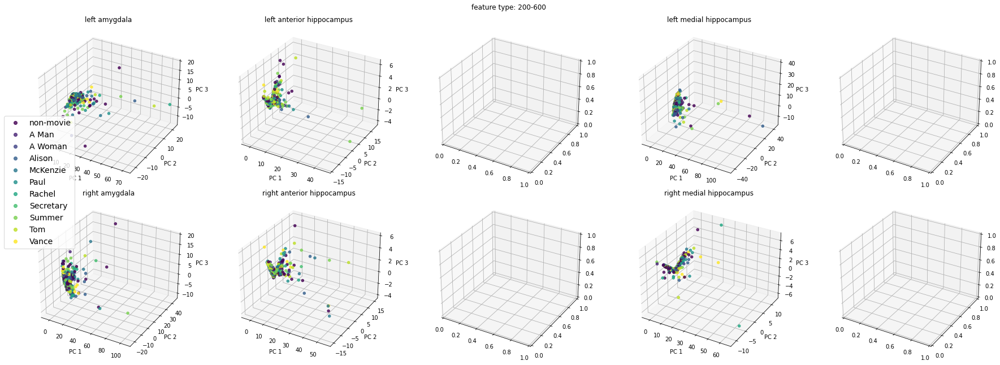

In [8]:
fig, axes = plt.subplots(2,5, figsize=(25,9), subplot_kw={"projection": "3d"})
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')              
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']
        
        if not X.empty:
            #3D PCA scatter plot
            pca = PCA(n_components=3)
            components = pca.fit_transform(X)

            scatter = axes[a,j].scatter(components[:,0], components[:,1], components[:,2], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            axes[a,j].set_zlabel('PC 3')
            handles, labels = scatter.legend_elements()
            labels = class_labels
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/pre_data_PCA3_{feature_type}.png', facecolor='white', transparent=False)


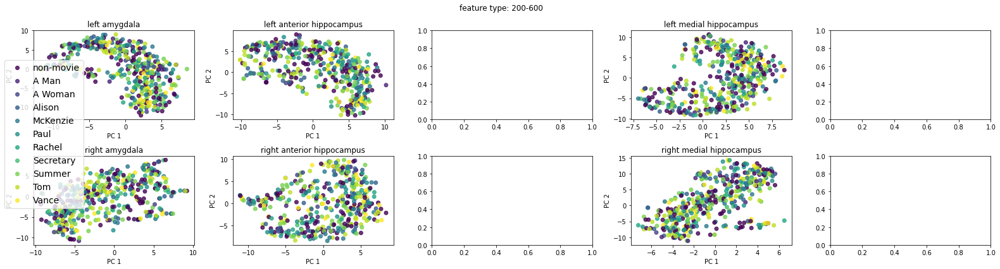

In [9]:
fig, axes = plt.subplots(2,5, figsize=(22,6))
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')              
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']

        if not X.empty:
            #2D t-SNE
            tsne = TSNE(n_components=2, verbose=0, perplexity=70, n_iter=5000)
            tsne_results = tsne.fit_transform(X)

            scatter = axes[a,j].scatter(tsne_results[:,0], tsne_results[:,1], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            handles, labels = scatter.legend_elements()
            labels = class_labels
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/post_data_tSNE_{feature_type}.png', facecolor='white', transparent=False)

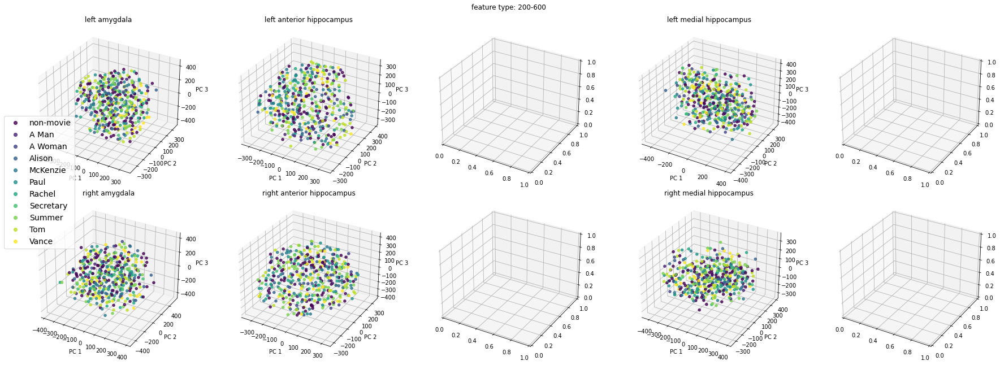

In [10]:
fig, axes = plt.subplots(2,5, figsize=(25,9), subplot_kw={"projection": "3d"})
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')                
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']
        
        if not X.empty:
            #3D t-SNE scatter plot
            tsne = TSNE(n_components=3, verbose=0, perplexity=40, n_iter=5000)
            tsne_results = tsne.fit_transform(X)

            scatter = axes[a,j].scatter(tsne_results[:,0], tsne_results[:,1], tsne_results[:,2], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            axes[a,j].set_zlabel('PC 3')
            handles, labels = scatter.legend_elements()
            labels = class_labels
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/pre_data_tSNE3_{feature_type}.png', facecolor='white', transparent=False)

Cumulative explained variation for 20 principal components: 0.9699867453737718
Cumulative explained variation for 20 principal components: 0.9748590648663507
Cumulative explained variation for 20 principal components: 0.9498474341675265
Cumulative explained variation for 20 principal components: 0.9151183920664849
Cumulative explained variation for 20 principal components: 0.9881941819218039
Cumulative explained variation for 20 principal components: 0.9794759065005091


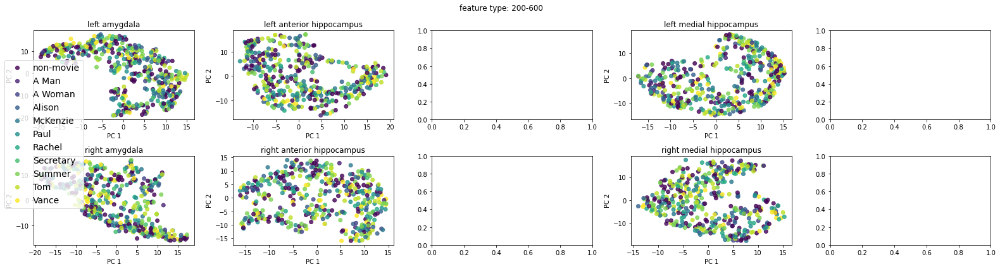

In [12]:
#do PCA (50 components) then tSNE
#https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b

fig, axes = plt.subplots(2,5, figsize=(22,6))
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')              
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']
        
        if not X.empty:
            #PCA
            pca = PCA(n_components=5)
            components = pca.fit_transform(X)
            print('Cumulative explained variation for 20 principal components: {}'.format(np.sum(pca.explained_variance_ratio_)))

            tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=3000)
            tsne_results = tsne.fit_transform(components)

            scatter = axes[a,j].scatter(tsne_results[:,0], tsne_results[:,1], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            handles, labels = scatter.legend_elements()
            labels = class_labels
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/post_data_PCA_{feature_type}.png', facecolor='white', transparent=False)

In [ ]:
fig, axes = plt.subplots(2,5, figsize=(25,9), subplot_kw={"projection": "3d"})
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[df_patient_info_new['brain_area'].str.contains(brain_area)]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')                
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        y = classes['is_500_days']

        #3D t-SNE scatter plot
        tsne = TSNE(n_components=3, verbose=0, perplexity=40, n_iter=5000)
        tsne_results = tsne.fit_transform(X)

        scatter = axes[a,j].scatter(tsne_results[:,0], tsne_results[:,1], tsne_results[:,2], c=y, alpha=0.8)
        axes[a,j].set_title(f'{brain_area}')
        axes[a,j].set_xlabel('PC 1')
        axes[a,j].set_ylabel('PC 2')
        axes[a,j].set_zlabel('PC 3')
        handles, labels = scatter.legend_elements()
        labels = class_labels
        #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/pre_data_tSNE3_{feature_type}.png', facecolor='white', transparent=False)

In [42]:
class_labels

array(['non-movie', 'A Man', 'A Woman', 'Alison', 'McKenzie', 'Paul',
       'Rachel', 'Secretary', 'Summer', 'Tom', 'Vance'], dtype=object)

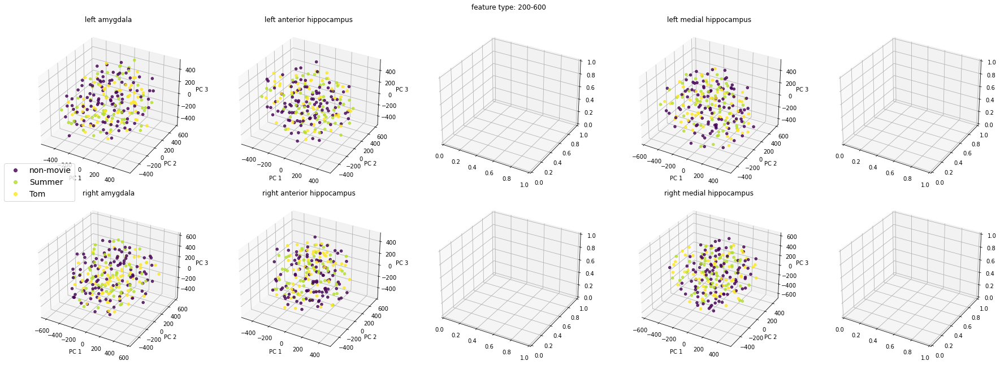

In [44]:
list_of_stim = [0,8,9]

fig, axes = plt.subplots(2,5, figsize=(25,9), subplot_kw={"projection": "3d"})
feature_type = '200-600'
fig.suptitle(f'feature type: {feature_type}')
for a in range(len(arr)):
    br_areas = arr[a]
    for j in range(len(br_areas)):
        if a == 0:
            brain_area = brain_areas[j]
        else:
            brain_area = brain_areas[j+5]
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')               
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        #for multiclass one-vs-one: belongs to movie or not
        X = df_data_post[df_data_post.columns & cols_to_use]
        X['is_500_days'] = classes['is_500_days'].values
        X = X[X['is_500_days'].isin(list_of_stim)]
        X = X.drop(columns = ['is_500_days'])
        y = classes[classes['is_500_days'].isin(list_of_stim)]
        y = y['is_500_days']
        
        if not X.empty:
            #3D t-SNE scatter plot
            tsne = TSNE(n_components=3, verbose=0, perplexity=40, n_iter=5000)
            tsne_results = tsne.fit_transform(X)

            scatter = axes[a,j].scatter(tsne_results[:,0], tsne_results[:,1], tsne_results[:,2], c=y, alpha=0.8)
            axes[a,j].set_title(f'{brain_area}')
            axes[a,j].set_xlabel('PC 1')
            axes[a,j].set_ylabel('PC 2')
            axes[a,j].set_zlabel('PC 3')
            handles, labels = scatter.legend_elements()
            labels = ['non-movie', 'Summer', 'Tom']
            #axes[a,j].legend(handles, labels)

plt.tight_layout()
fig.legend(handles, labels, loc='center left', prop={'size': 14})
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/data/pre_data_tSNE3_{feature_type}.png', facecolor='white', transparent=False)

0
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.38±0.23
mean balanced accuracy: 0.5±0.01
mean recall: 0.28±0.44
mean precision: 0.41±0.41
mean F1: 0.26±0.25
mean kappa: -0.0±

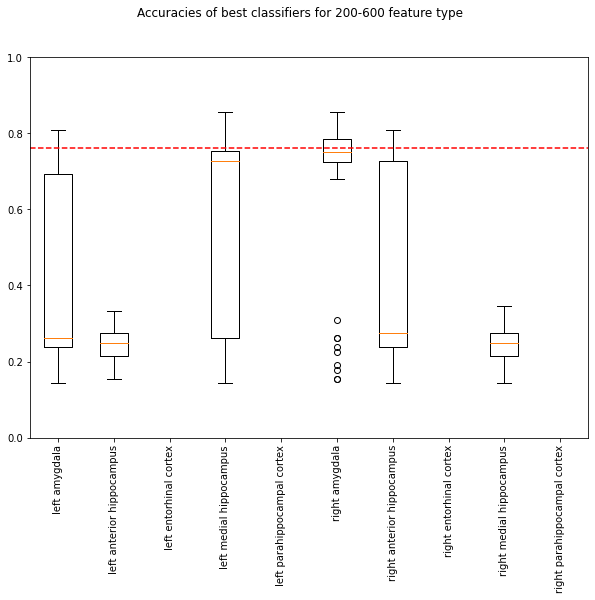

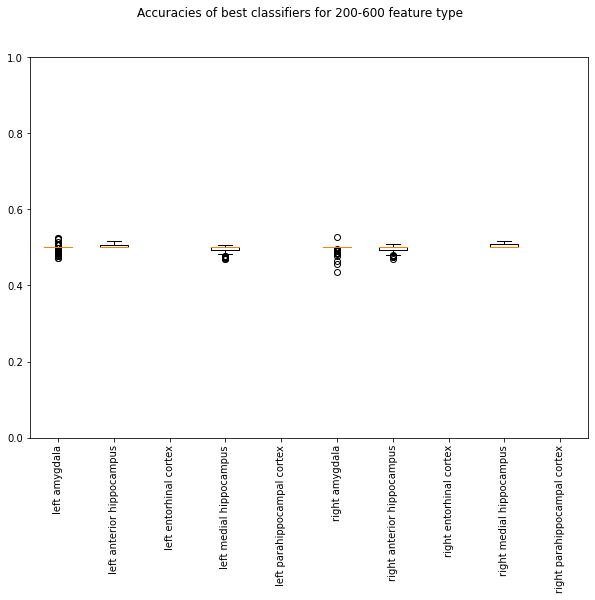

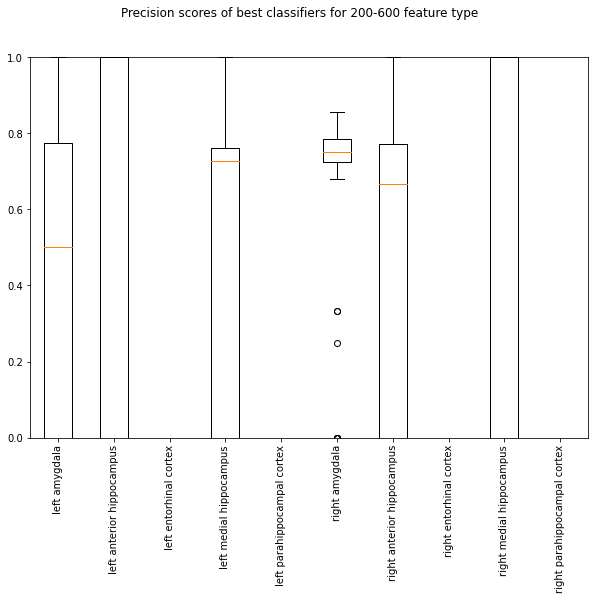

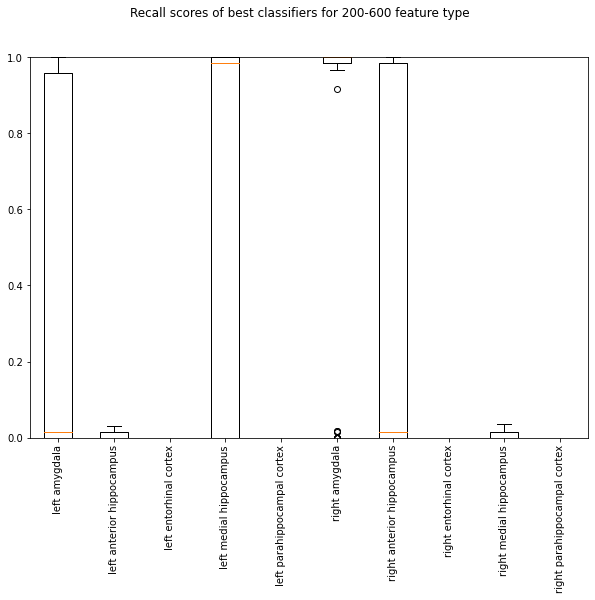

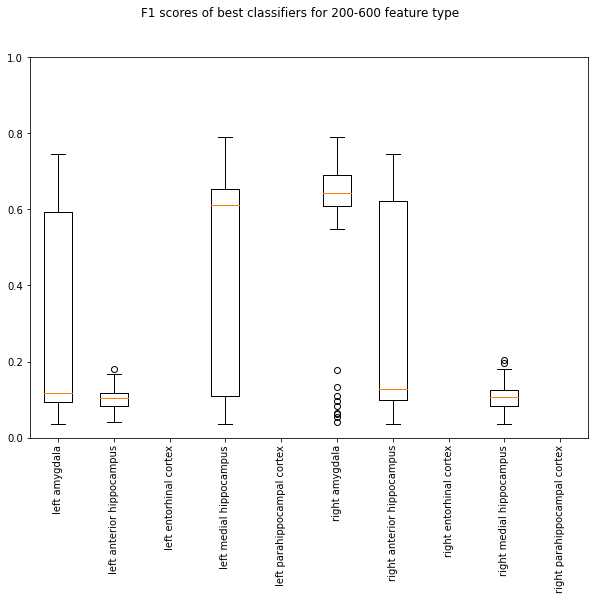

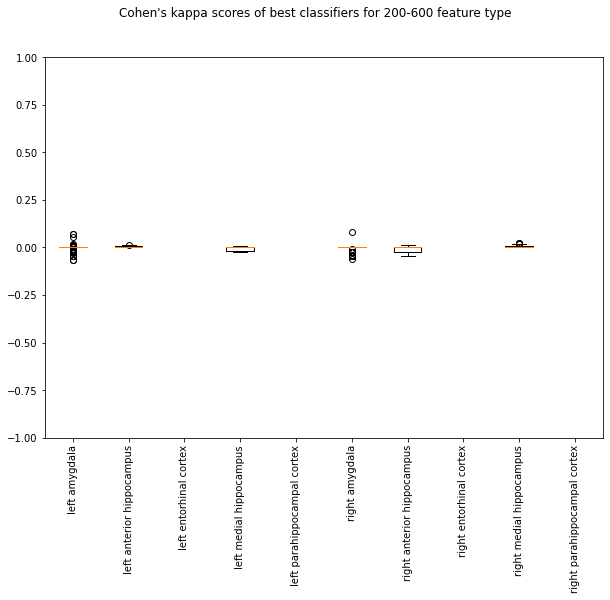

1
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.22±0.23
mean balanced accuracy: 0.48±0.11
mean recall: 0.58±0.49
mean precision: 0.22±0.35
mean F1: 0.15±0.21
mean kappa: -0.0

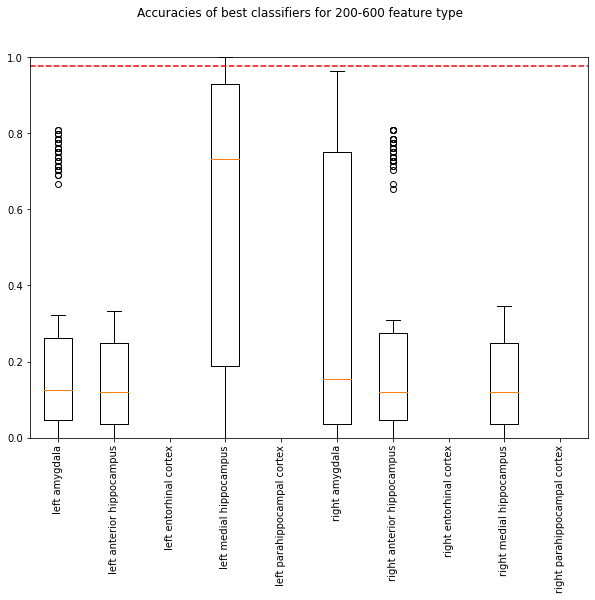

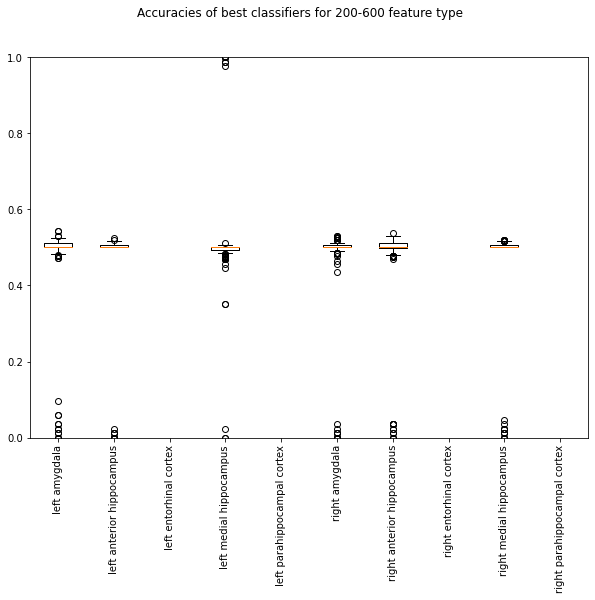

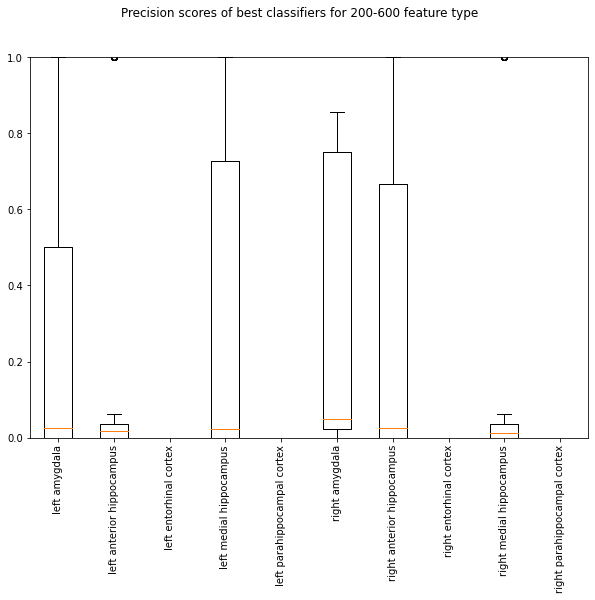

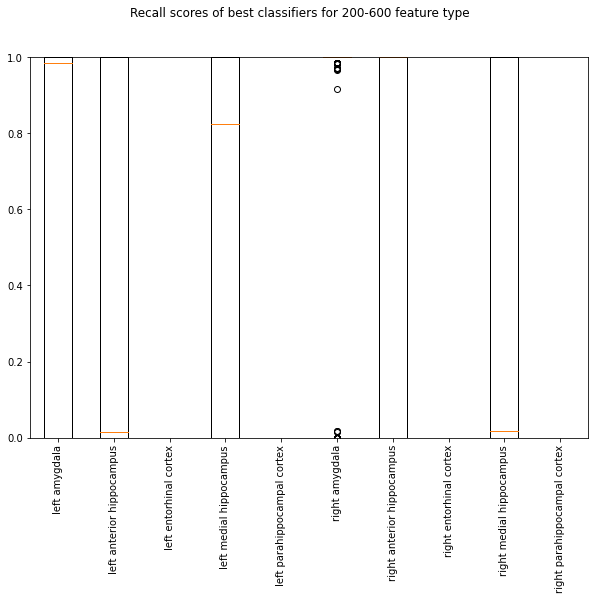

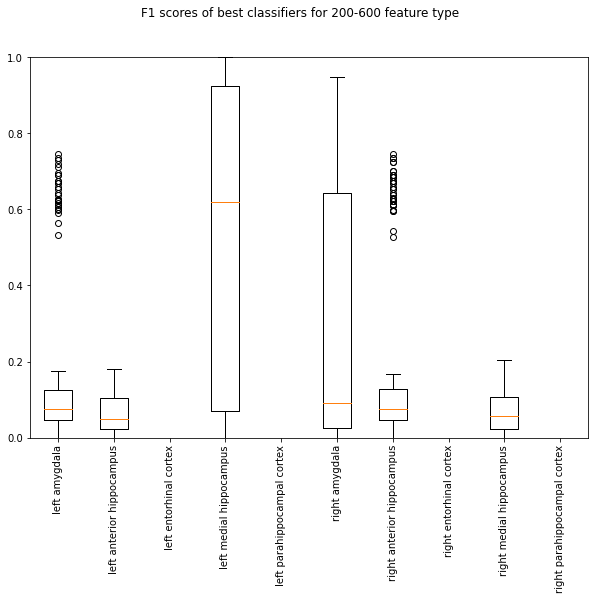

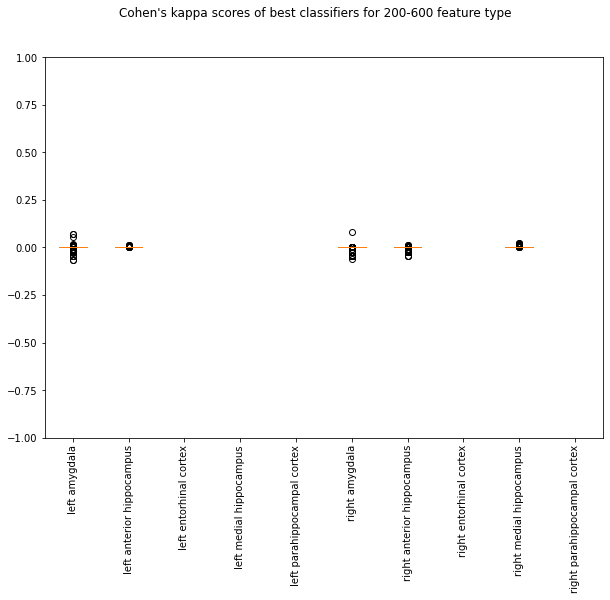

2
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.39±0.39
mean balanced accuracy: 0.5±0.13
mean recall: 0.46±0.49
mean precision: 0.15±0.3
mean F1: 0.35±0.4
mean kappa: nan±nan

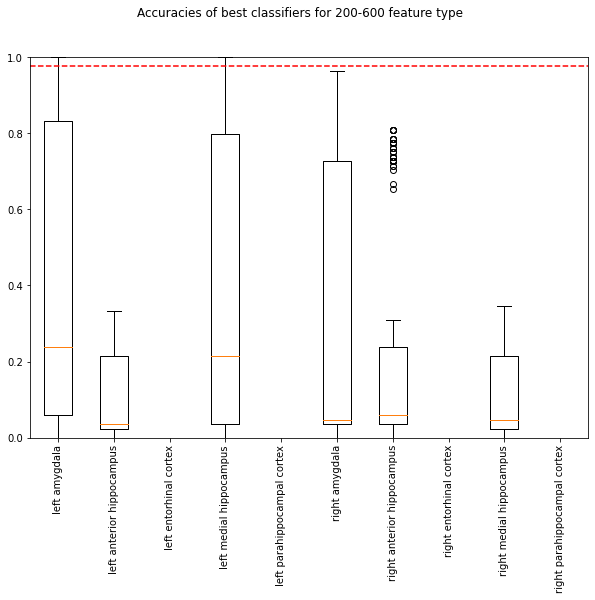

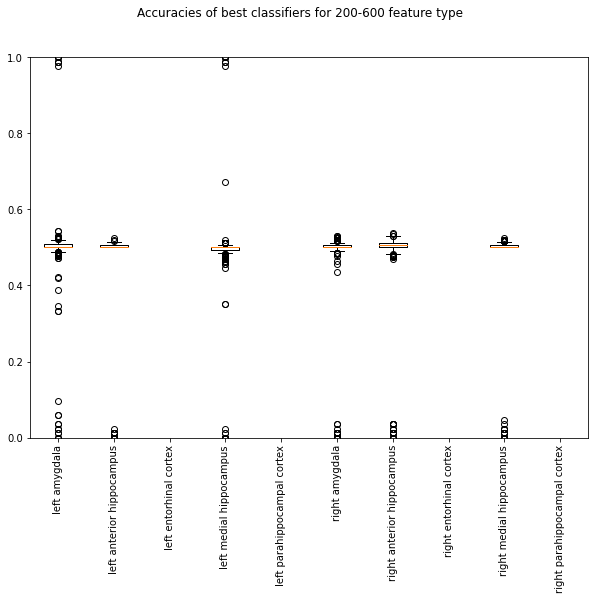

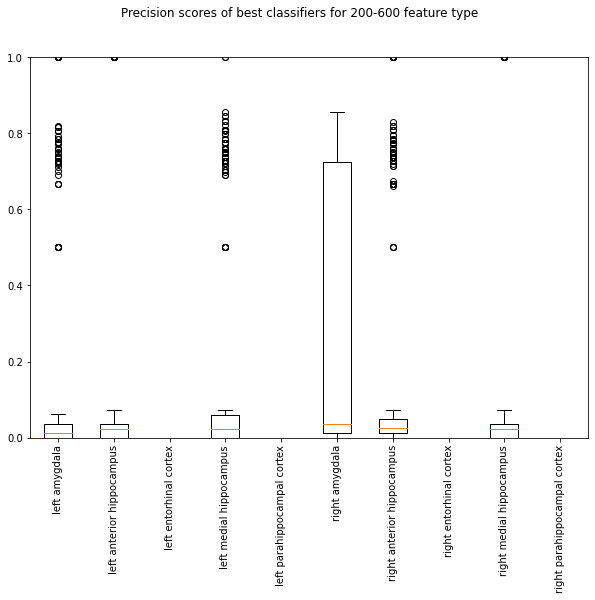

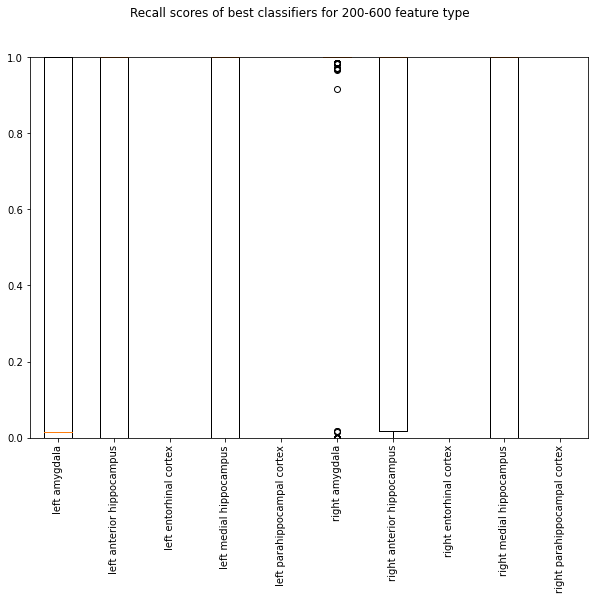

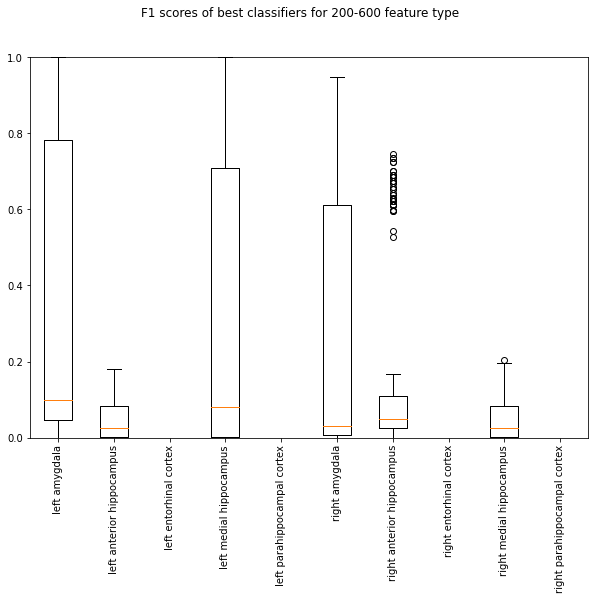

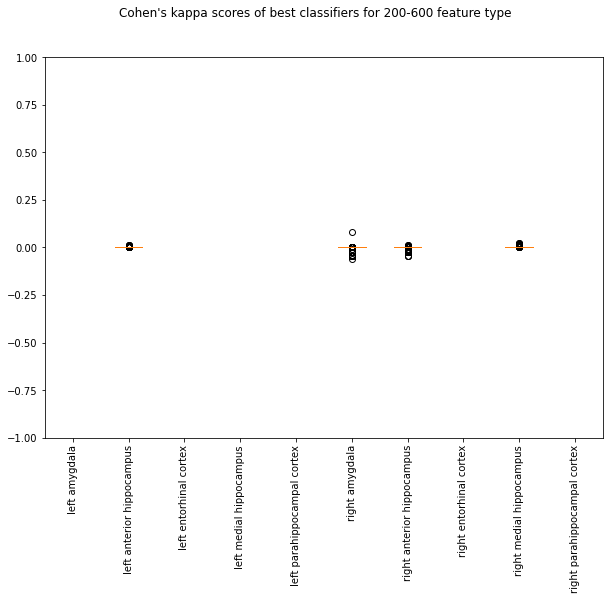

3
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.47±0.41
mean balanced accuracy: 0.49±0.11
mean recall: 0.4±0.48
mean precision: 0.12±0.27
mean F1: 0.43±0.42
mean kappa: nan±n

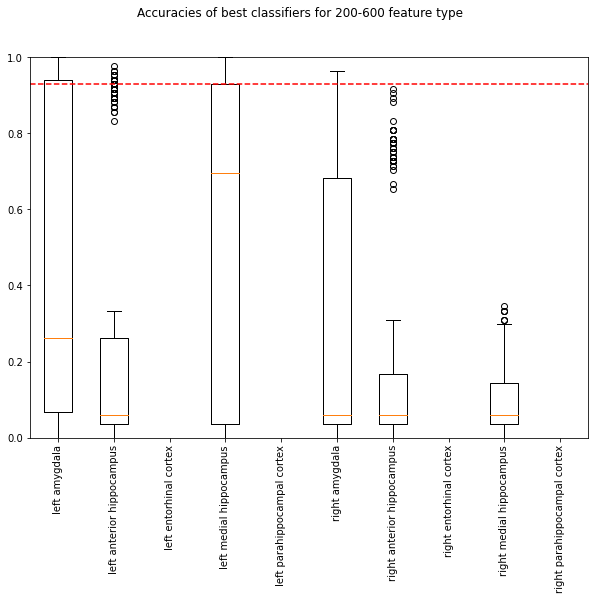

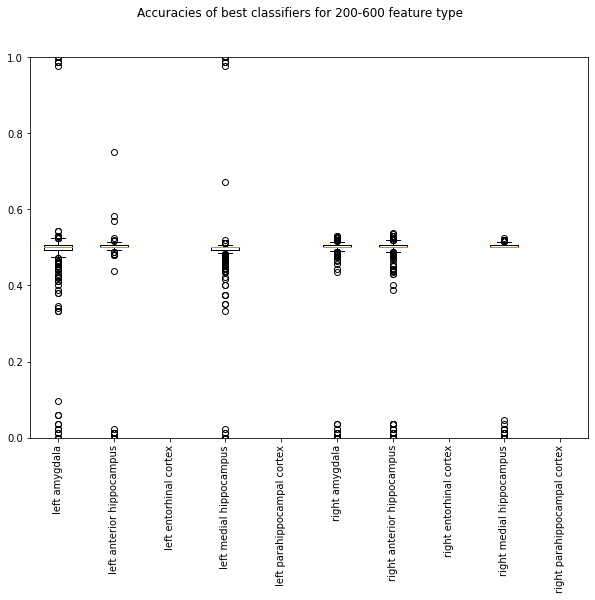

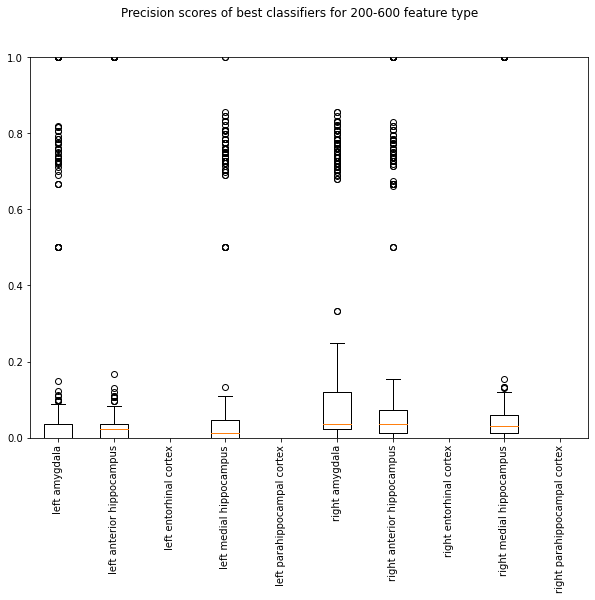

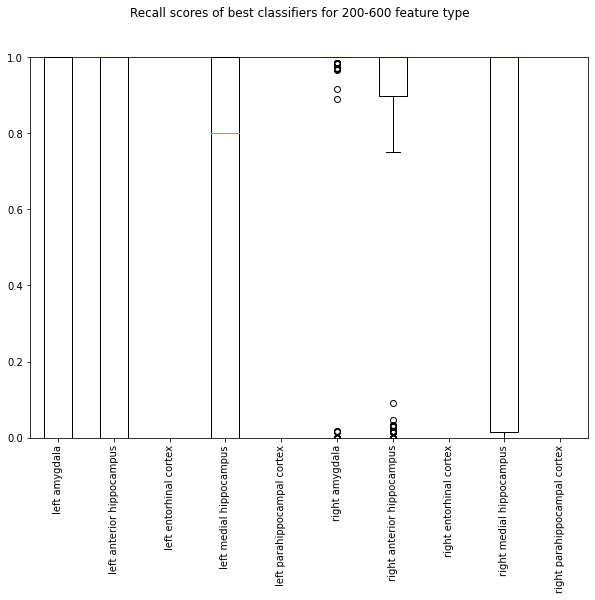

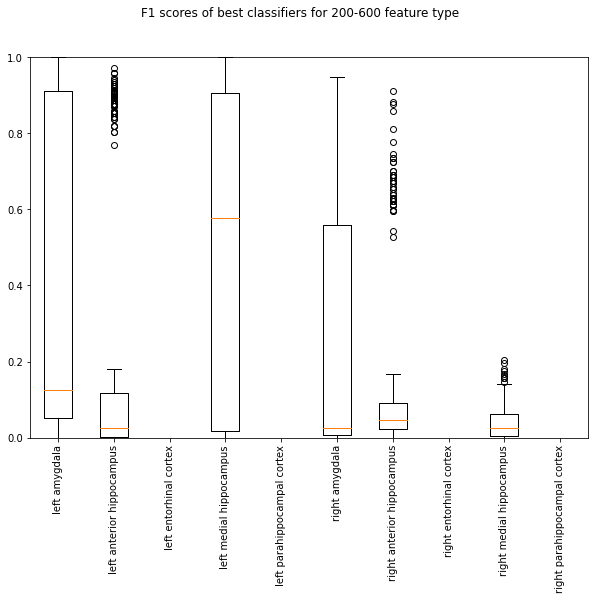

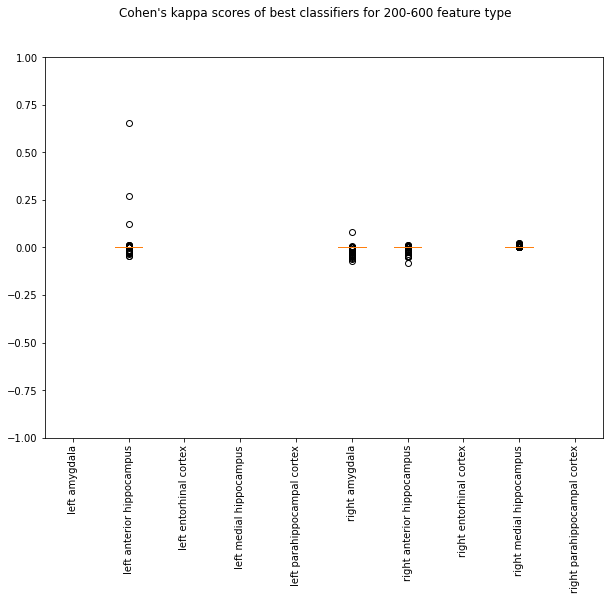

4
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.4±0.39
mean balanced accuracy: 0.49±0.1
mean recall: 0.52±0.49
mean precision: 0.11±0.24
mean F1: 0.35±0.41
mean kappa: nan±na

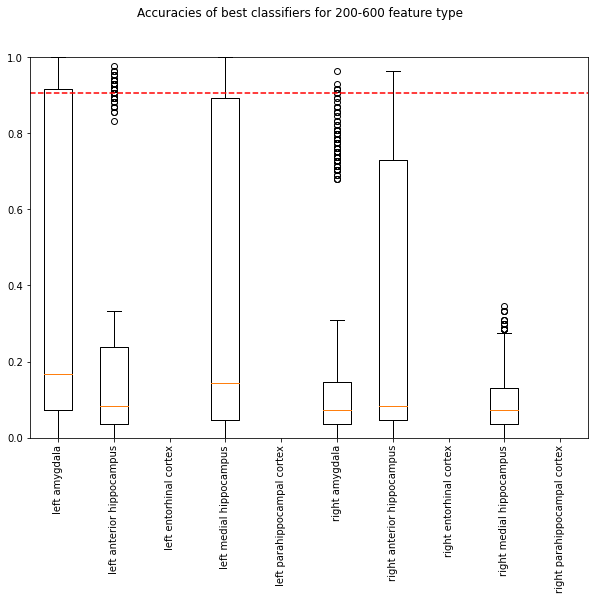

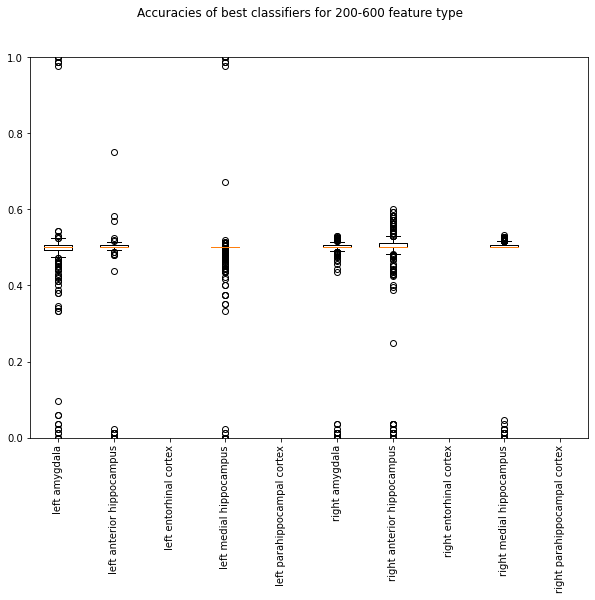

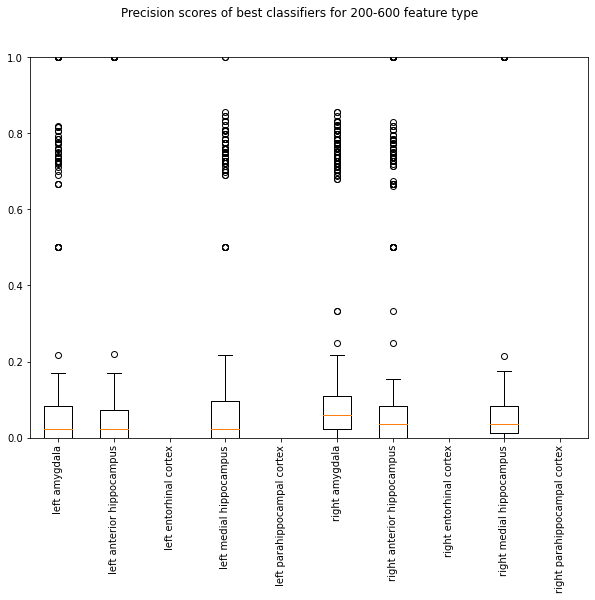

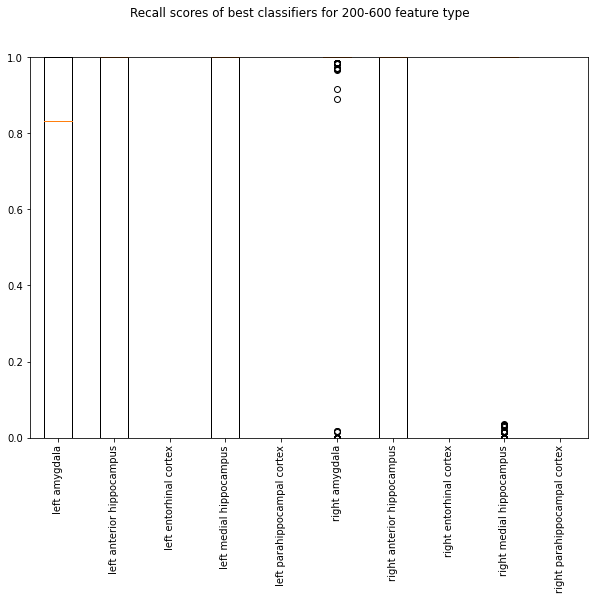

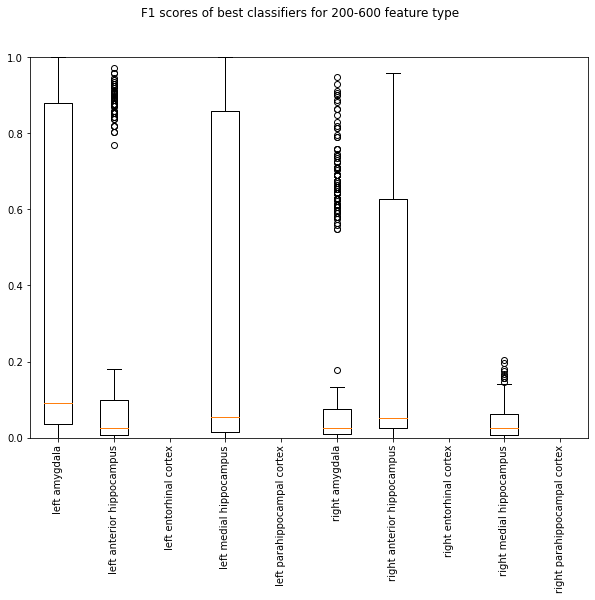

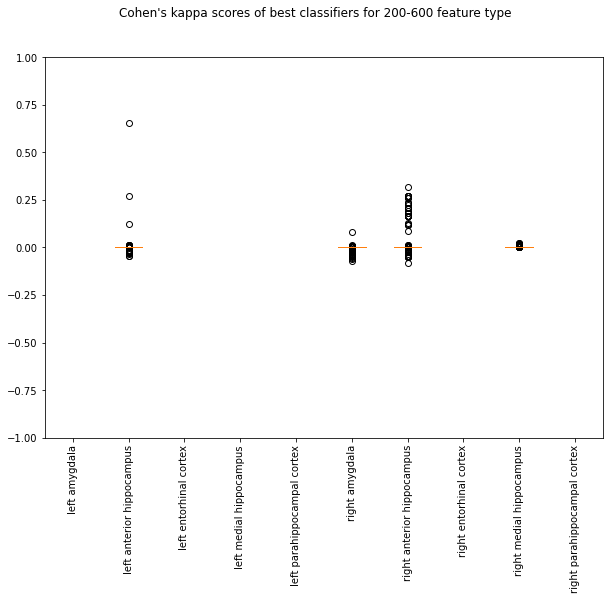

5
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.35±0.38
mean balanced accuracy: 0.49±0.09
mean recall: 0.59±0.48
mean precision: 0.11±0.22
mean F1: 0.3±0.39
mean kappa: nan±n

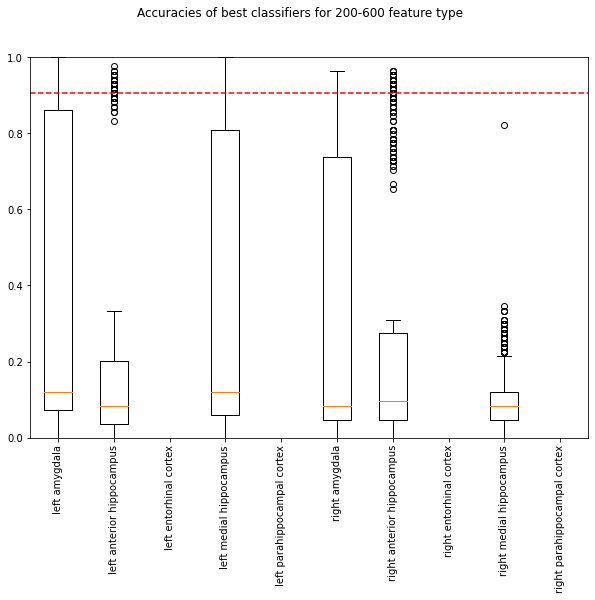

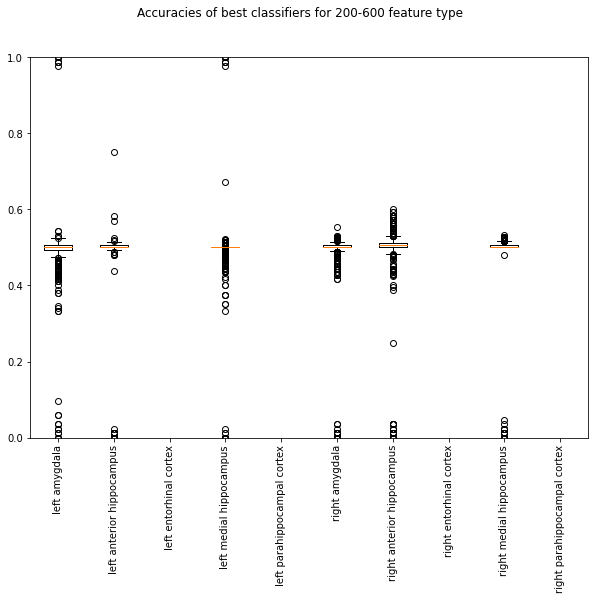

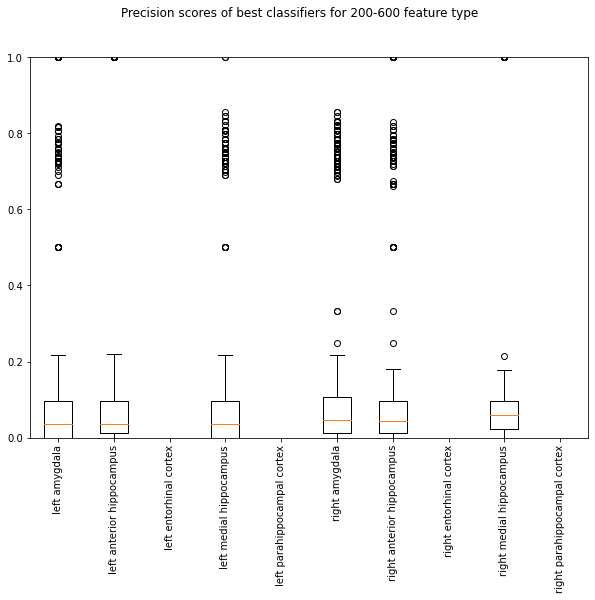

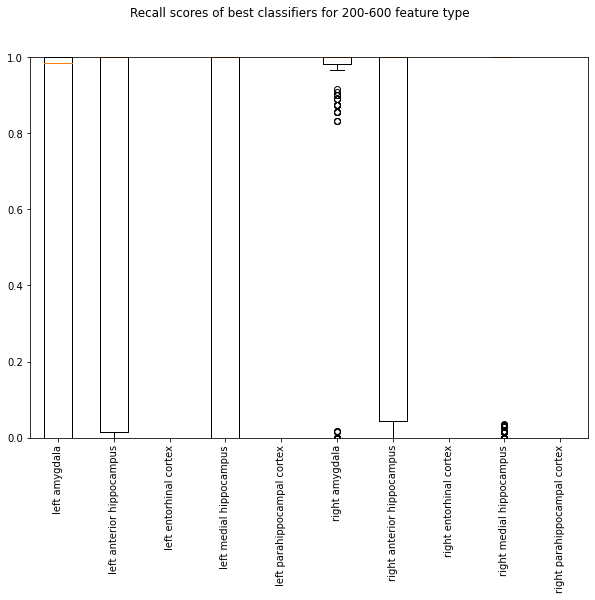

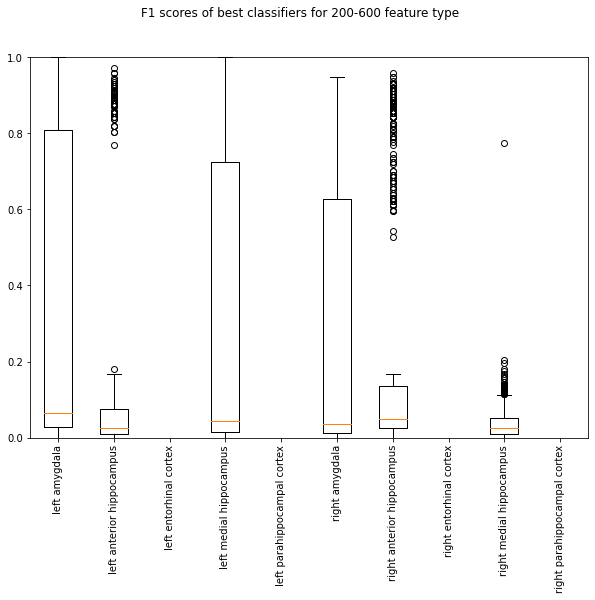

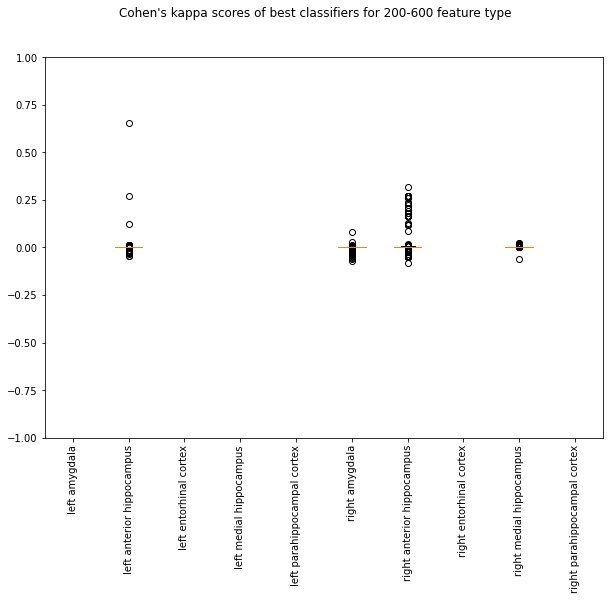

6
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.4±0.4
mean balanced accuracy: 0.49±0.09
mean recall: 0.54±0.48
mean precision: 0.1±0.21
mean F1: 0.35±0.41
mean kappa: nan±nan

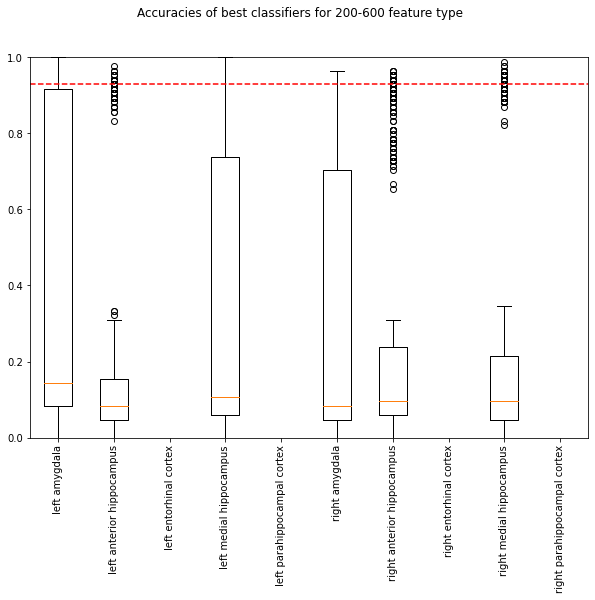

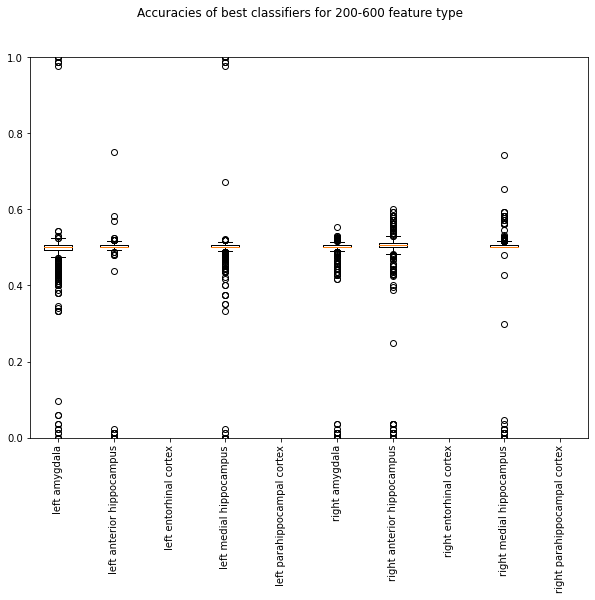

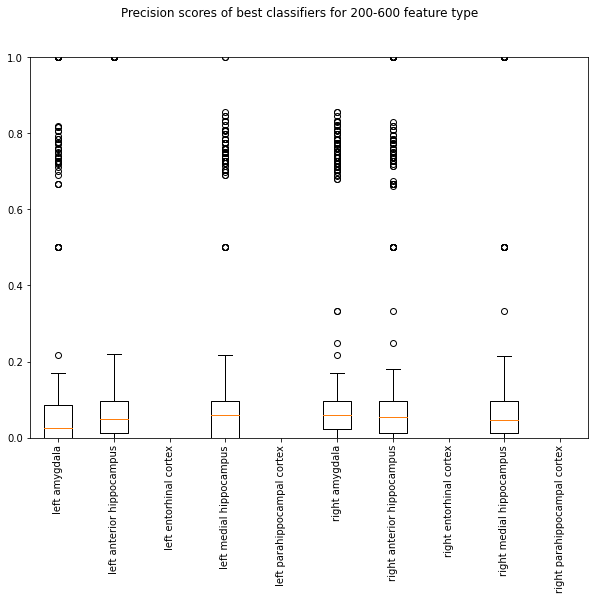

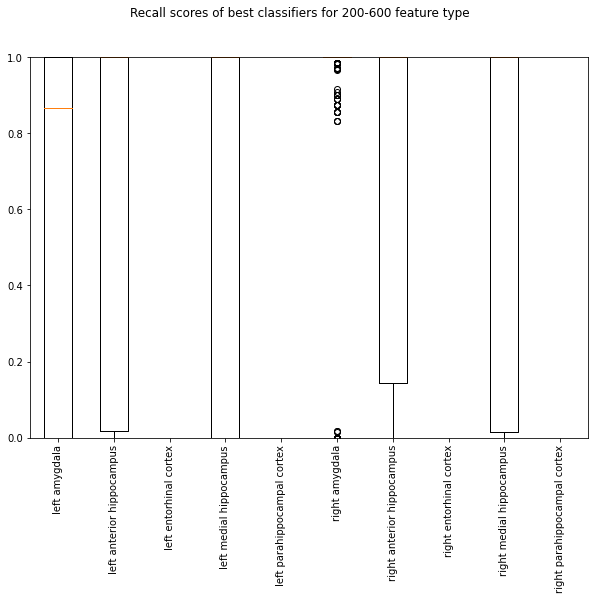

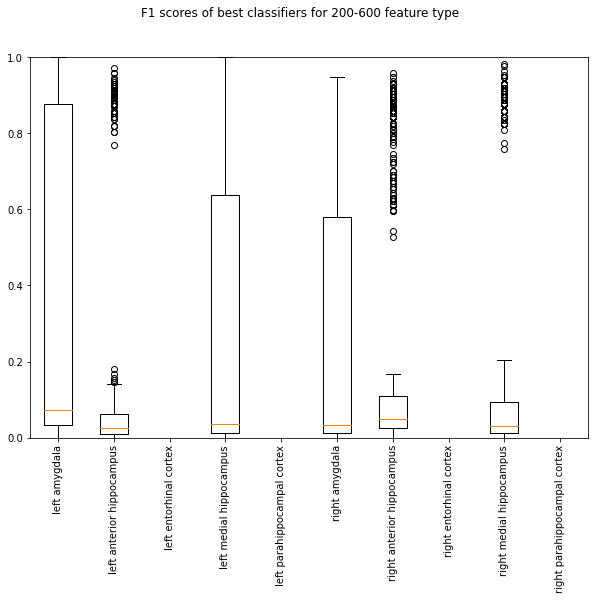

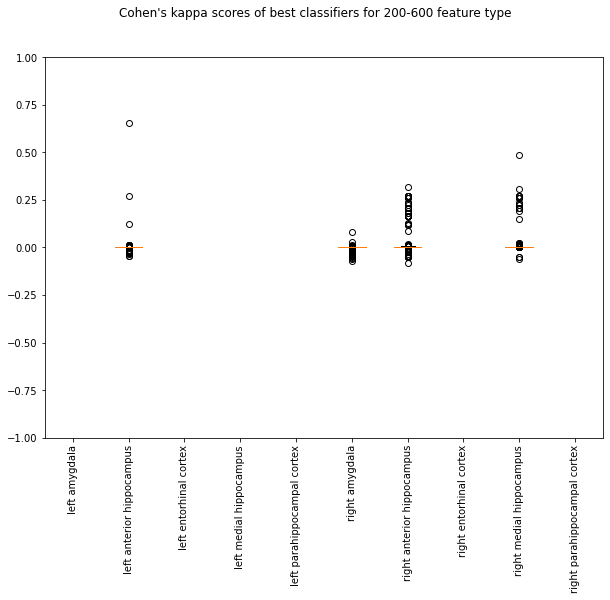

7
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.36±0.39
mean balanced accuracy: 0.49±0.1
mean recall: 0.58±0.48
mean precision: 0.09±0.2
mean F1: 0.31±0.4
mean kappa: nan±nan

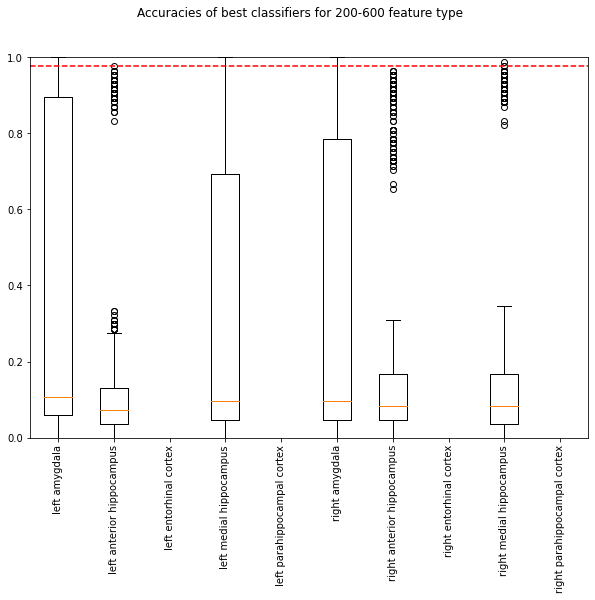

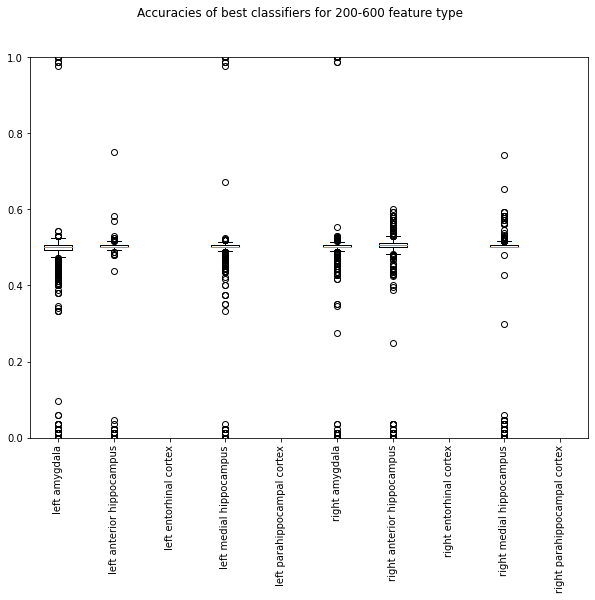

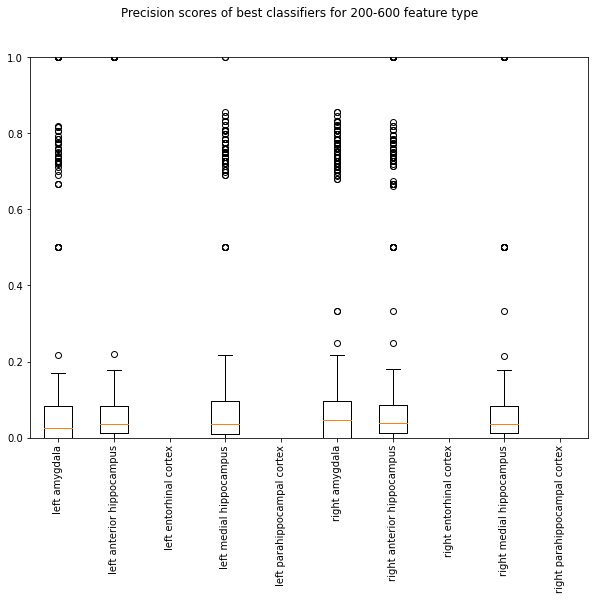

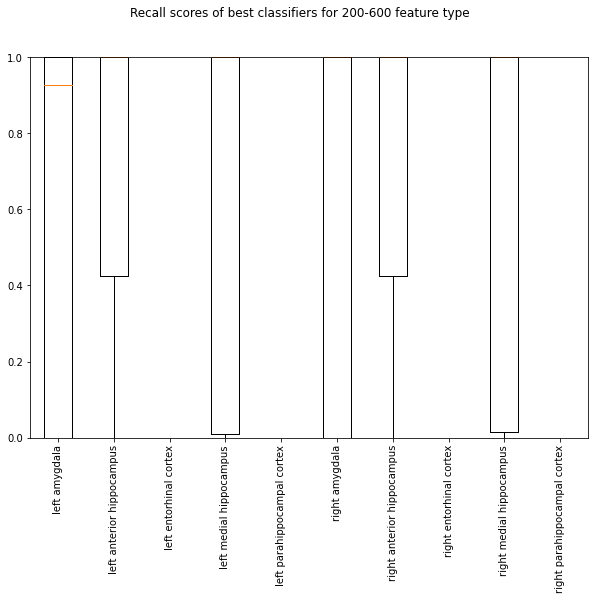

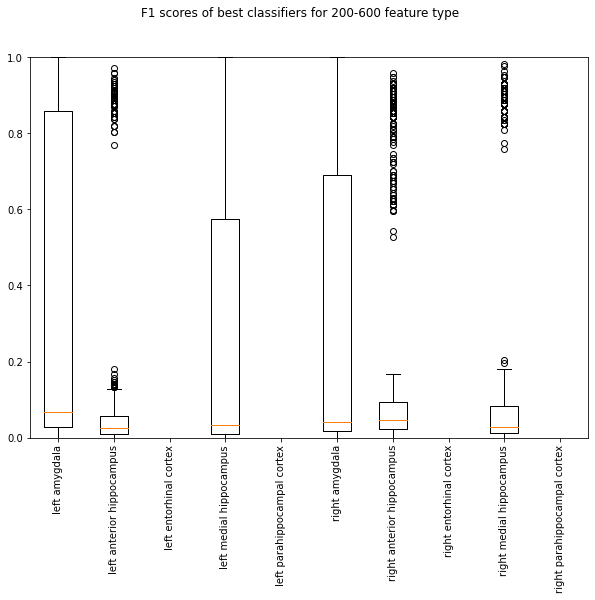

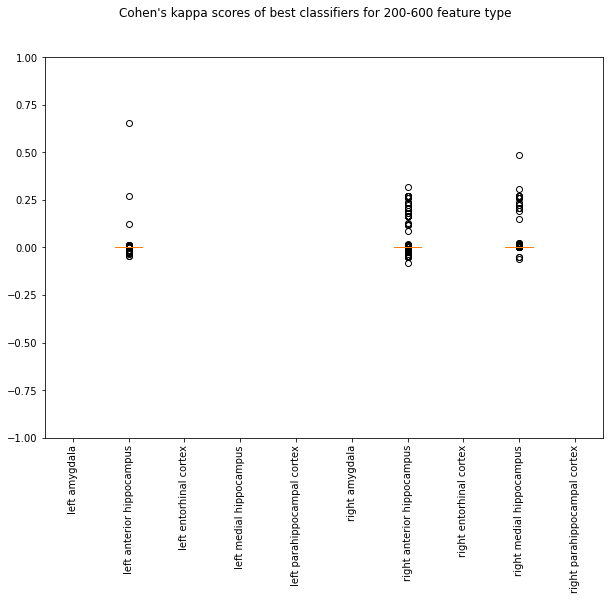

8
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.33±0.37
mean balanced accuracy: 0.49±0.1
mean recall: 0.62±0.47
mean precision: 0.09±0.19
mean F1: 0.29±0.38
mean kappa: nan±n

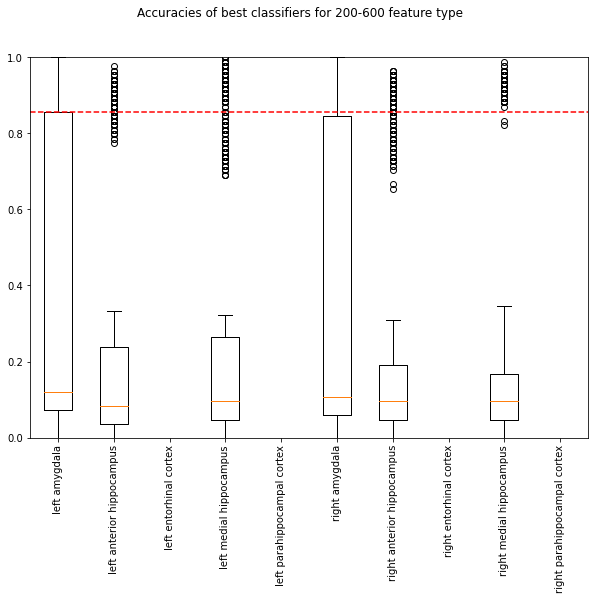

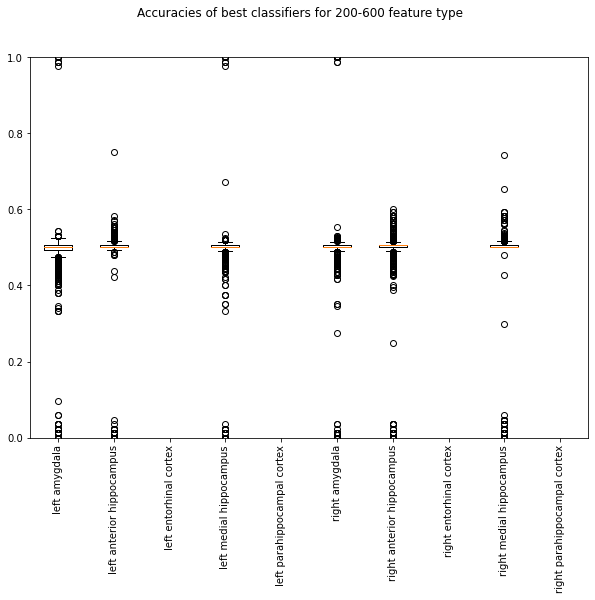

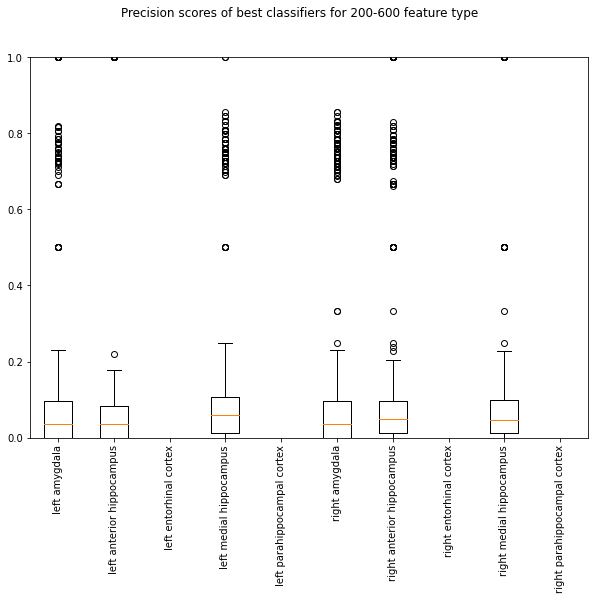

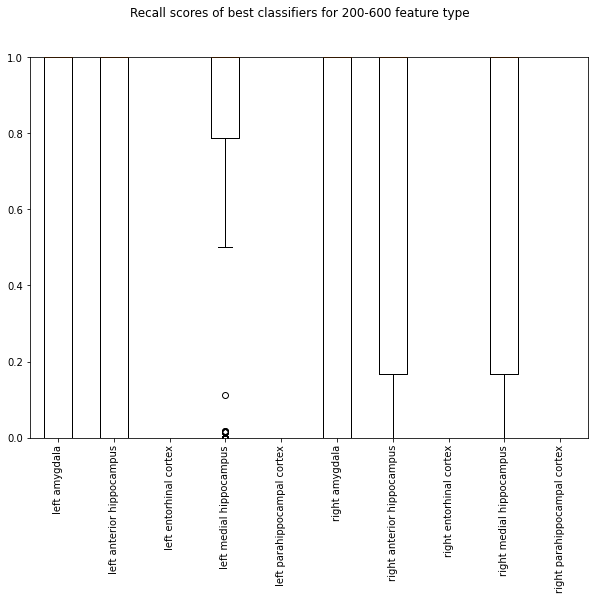

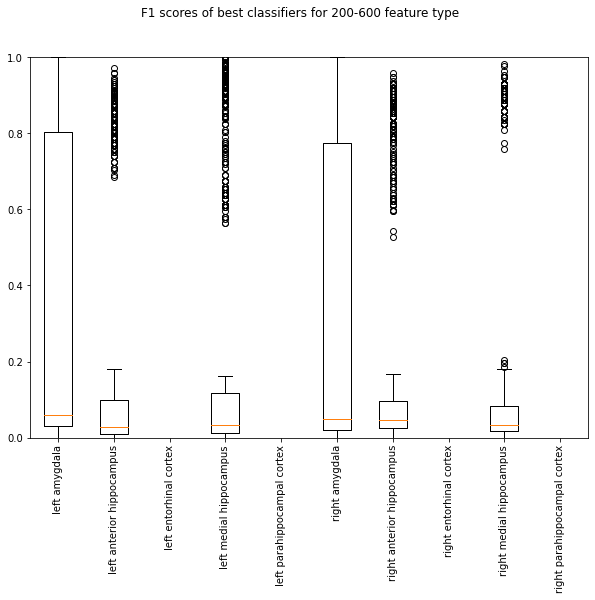

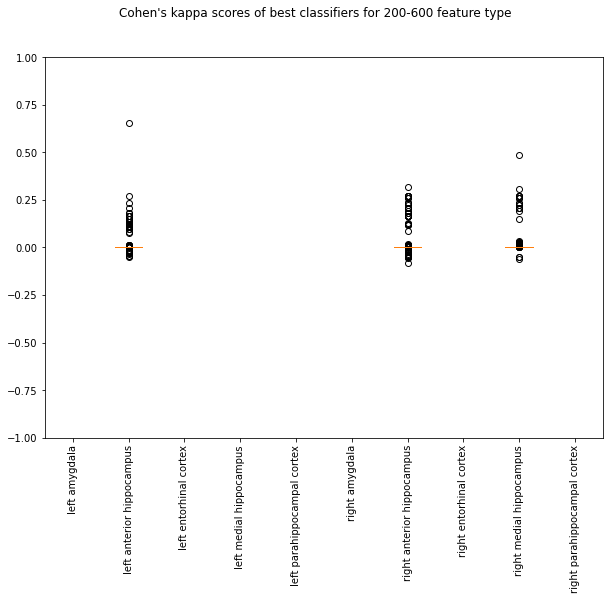

9
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.37±0.38
mean balanced accuracy: 0.49±0.09
mean recall: 0.58±0.48
mean precision: 0.09±0.18
mean F1: 0.32±0.39
mean kappa: nan±

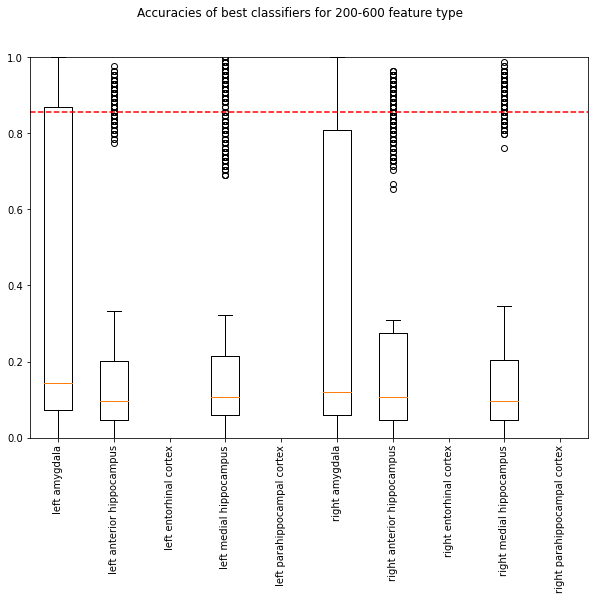

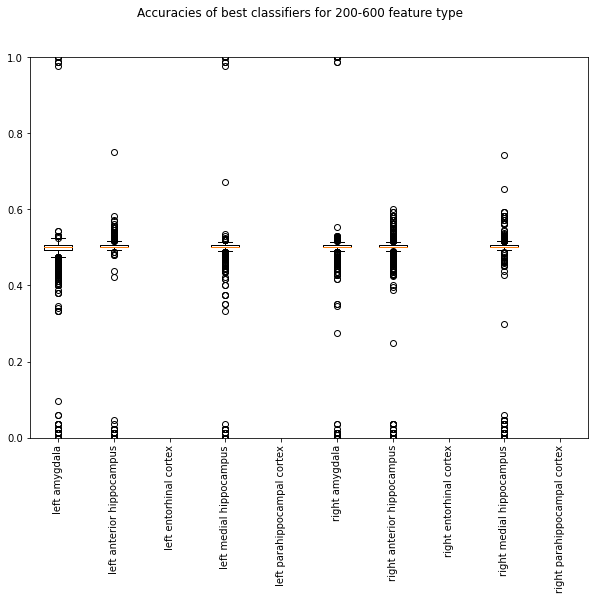

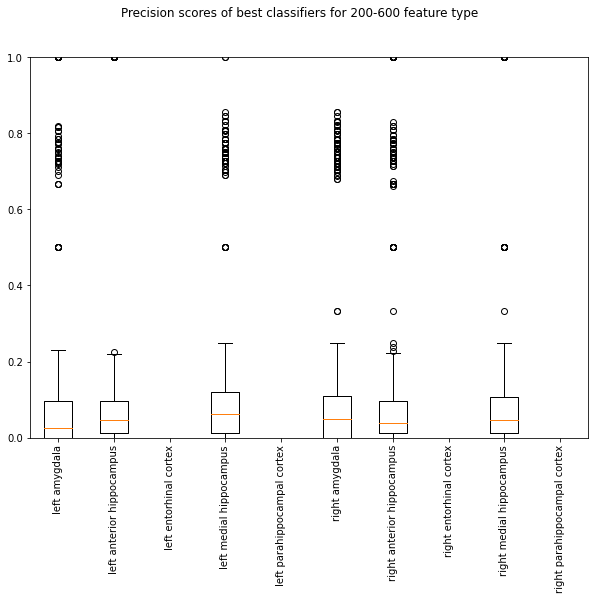

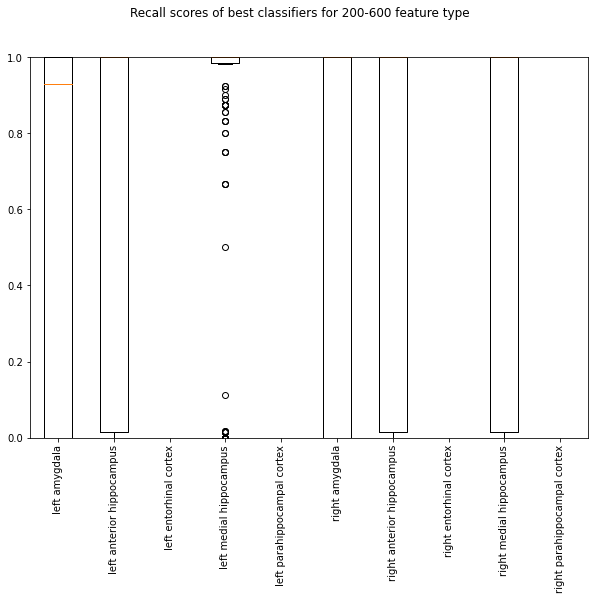

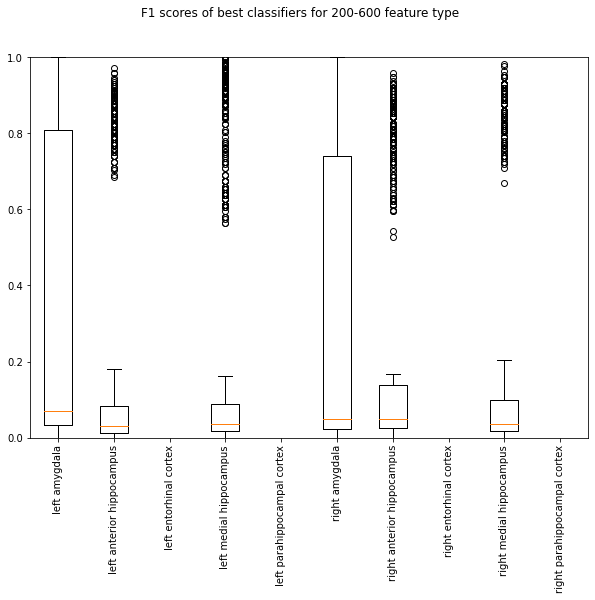

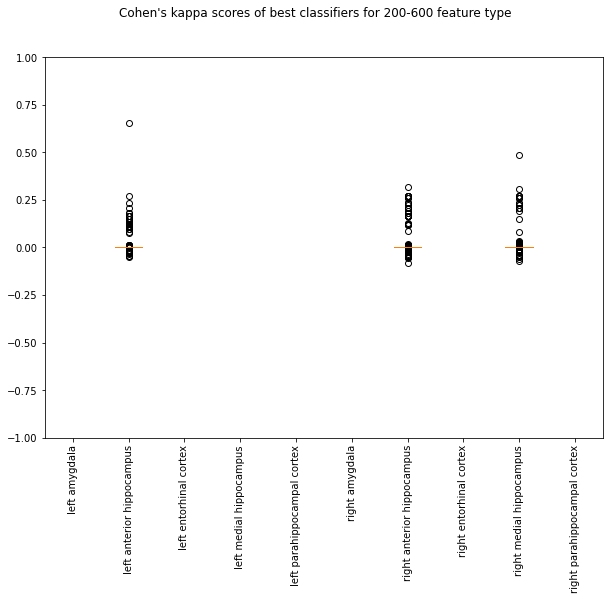

10
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.35±0.37
mean balanced accuracy: 0.49±0.09
mean recall: 0.62±0.47
mean precision: 0.08±0.17
mean F1: 0.3±0.38
mean kappa: nan±

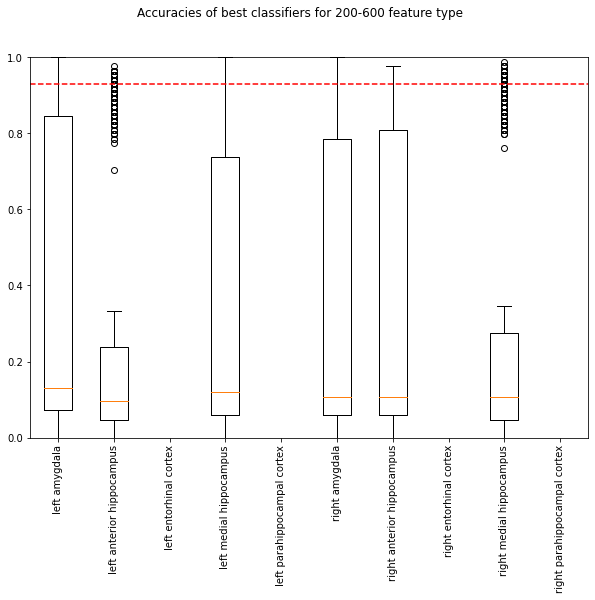

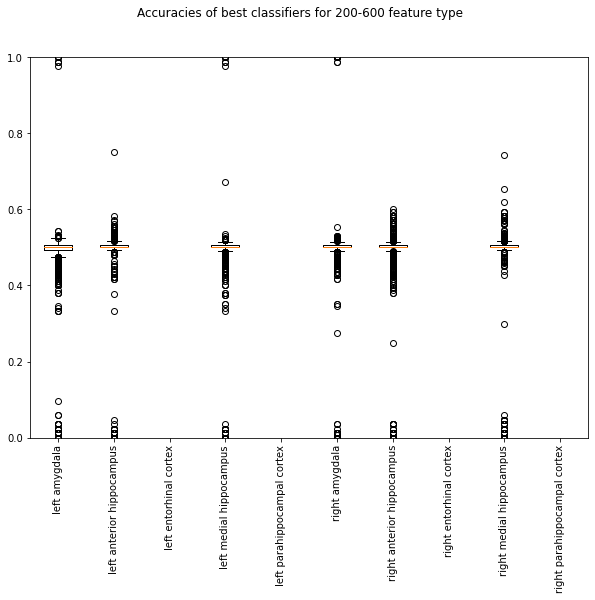

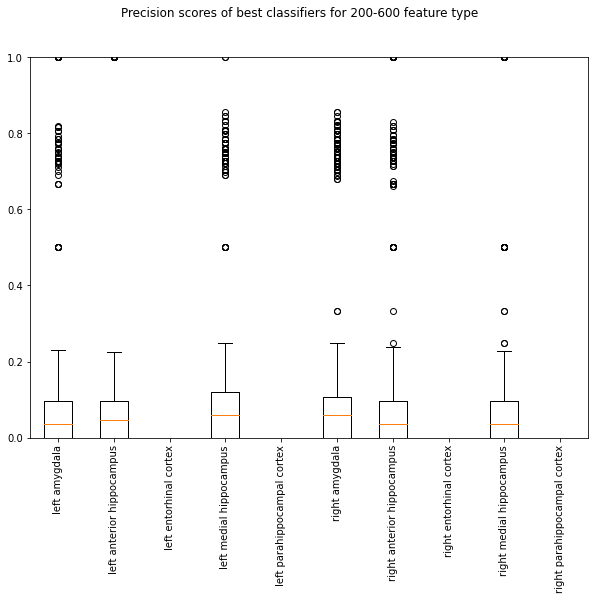

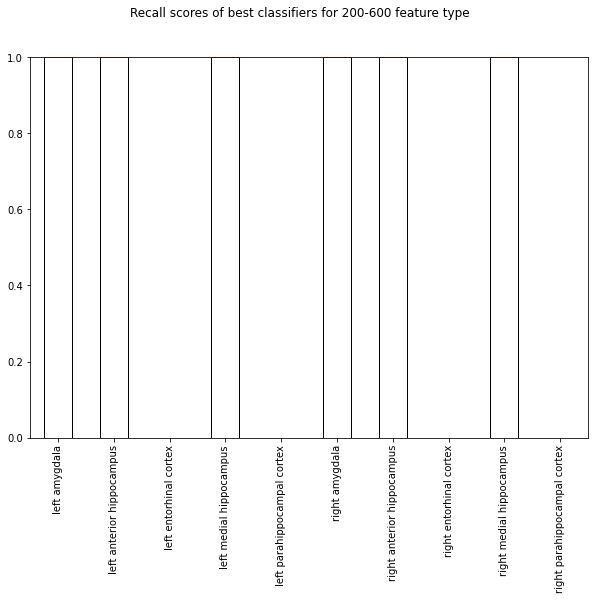

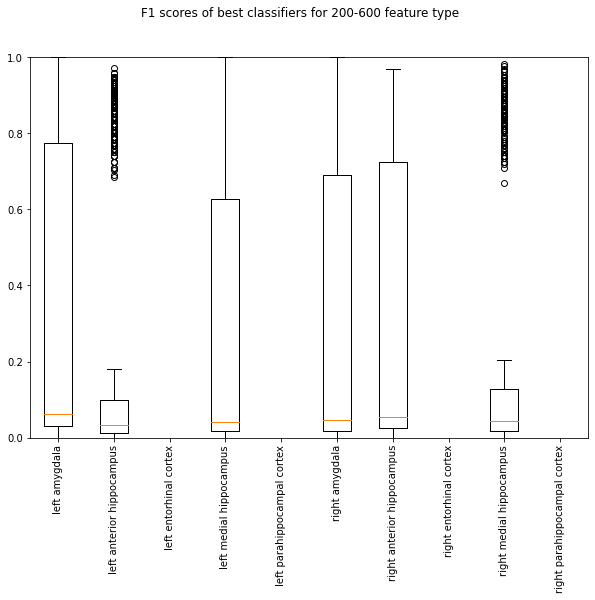

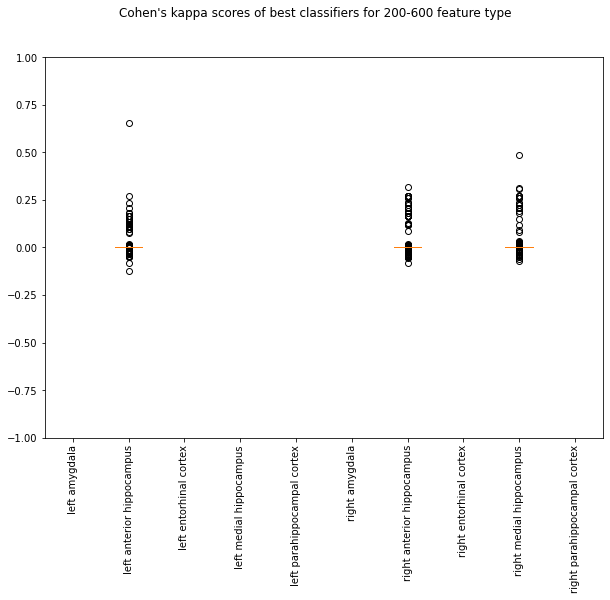

In [26]:
#NEW
#random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        #print(label)
        best_params_list_per_area = []
        best_classifier = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()

        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        X = df_data_post[df_data_post.columns & cols_to_use]

        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        movie_stim_percentage = (numb*100)/numb_all
        if label == 0:
            movie_stim_percentage = movie_stim_percentage
        else:
            movie_stim_percentage = 100 - movie_stim_percentage

        if not X.empty:
            for rand_seed in random_seeds:
                np.random.seed(rand_seed) #for train-test split
                strings.append(rand_seed)
                best_params = {}

                # Use a K-fold cross validation with different parameters
                # Create all parameter combinations
                params = {'random_state': [rand_seed],
                          'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                          'loss': ['hinge', 'squared_hinge'],    
                          'penalty': ['l1', 'l2'],
                          #'gamma': ['scale', 'auto'],
                          #'degree': [3]
                         }
                # Create all possible parameter combinations
                combinations_linear = [[i, j, k, l] for i in params['random_state']
                               for j in params['C']
                               for k in params['loss']
                               for l in params ['penalty']]
                for s in reversed(combinations_linear):
                    if (s[2] == 'hinge') and (s[3]=='l1'):
                        combinations_linear.remove(s)
                combinations = [[i, j] for i in params['random_state']
                               for j in params['C']
                               #for l in params['gamma']
                               #for k in params['degree']
                               ]

                for kernel in kernels:
                    if kernel == 'linear':
                        losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations_linear, kernel, rand_seed, 'oversampling')
                    else:
                        losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations, kernel, rand_seed, 'oversampling') 

                    all_losses.append([losses, brain_area])

        
    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_precisions_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_recalls_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_f1s_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_kappas_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, movie_stim_percentage, fig_save_path)

0
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.75±0.04
mean balanced accuracy: 0.5±0.01
mean recall: 0.98±0.02
mean precision: 0.76±0.04
mean F1: 0.66±0.06
mean kappa: -0.01

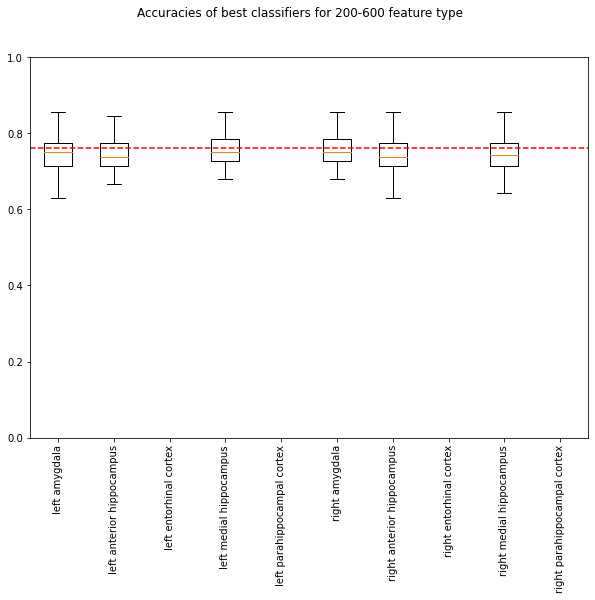

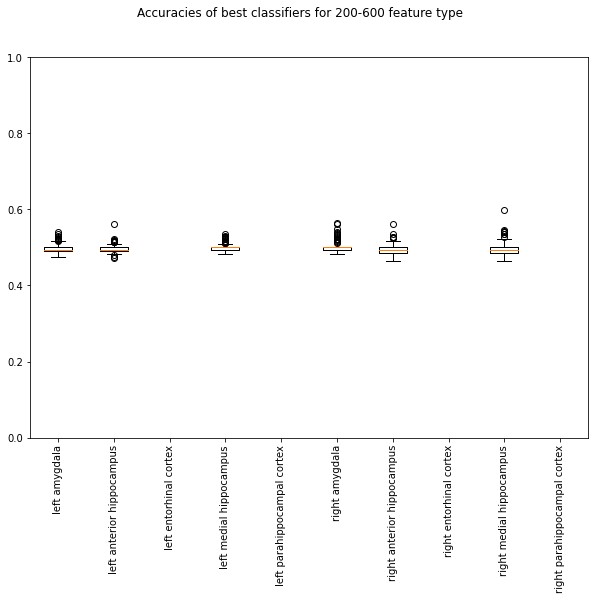

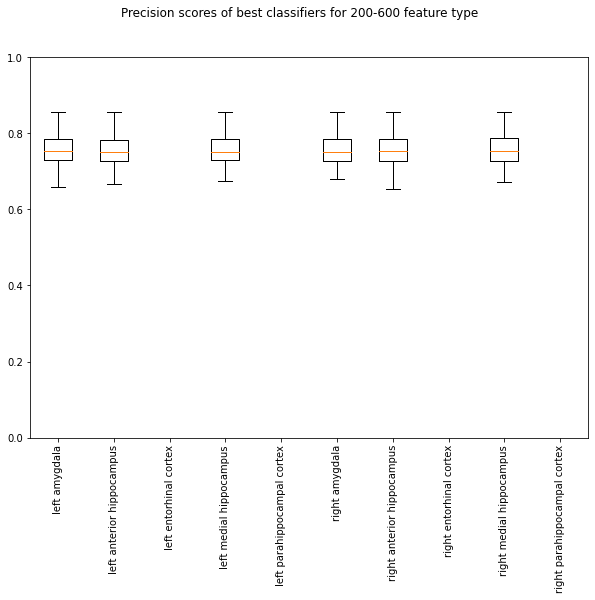

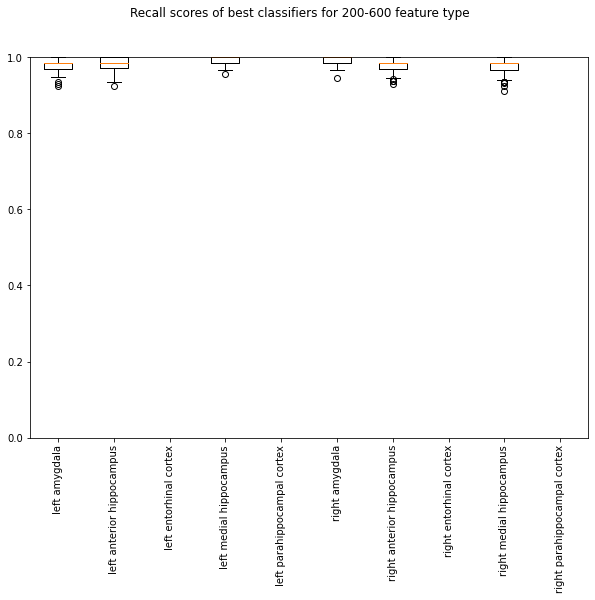

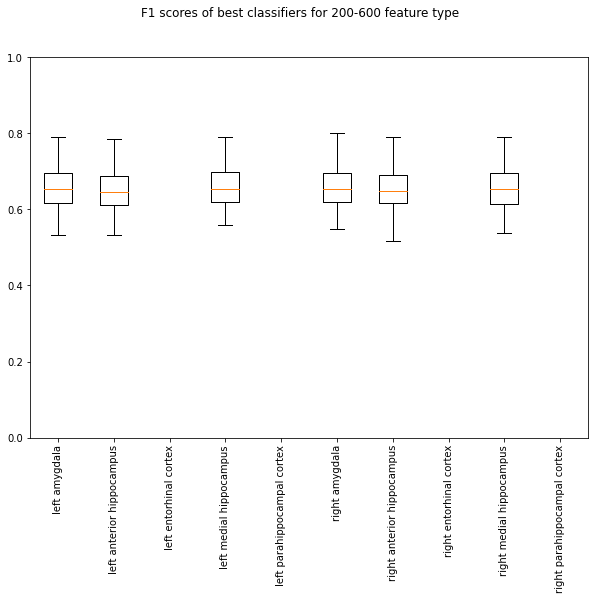

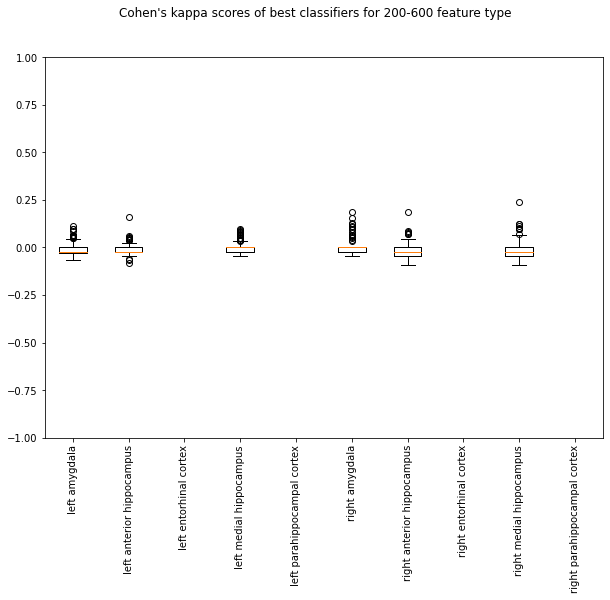

1
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.8±0.08
mean balanced accuracy: 0.53±0.13
mean recall: 0.55±0.47
mean precision: 0.39±0.37
mean F1: 0.78±0.13
mean kappa: -0.01

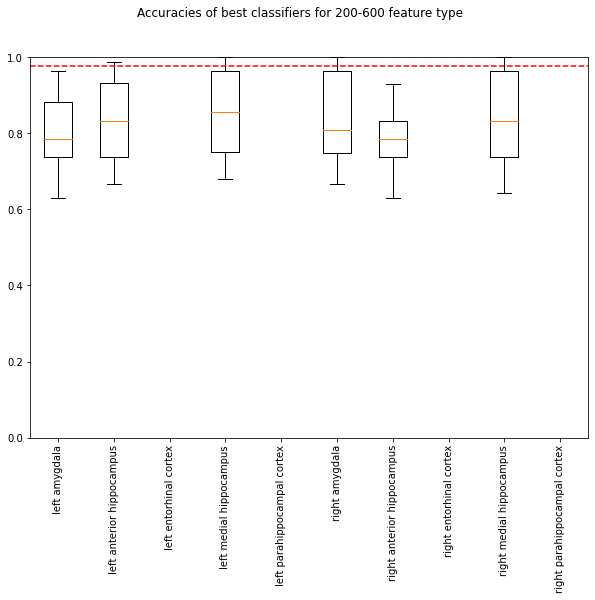

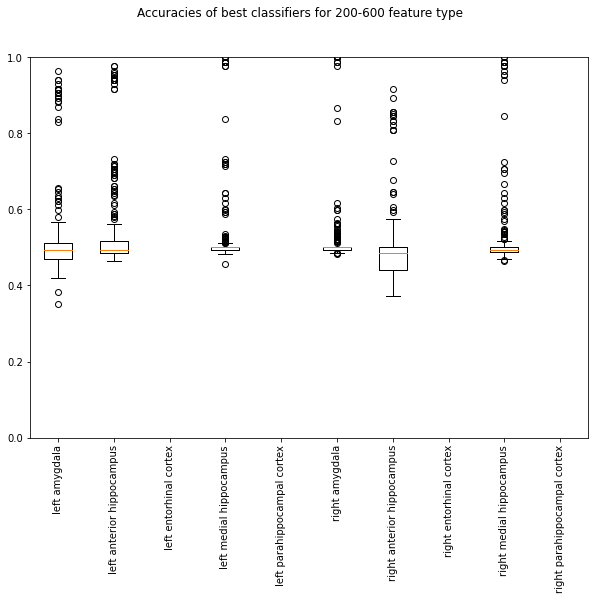

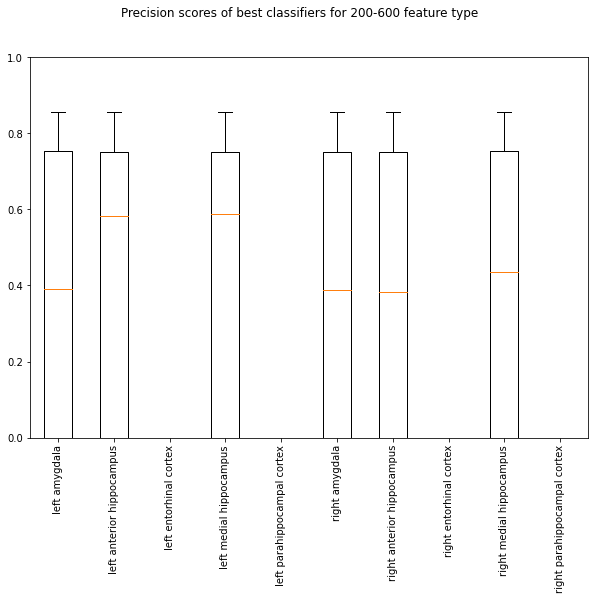

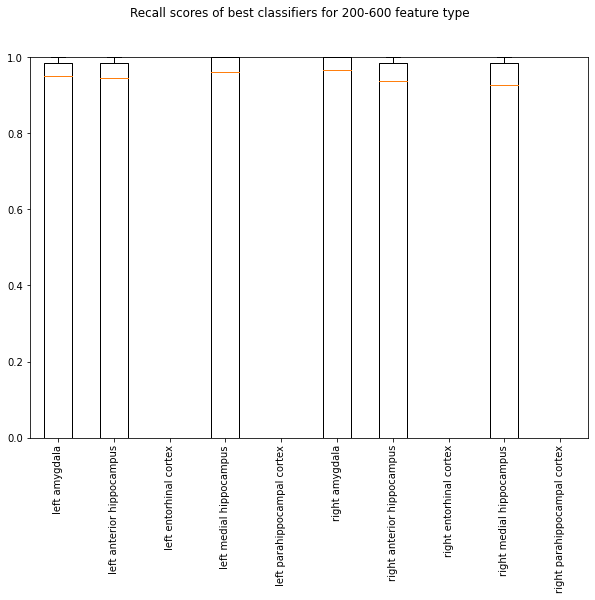

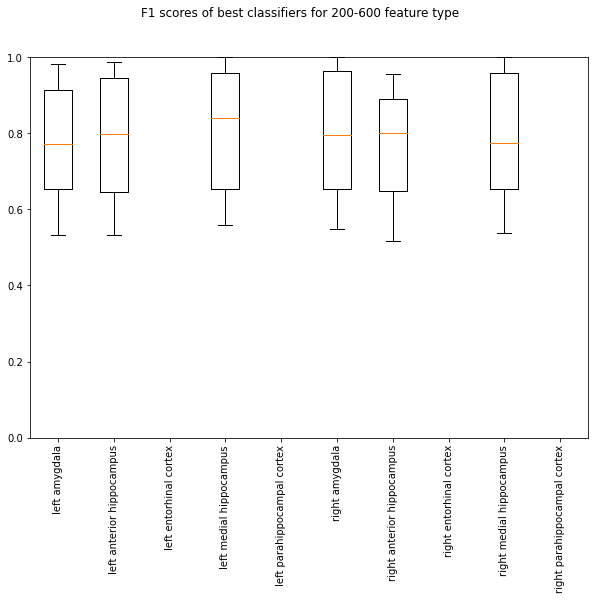

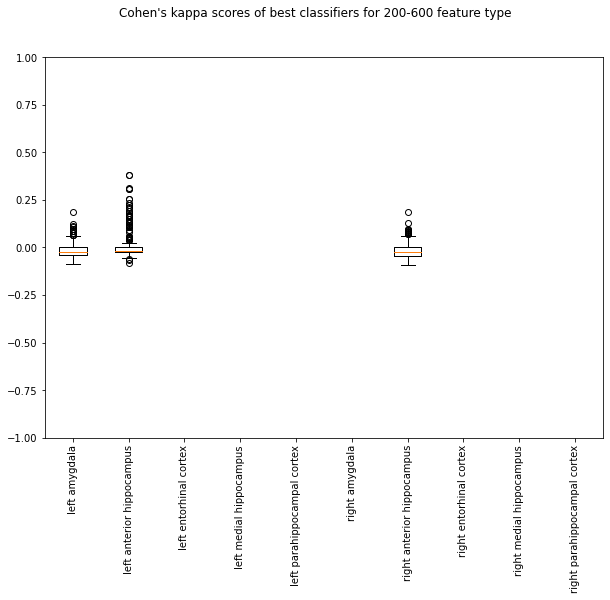

2
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.85±0.1
mean balanced accuracy: 0.54±0.14
mean recall: 0.4±0.45
mean precision: 0.27±0.35
mean F1: 0.84±0.14
mean kappa: nan±na

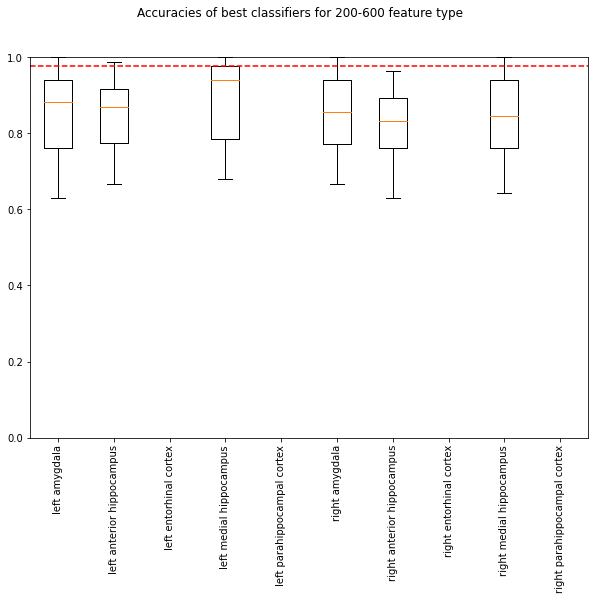

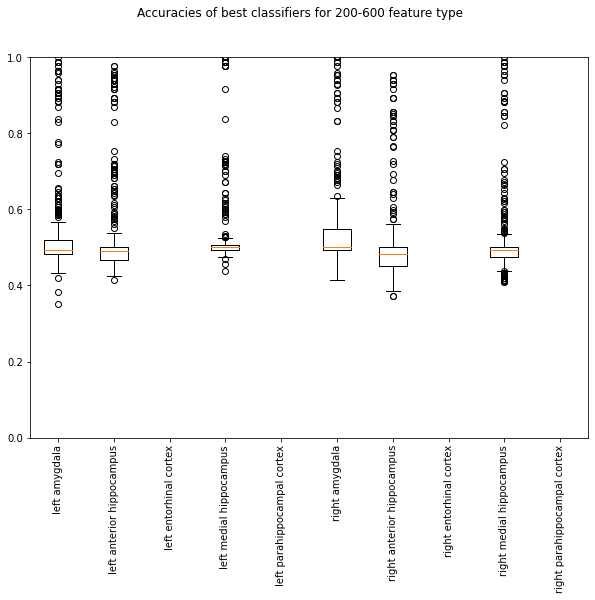

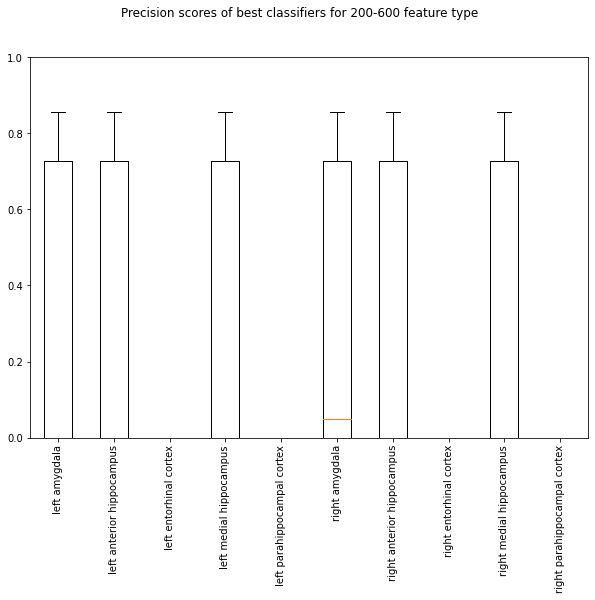

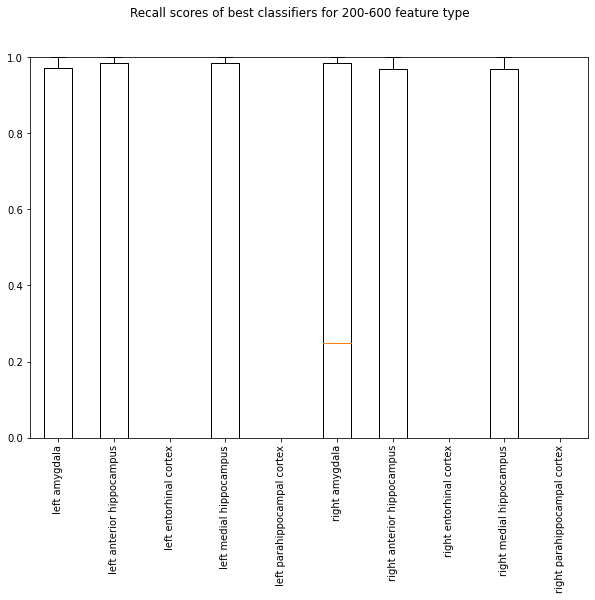

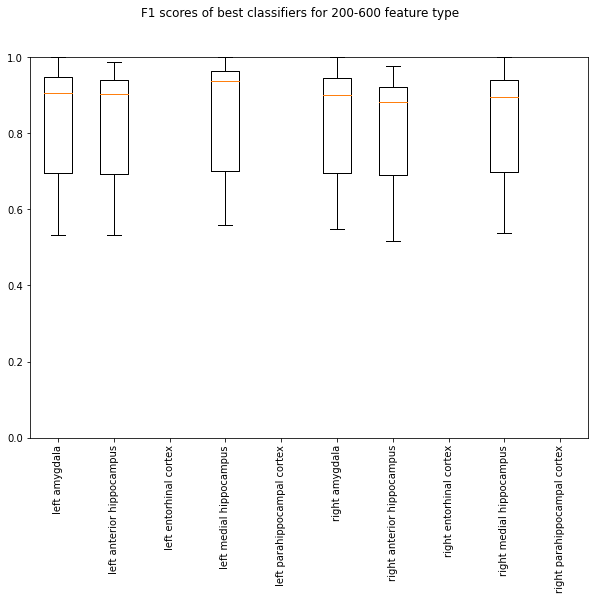

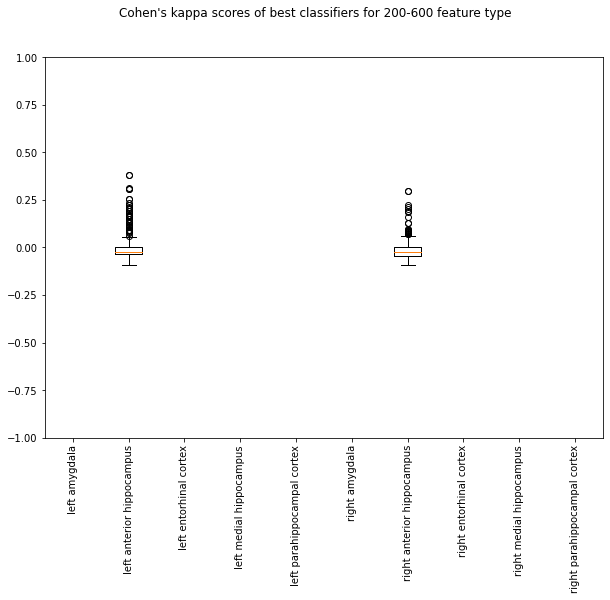

3
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.86±0.09
mean balanced accuracy: 0.54±0.12
mean recall: 0.32±0.42
mean precision: 0.21±0.32
mean F1: 0.85±0.12
mean kappa: nan±

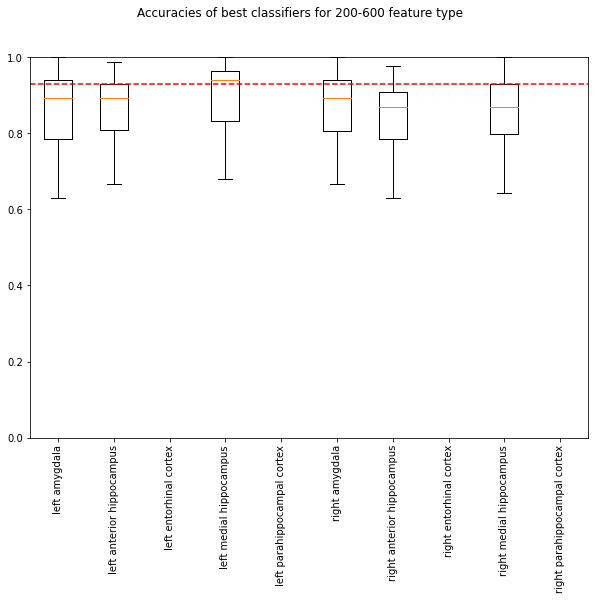

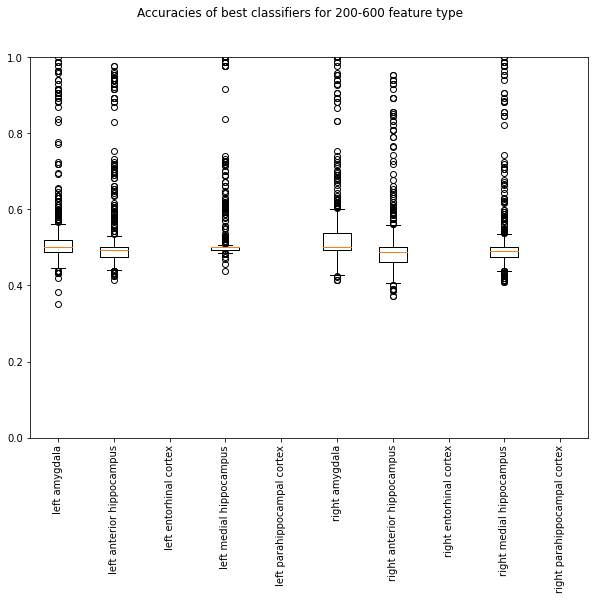

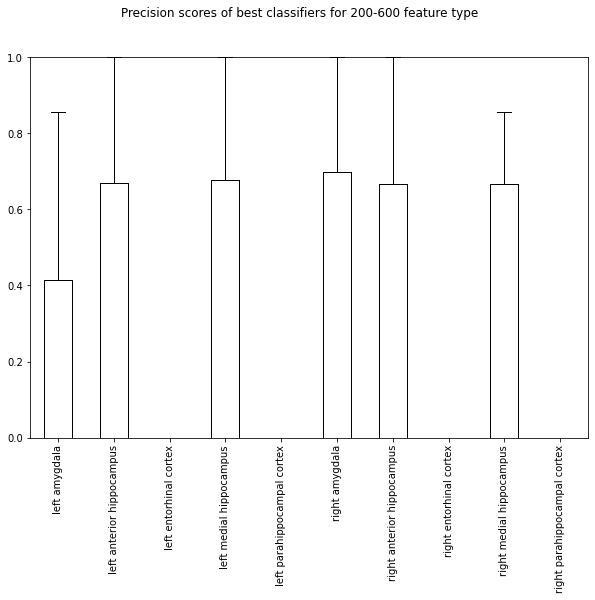

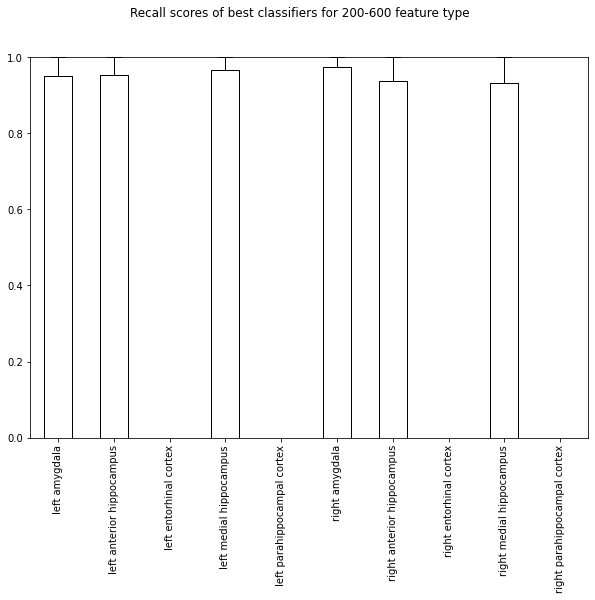

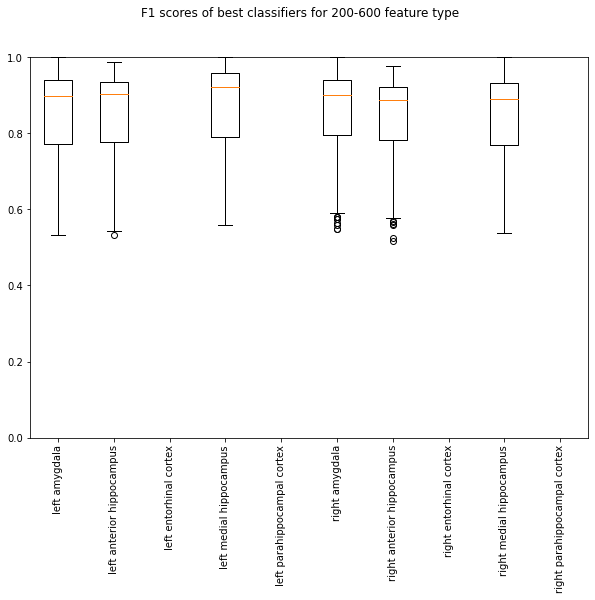

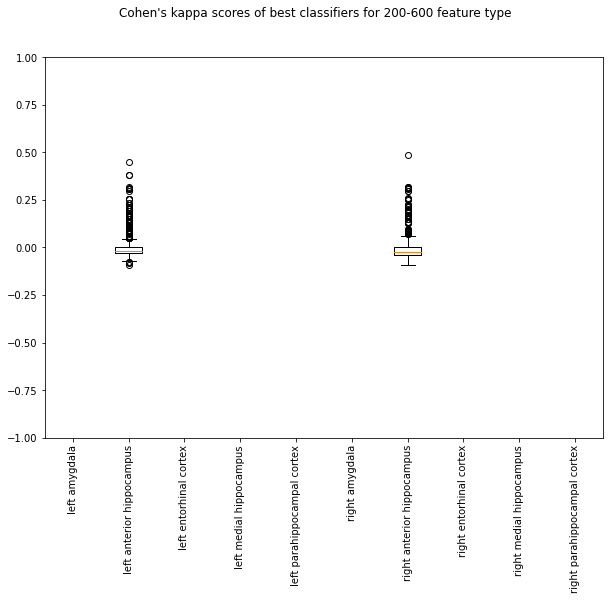

4
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.87±0.08
mean balanced accuracy: 0.53±0.11
mean recall: 0.26±0.4
mean precision: 0.18±0.3
mean F1: 0.85±0.11
mean kappa: nan±na

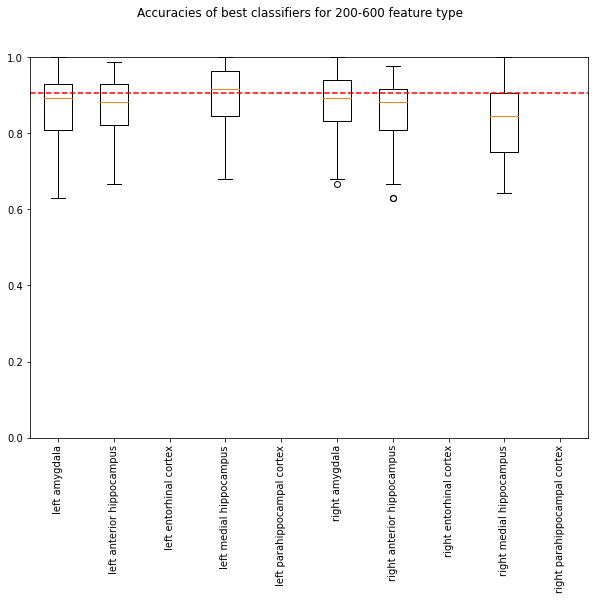

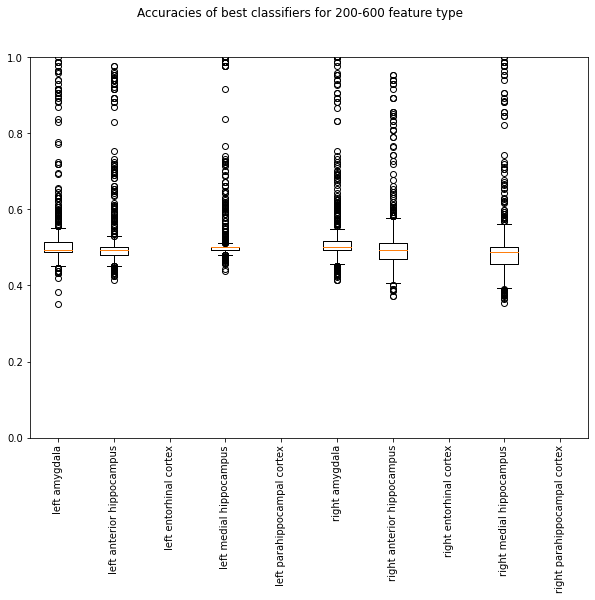

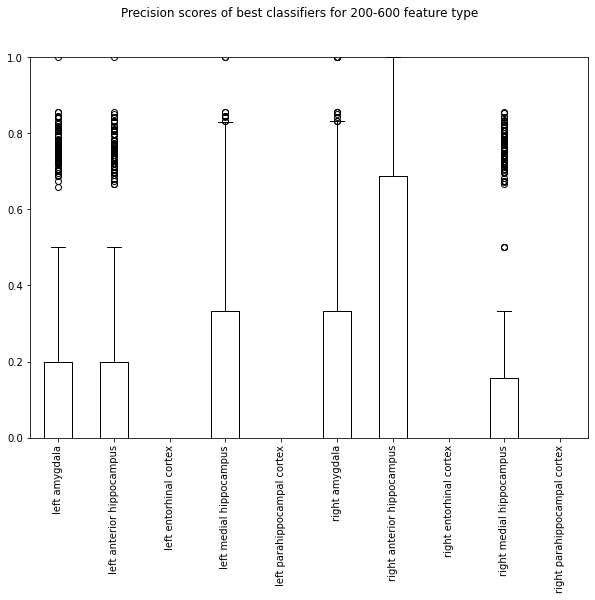

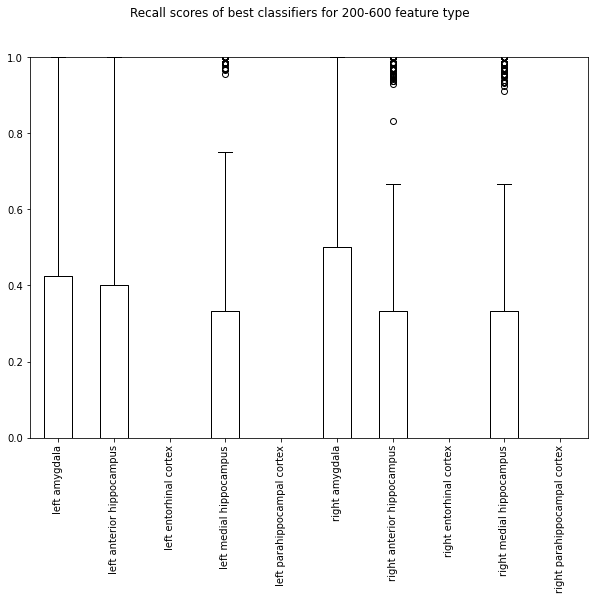

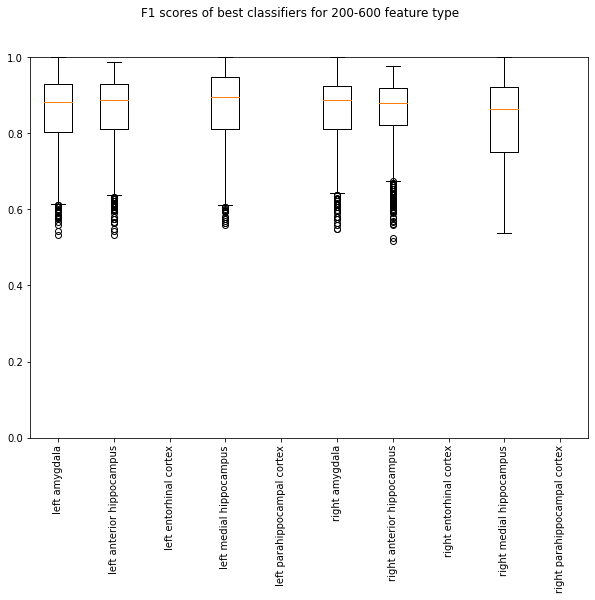

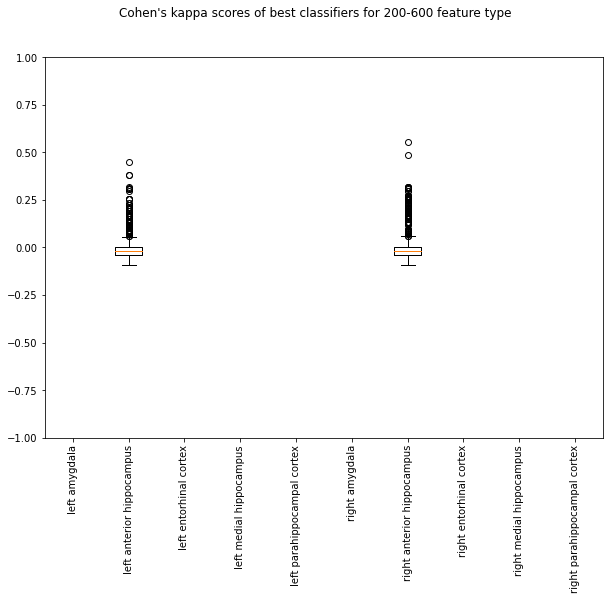

5
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.87±0.08
mean balanced accuracy: 0.52±0.1
mean recall: 0.22±0.37
mean precision: 0.16±0.28
mean F1: 0.85±0.1
mean kappa: nan±na

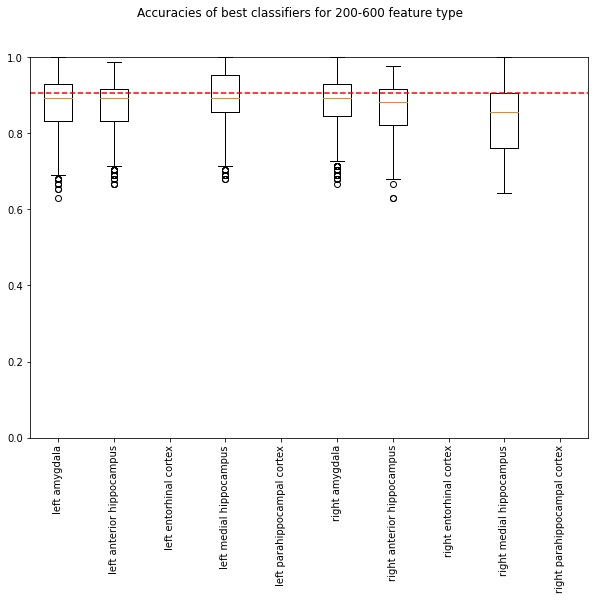

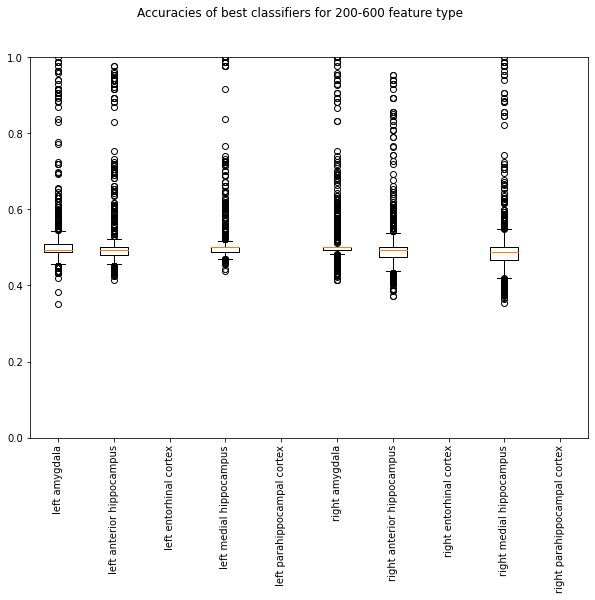

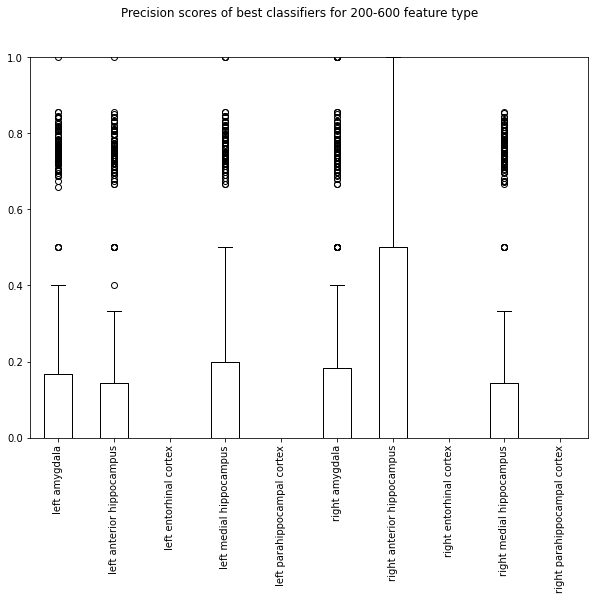

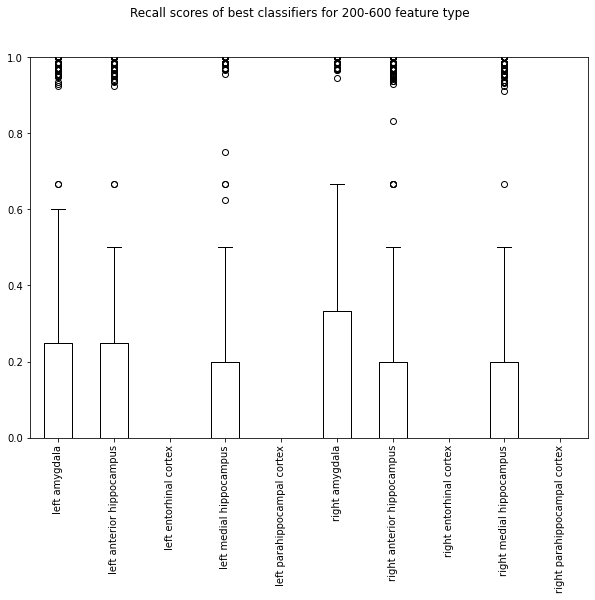

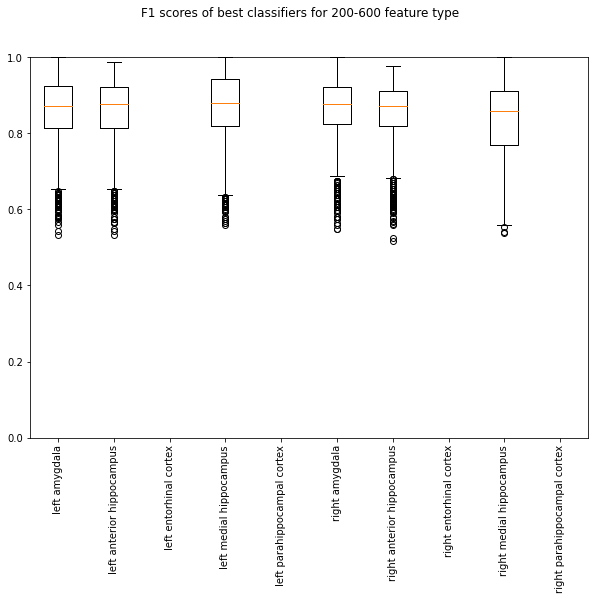

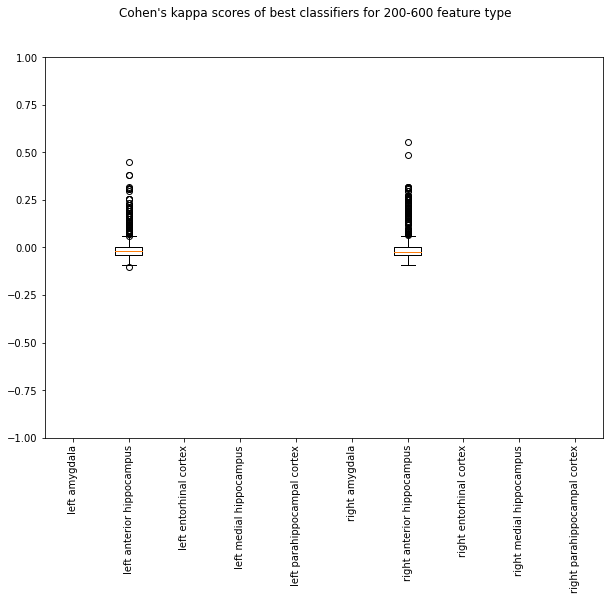

6
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.88±0.08
mean balanced accuracy: 0.52±0.09
mean recall: 0.2±0.35
mean precision: 0.15±0.27
mean F1: 0.86±0.1
mean kappa: nan±na

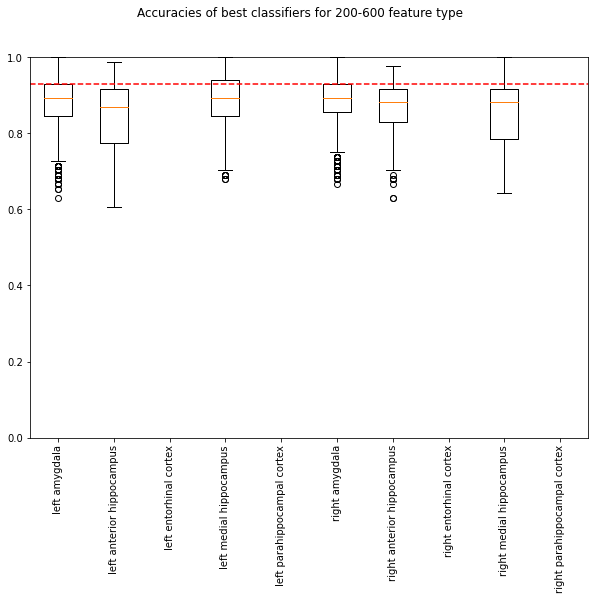

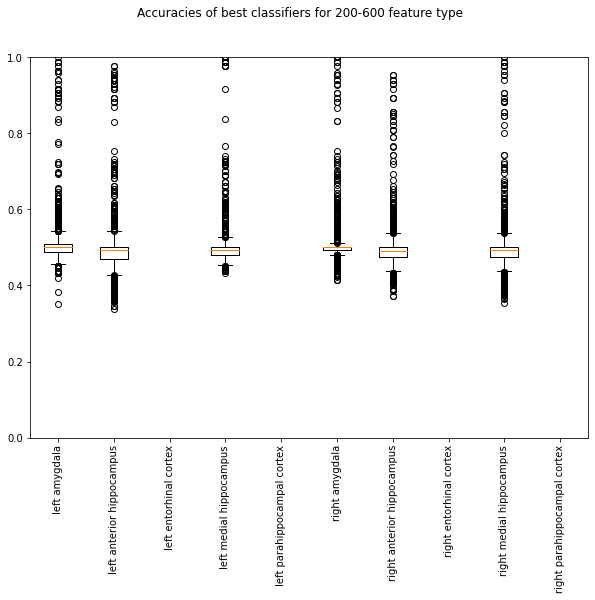

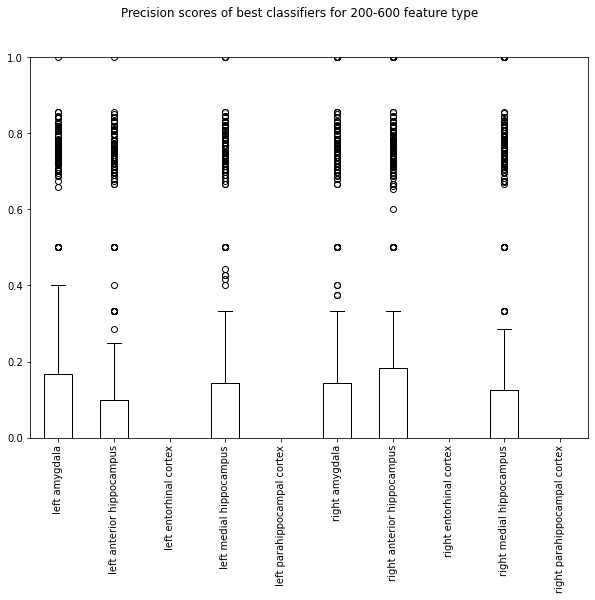

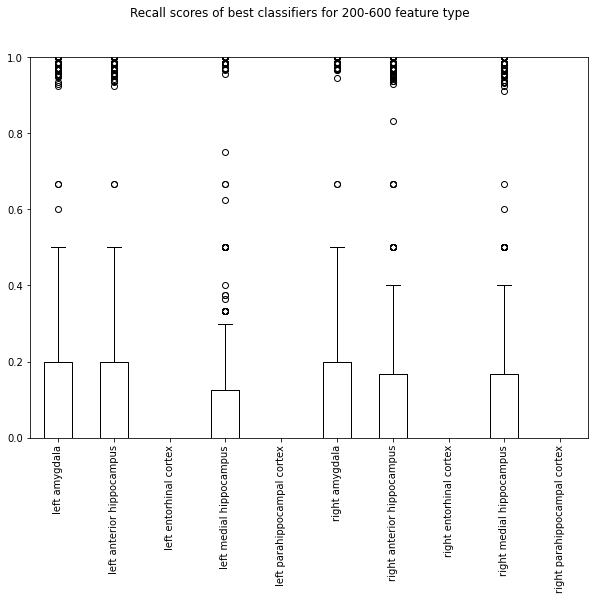

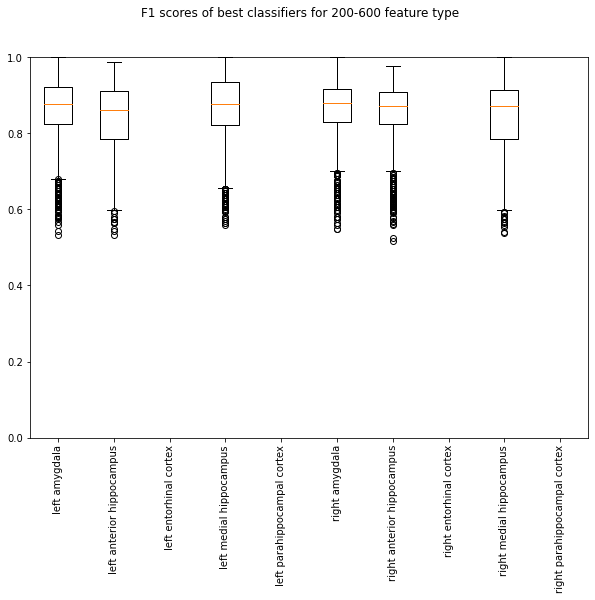

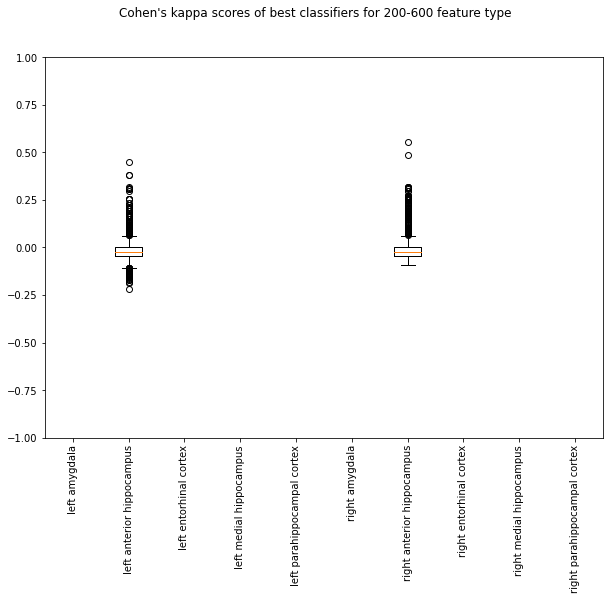

7
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.88±0.07
mean balanced accuracy: 0.53±0.11
mean recall: 0.18±0.34
mean precision: 0.13±0.26
mean F1: 0.86±0.09
mean kappa: nan±

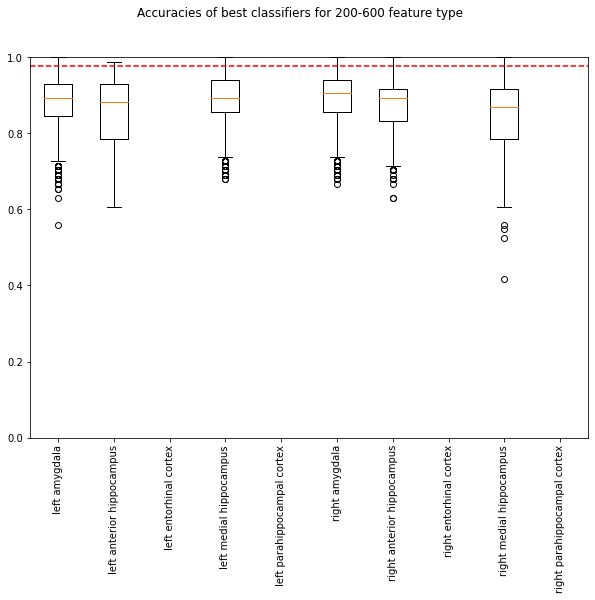

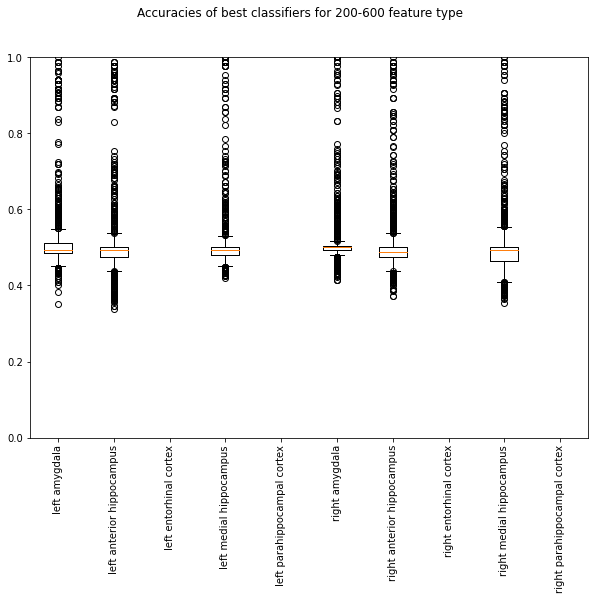

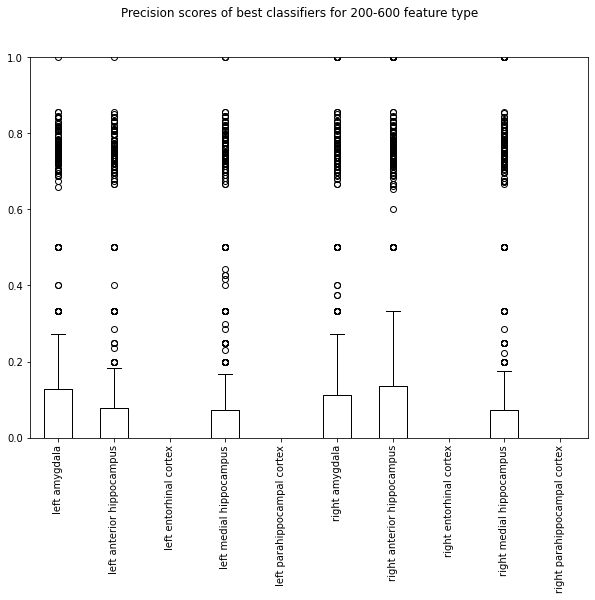

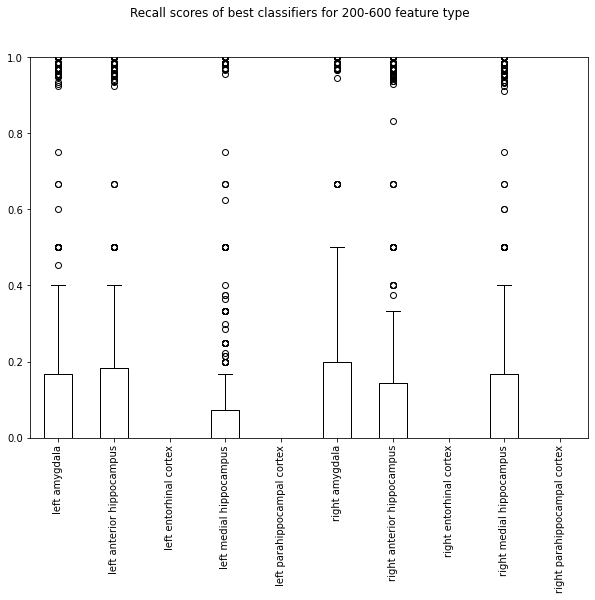

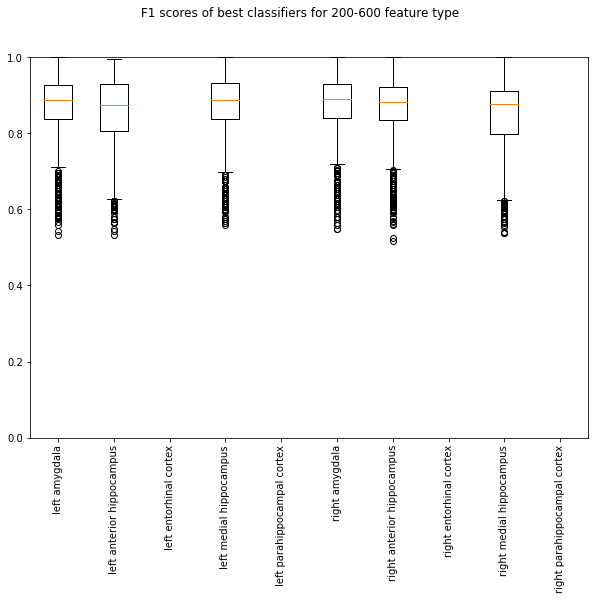

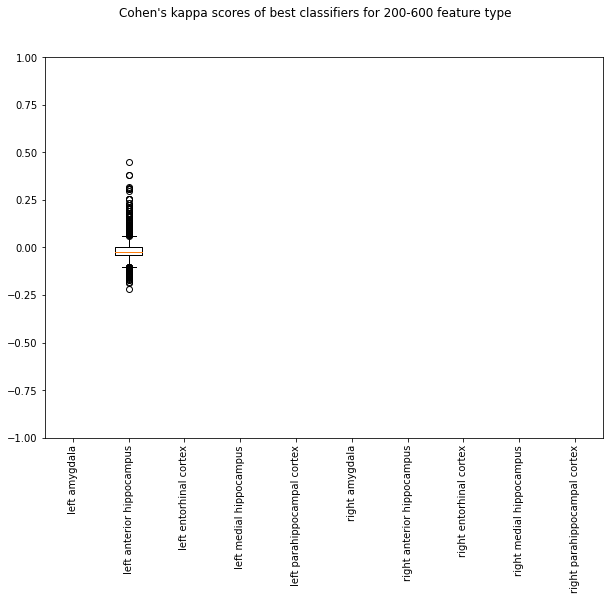

8
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.87±0.07
mean balanced accuracy: 0.52±0.1
mean recall: 0.16±0.32
mean precision: 0.12±0.25
mean F1: 0.85±0.09
mean kappa: nan±n

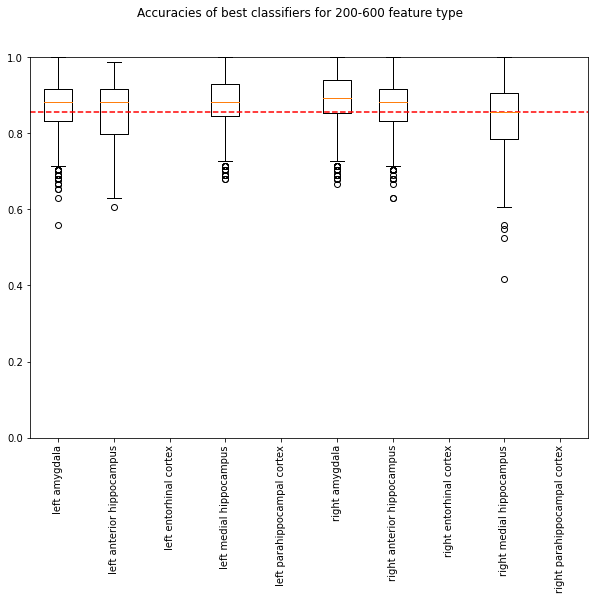

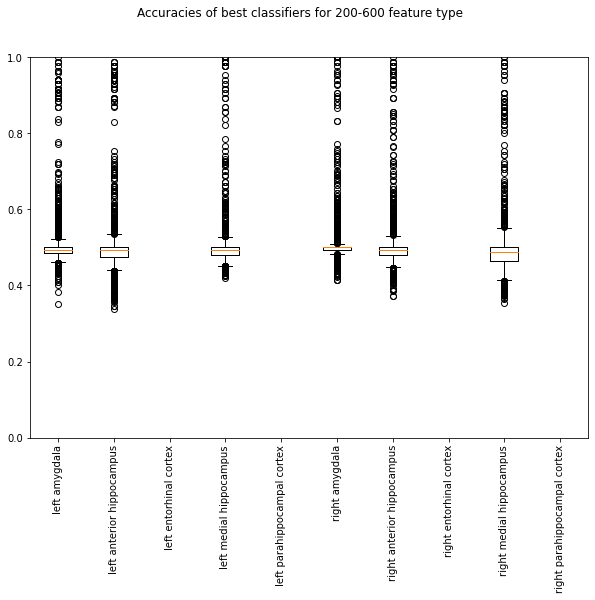

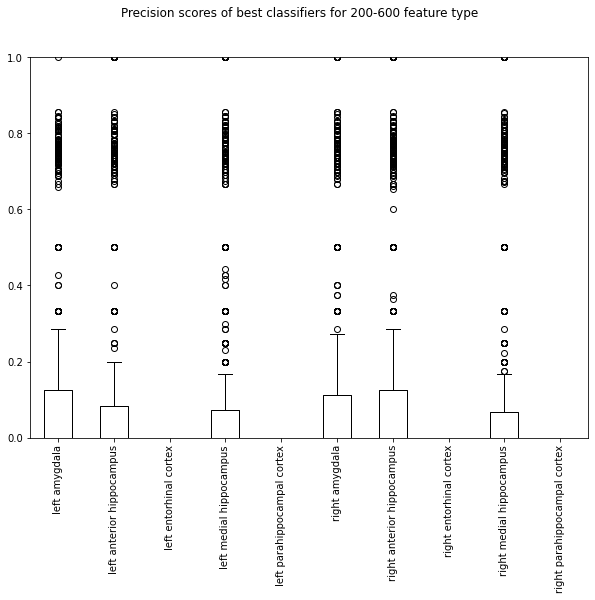

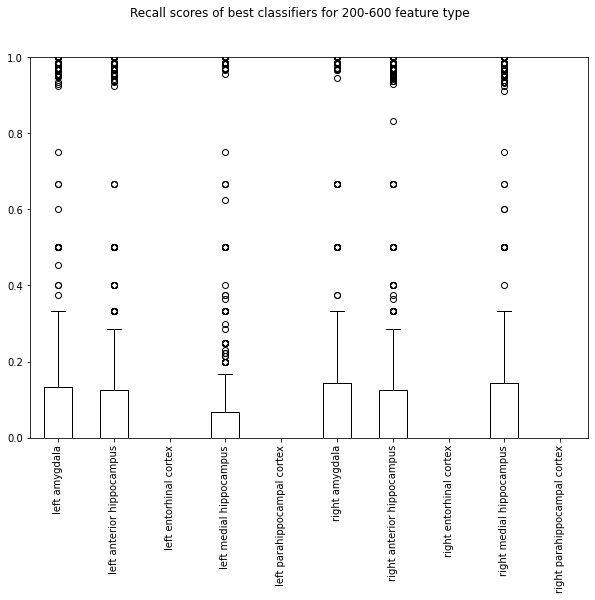

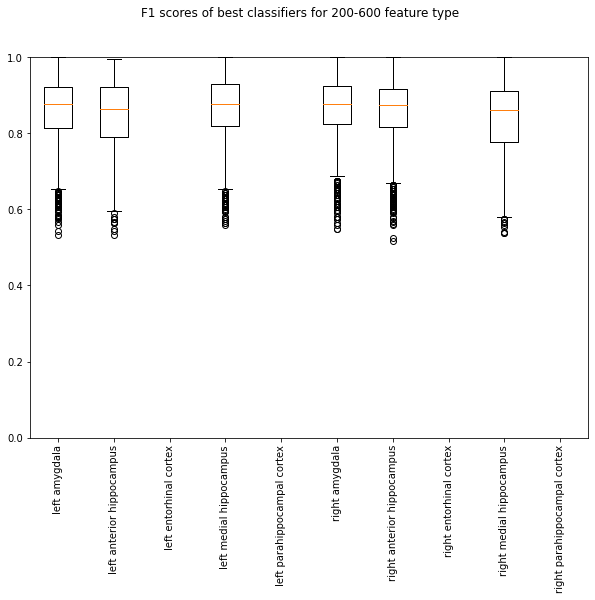

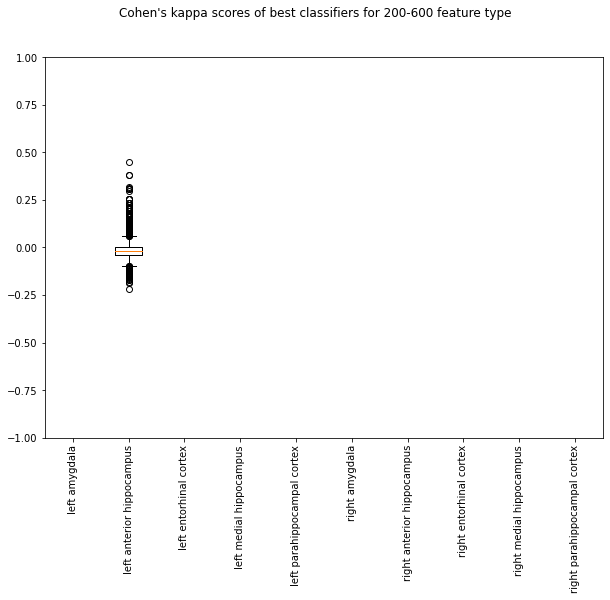

9
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.87±0.07
mean balanced accuracy: 0.52±0.1
mean recall: 0.15±0.31
mean precision: 0.12±0.24
mean F1: 0.85±0.09
mean kappa: nan±n

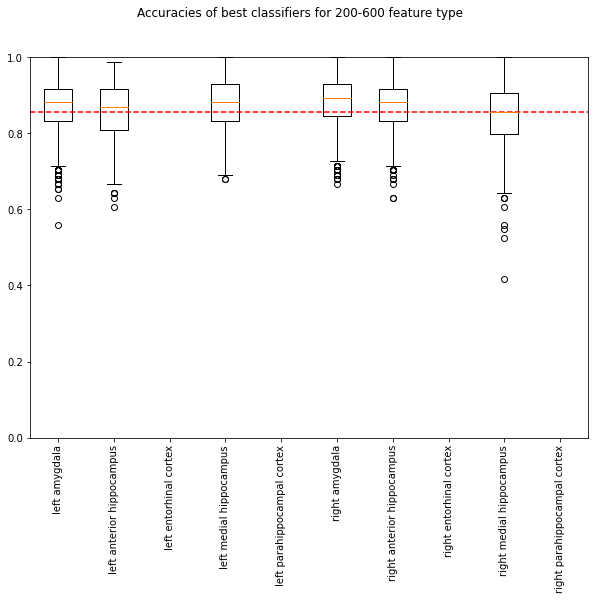

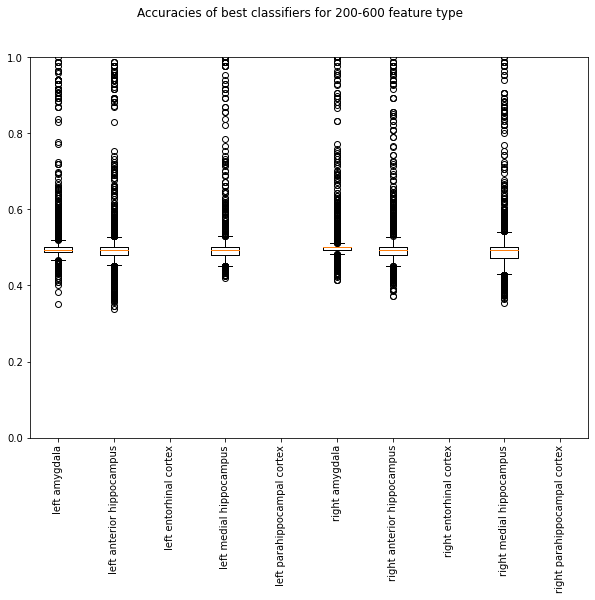

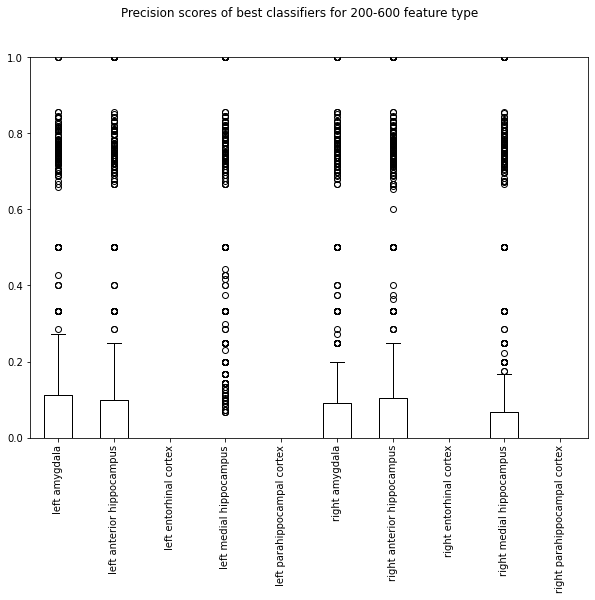

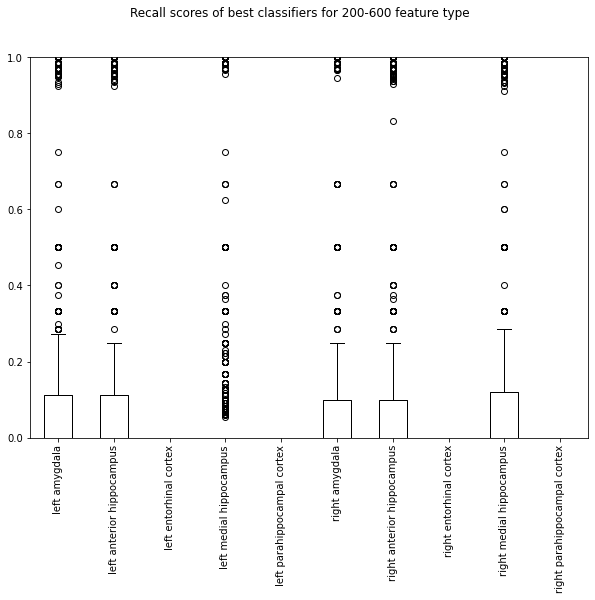

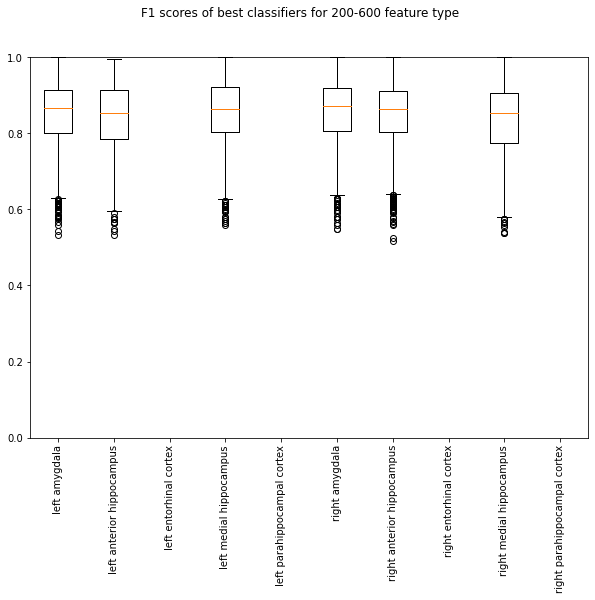

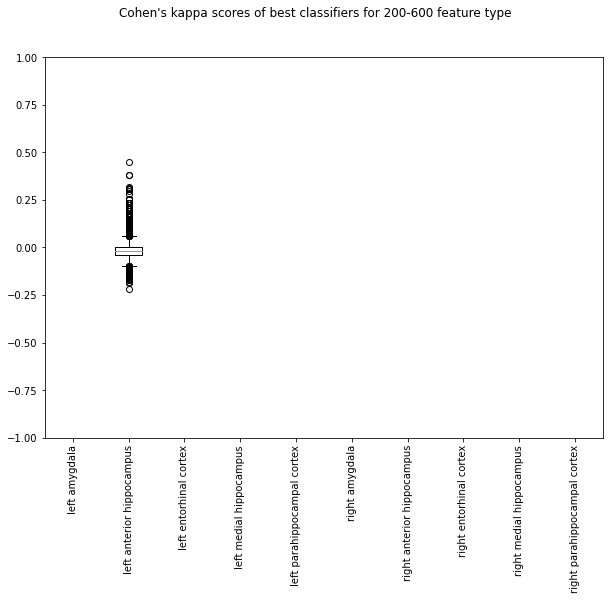

10
brain area: left amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: left anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: left parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right amygdala
best classifier: [0.0001, 'poly']
loss: nan
brain area: right anterior hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right entorhinal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: right medial hippocampus
best classifier: [0.0001, 'poly']
loss: nan
brain area: right parahippocampal cortex
best classifier: [0.0001, 'poly']
loss: nan
brain area: left amygdala
best classifier: [0.0001, 'poly']
mean accuracy: 0.87±0.07
mean balanced accuracy: 0.52±0.09
mean recall: 0.14±0.3
mean precision: 0.11±0.23
mean F1: 0.85±0.09
mean kappa: nan±

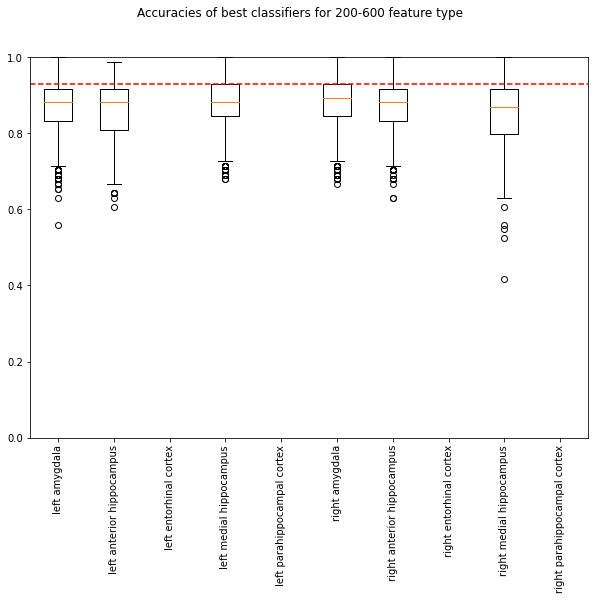

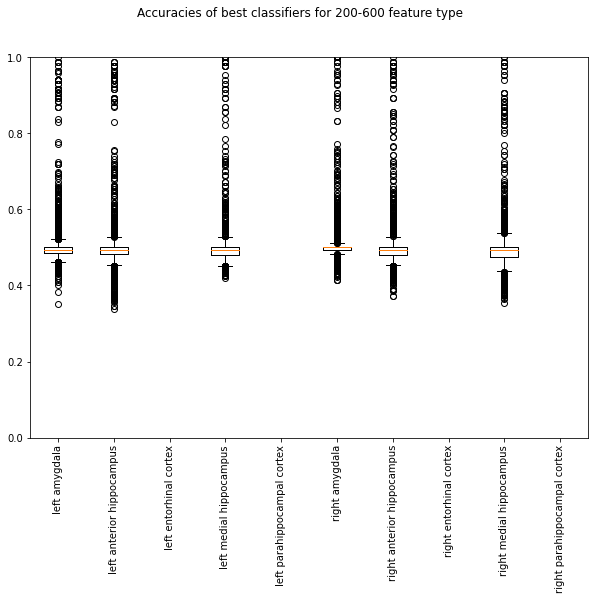

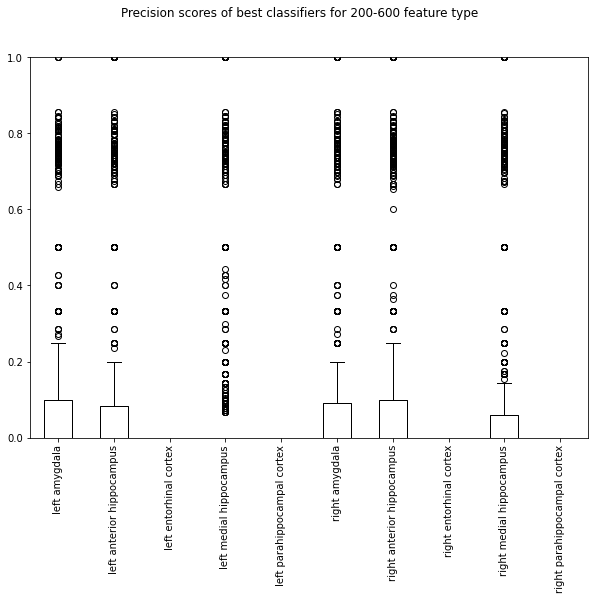

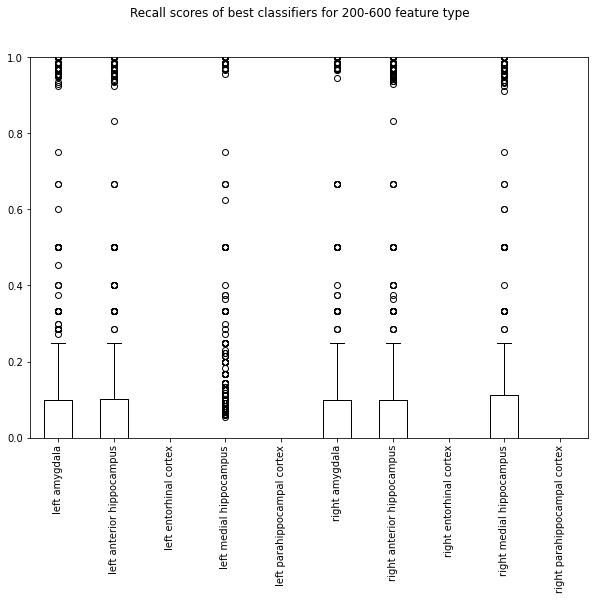

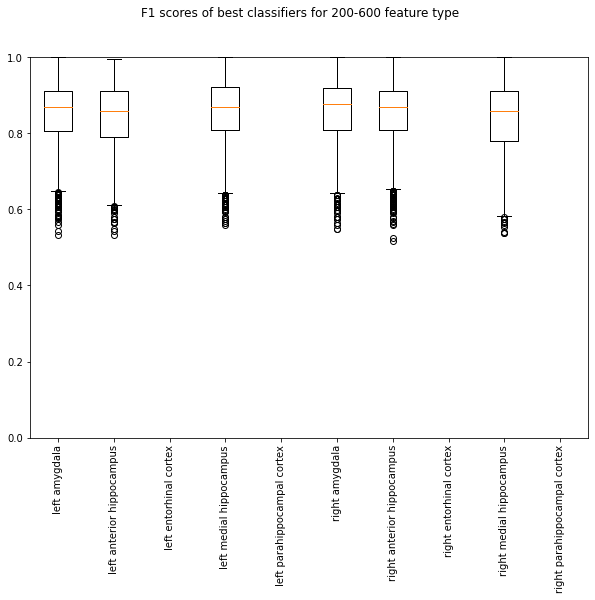

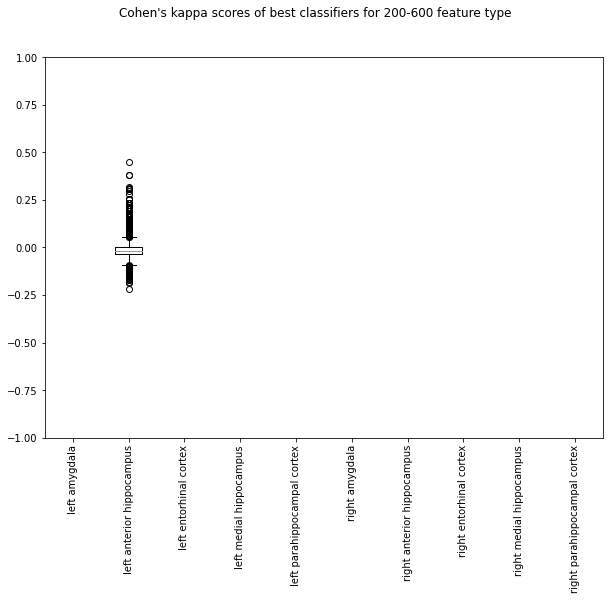

In [27]:
#NEW
#random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        #print(label)
        best_params_list_per_area = []
        best_classifier = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[(df_patient_info_new['brain_area'].str.contains(brain_area)) & (df_patient_info_new['channel_name'].isin(selected_channels))]
        channel_cols = channel_cols.reset_index()

        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        X = df_data_post[df_data_post.columns & cols_to_use]

        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        movie_stim_percentage = (numb*100)/numb_all
        if label == 0:
            movie_stim_percentage = movie_stim_percentage
        else:
            movie_stim_percentage = 100 - movie_stim_percentage

        if not X.empty:
            for rand_seed in random_seeds:
                np.random.seed(rand_seed) #for train-test split
                strings.append(rand_seed)
                best_params = {}

                # Use a K-fold cross validation with different parameters
                # Create all parameter combinations
                params = {'random_state': [rand_seed],
                          'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                          'loss': ['hinge', 'squared_hinge'],    
                          'penalty': ['l1', 'l2'],
                          #'gamma': ['scale', 'auto'],
                          #'degree': [3]
                         }
                # Create all possible parameter combinations
                combinations_linear = [[i, j, k, l] for i in params['random_state']
                               for j in params['C']
                               for k in params['loss']
                               for l in params ['penalty']]
                for s in reversed(combinations_linear):
                    if (s[2] == 'hinge') and (s[3]=='l1'):
                        combinations_linear.remove(s)
                combinations = [[i, j] for i in params['random_state']
                               for j in params['C']
                               #for l in params['gamma']
                               #for k in params['degree']
                               ]

                for kernel in kernels:
                    if kernel == 'linear':
                        losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations_linear, kernel, rand_seed, 'NearMiss')
                    else:
                        losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations, kernel, rand_seed, 'NearMiss') 

                    all_losses.append([losses, brain_area])

        
    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_precisions_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_recalls_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_f1s_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_kappas_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, movie_stim_percentage, fig_save_path)

0
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 20.77
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 20.94
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 20.82
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 21.14
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 21.34
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 20.4
brain area: right entorhinal cortex
best classifier: [0.0005, 'poly']
loss: 21.41
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 20.79
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 20.27
brain area: left amygdala
best cla

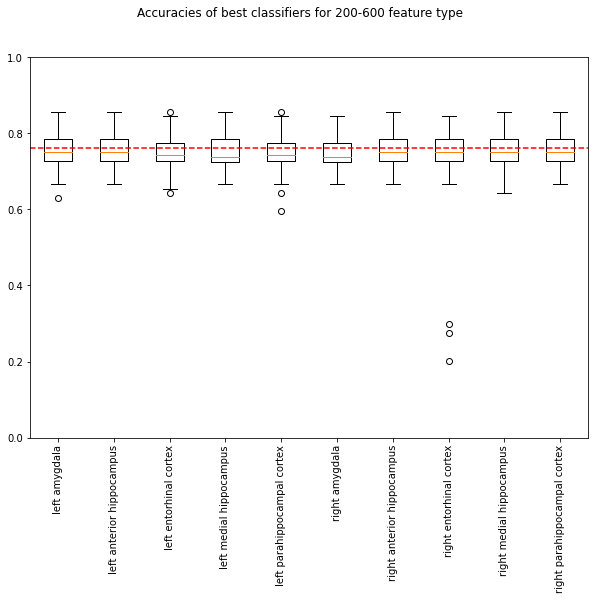

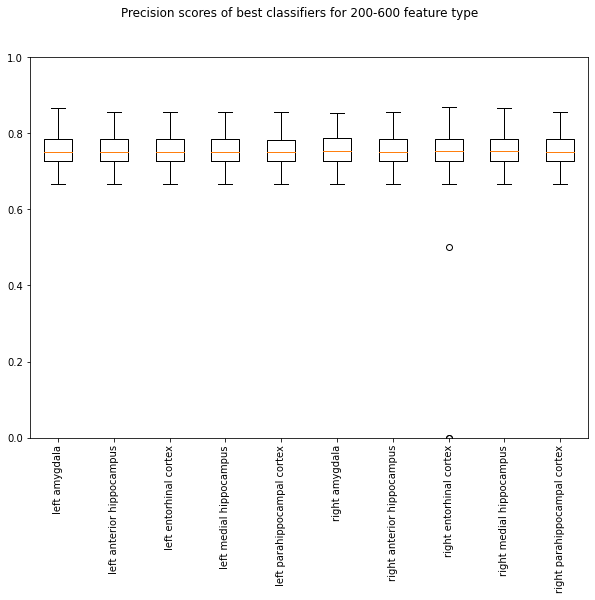

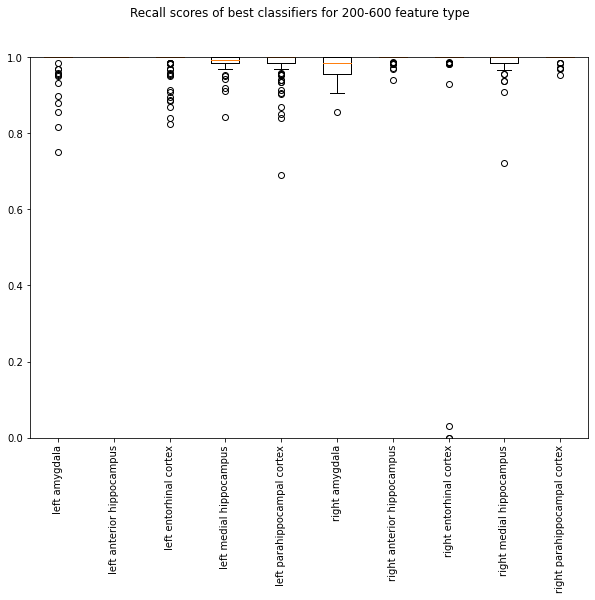

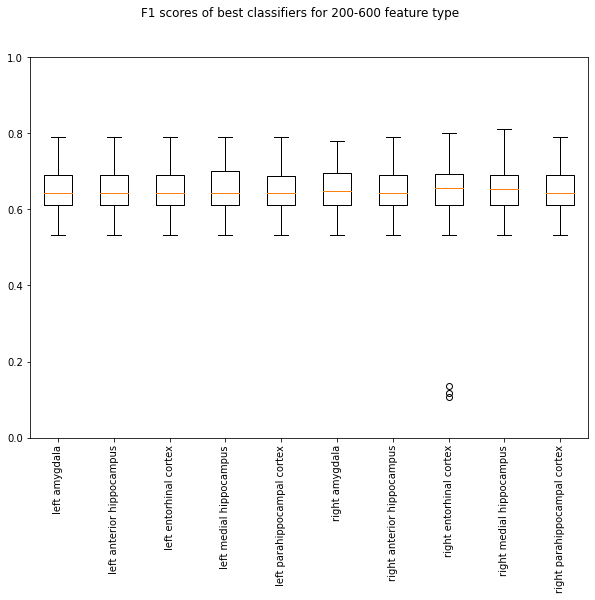

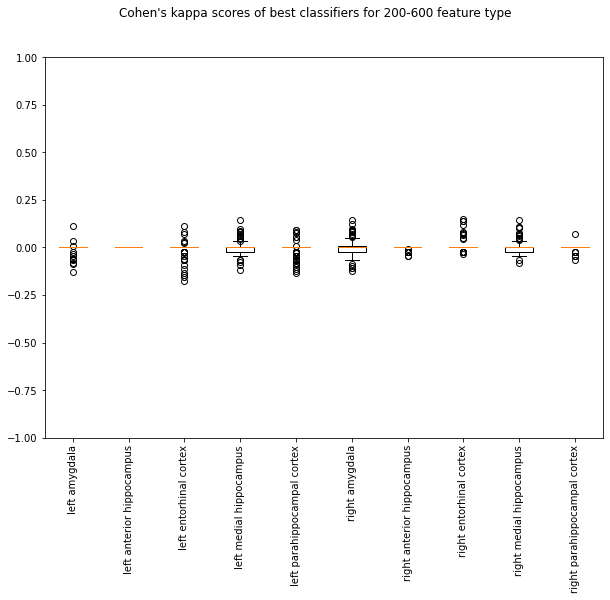

1
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.41
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.495
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 11.435
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 11.645
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.695
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.225
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.865
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 11.42
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.16
brain are

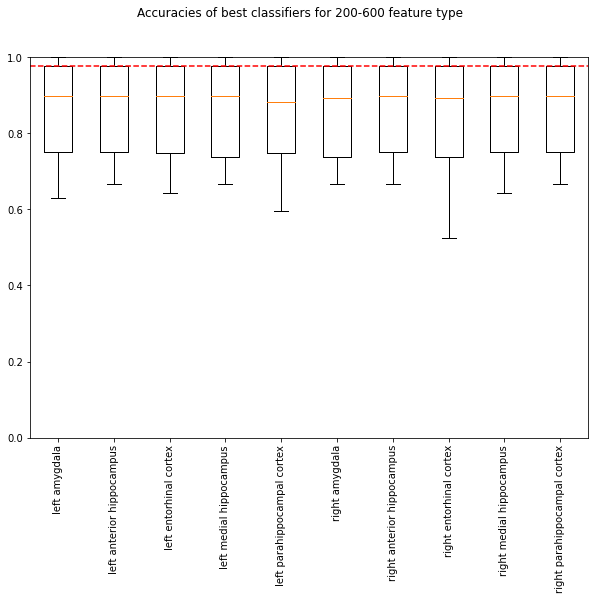

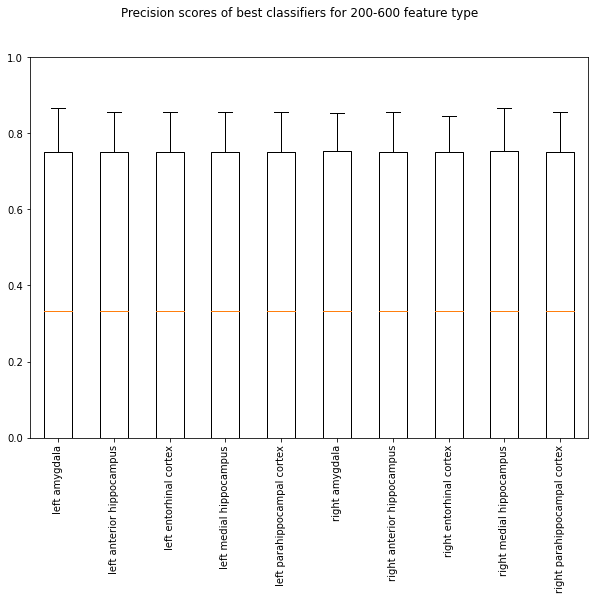

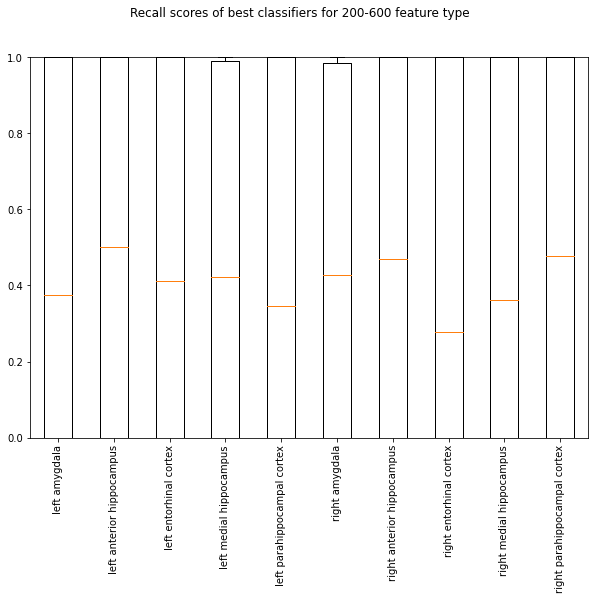

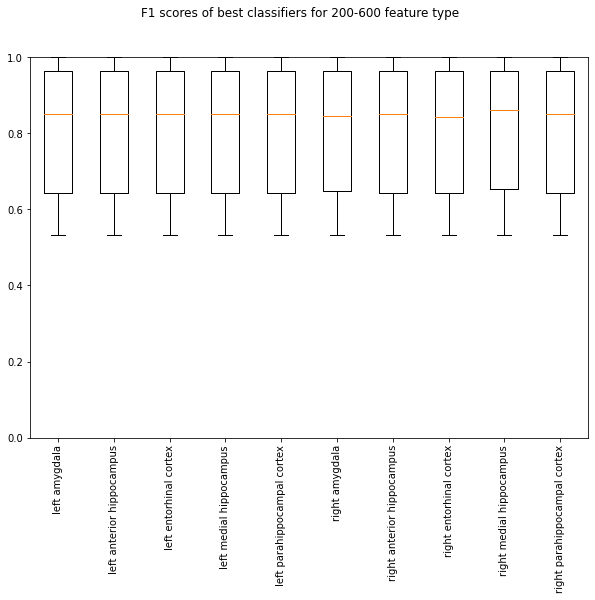

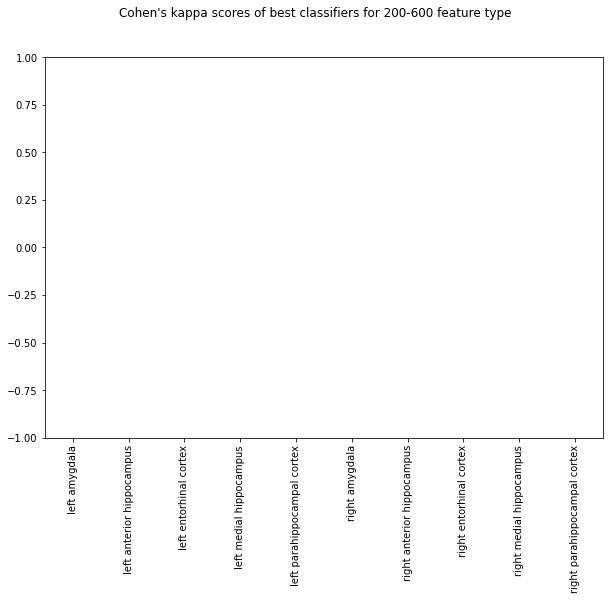

2
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.303333333333333
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 8.36
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 8.32
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 8.46
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 8.493333333333334
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.18
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.606666666666667
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 8.31
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']

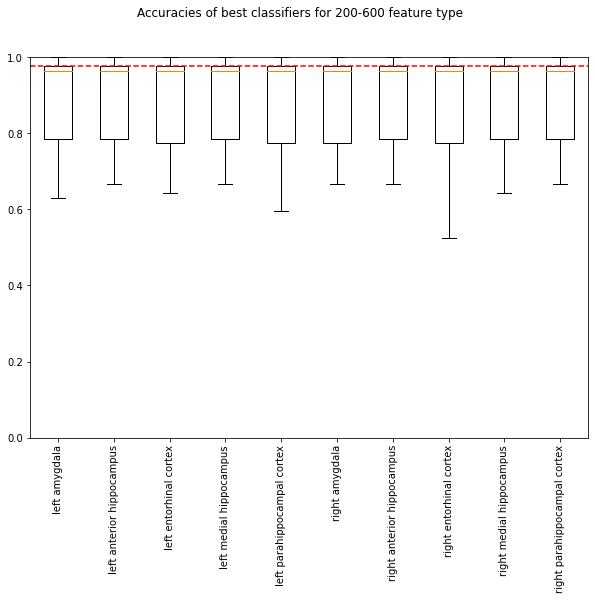

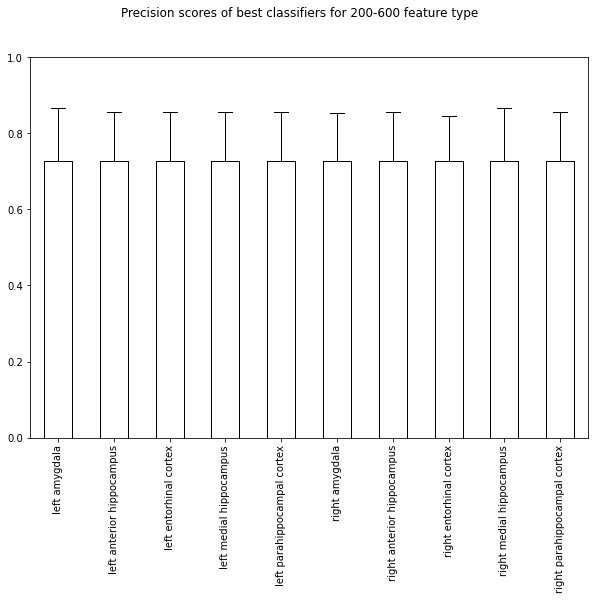

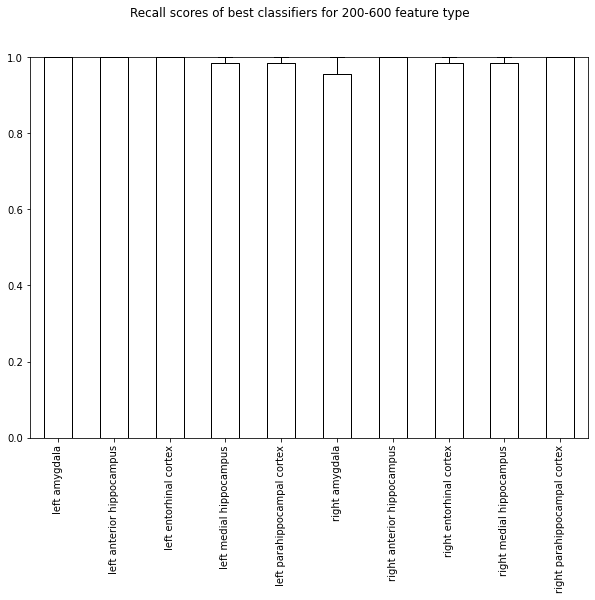

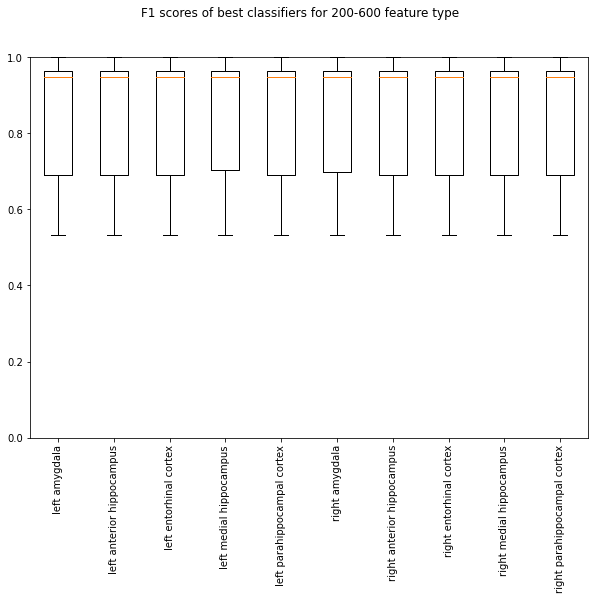

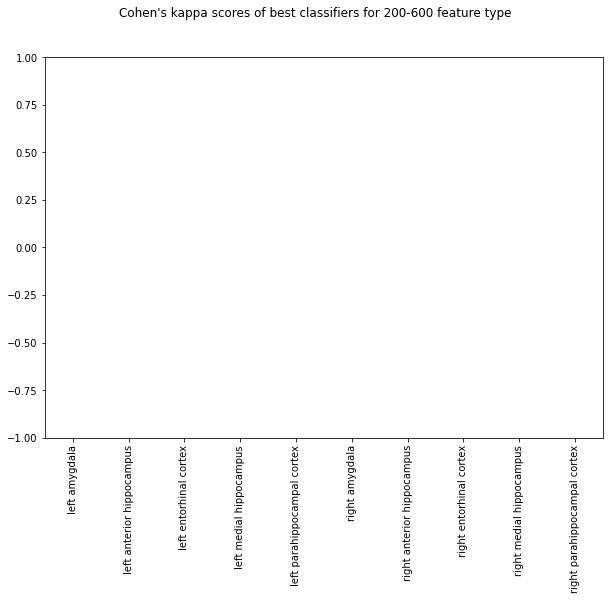

3
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.7575
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.8
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.79
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.875
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.9
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.665
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.985
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.7625
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.6325
brain area: left a

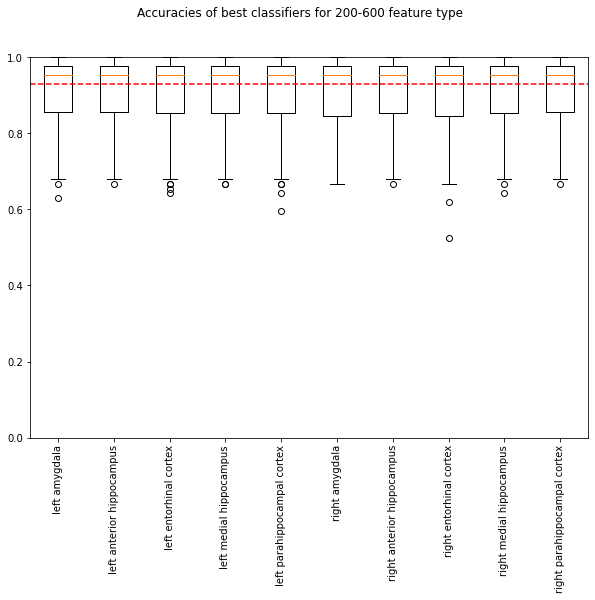

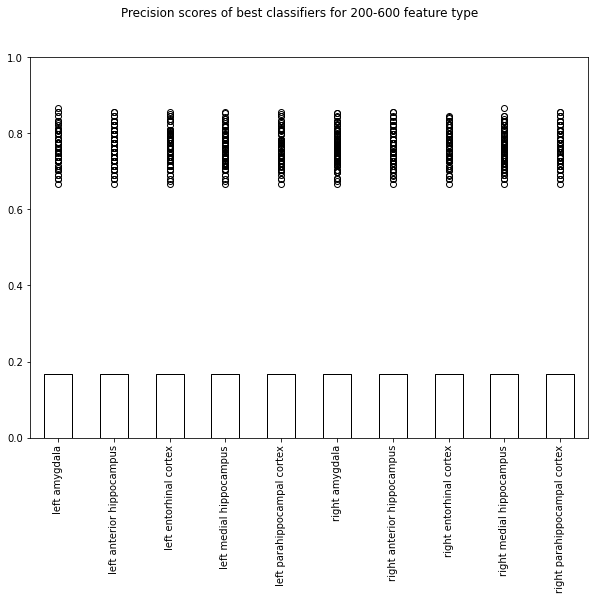

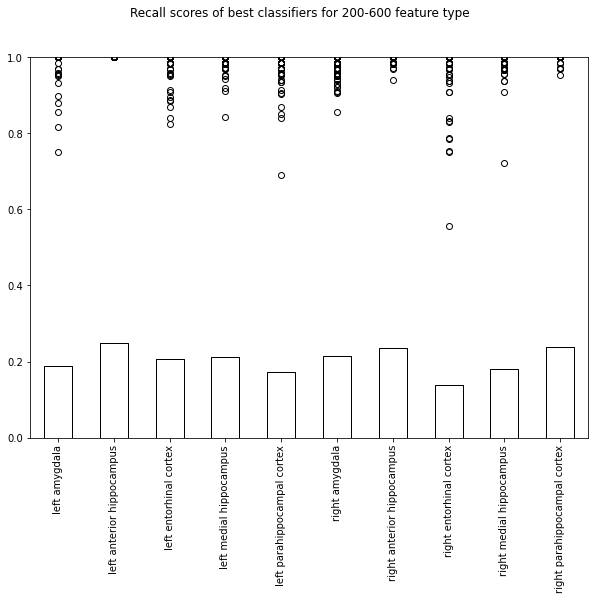

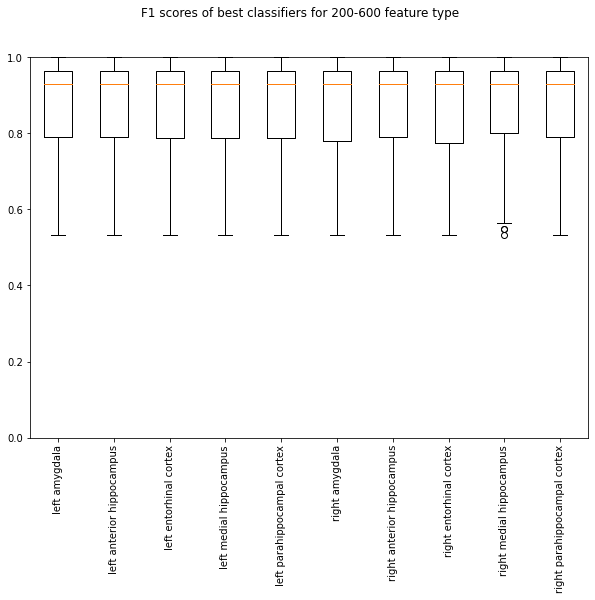

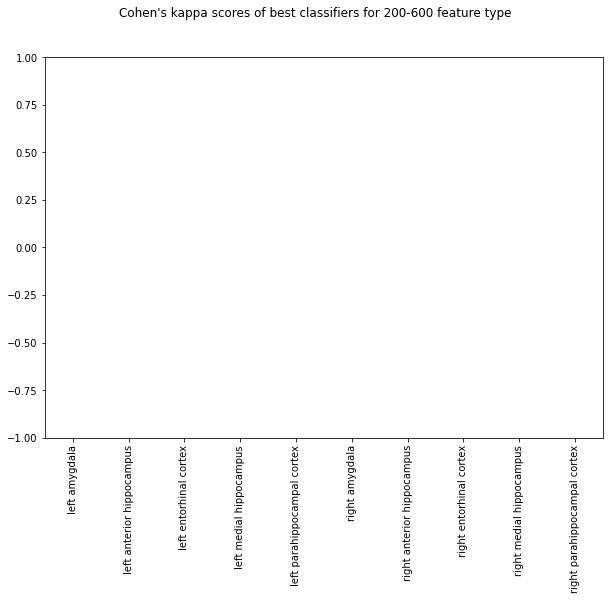

4
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.802
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.836
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.828
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.9
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.916
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.728
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.984
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.806
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.702
brain area: left am

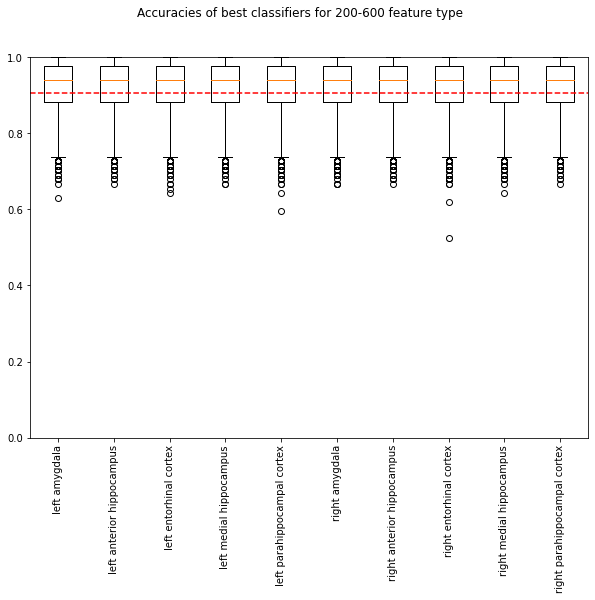

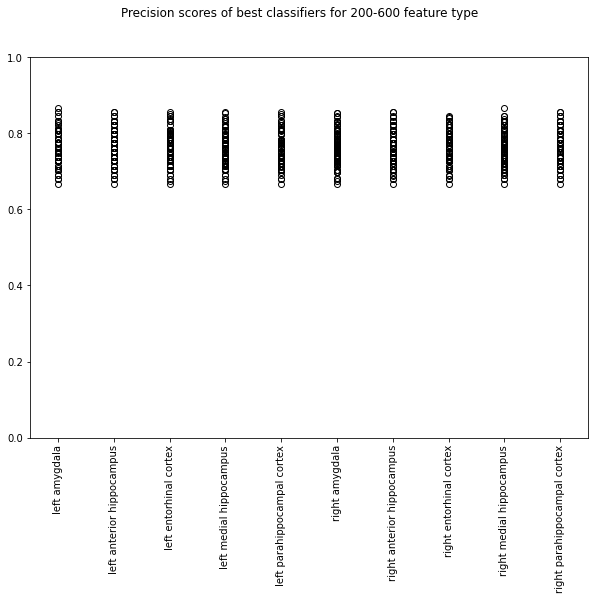

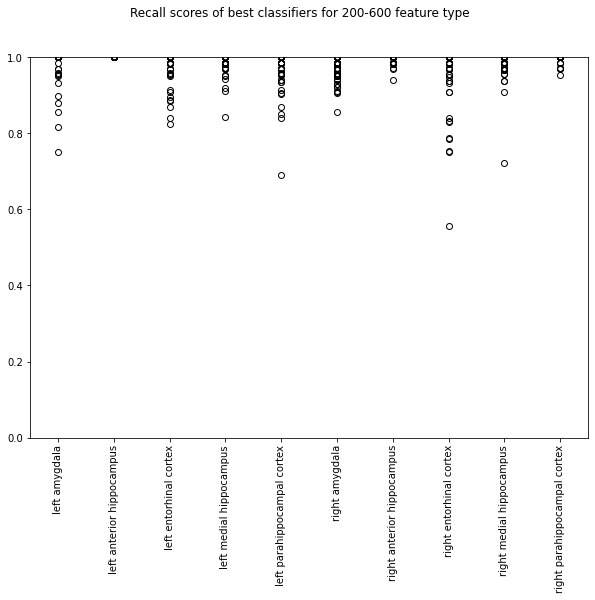

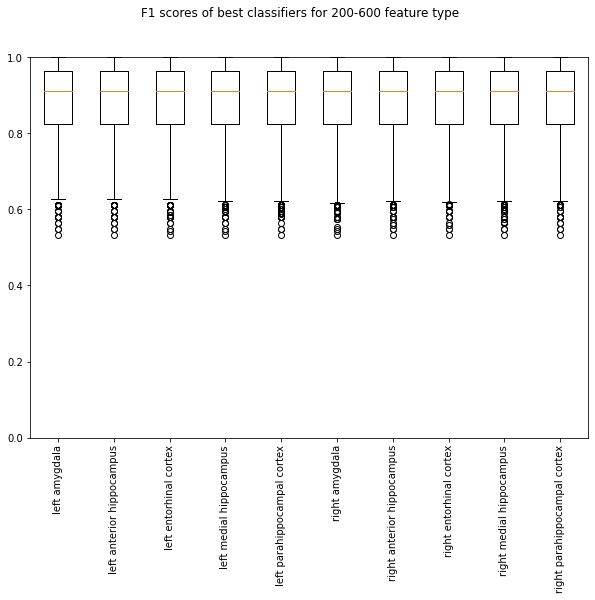

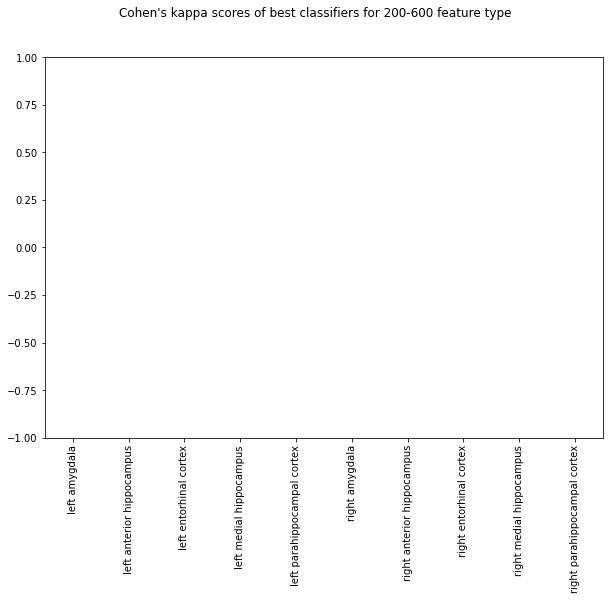

5
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.8116666666666665
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.84
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.833333333333333
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.8933333333333335
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.908333333333333
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.75
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.963333333333333
brain area: right medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.815
brain area: right parahippocampal cortex
best classifier: [0.

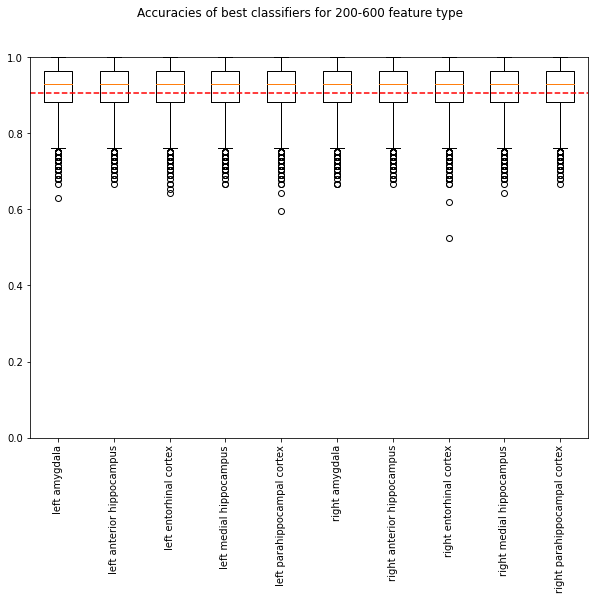

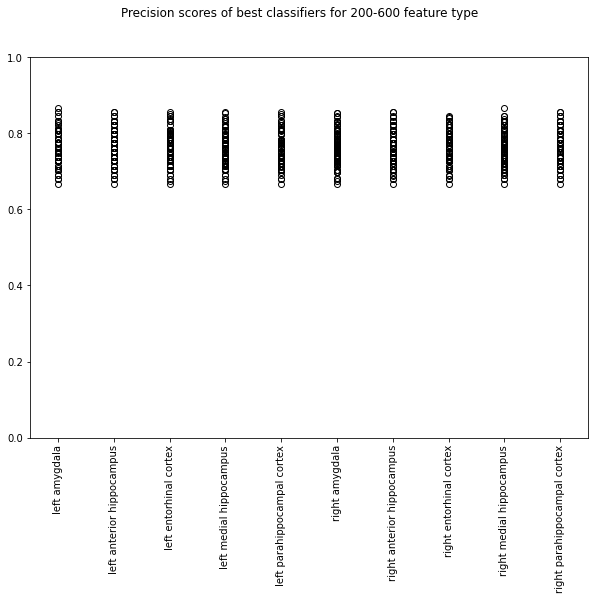

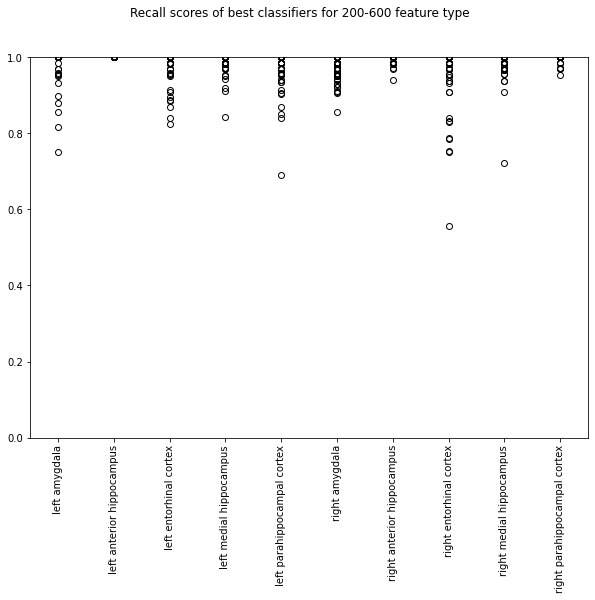

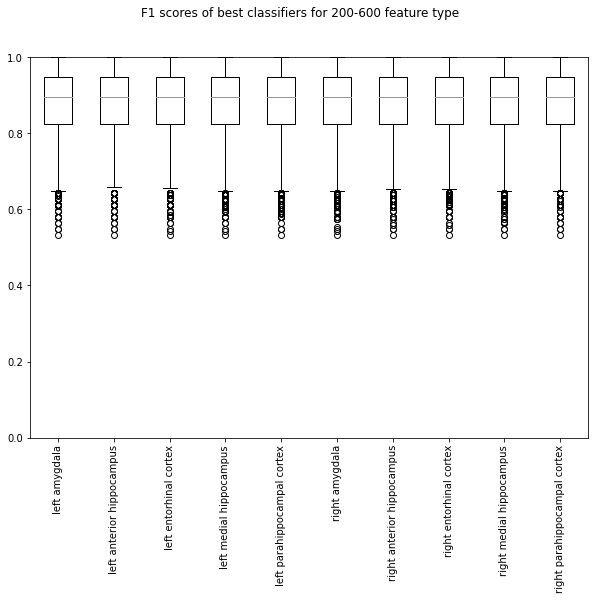

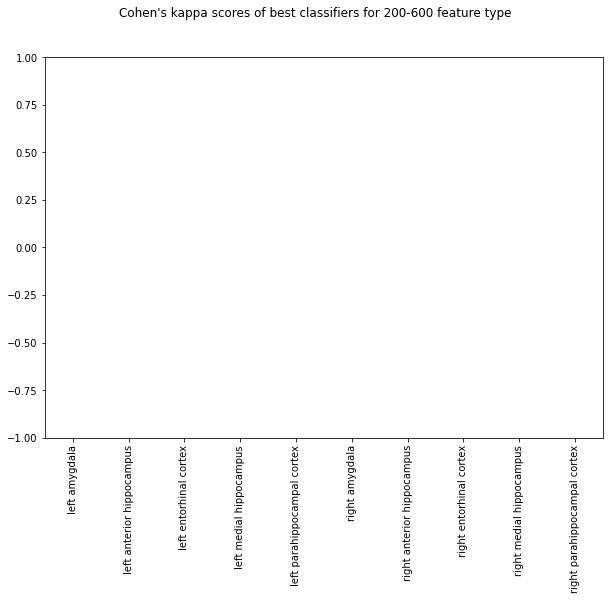

6
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.591428571428572
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.615714285714286
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.61
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.661428571428571
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.674285714285714
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.538571428571428
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.7214285714285715
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.622857142857143
brain area: right para

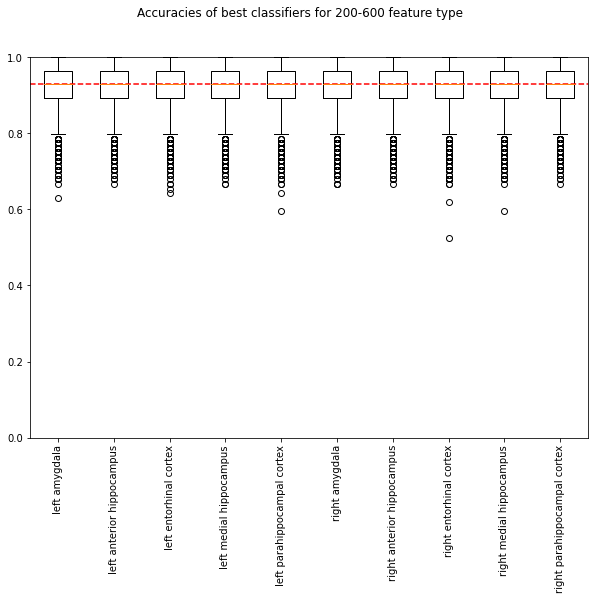

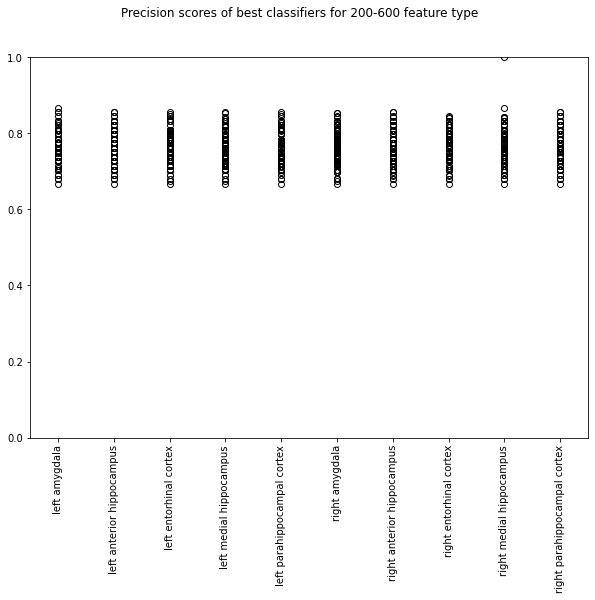

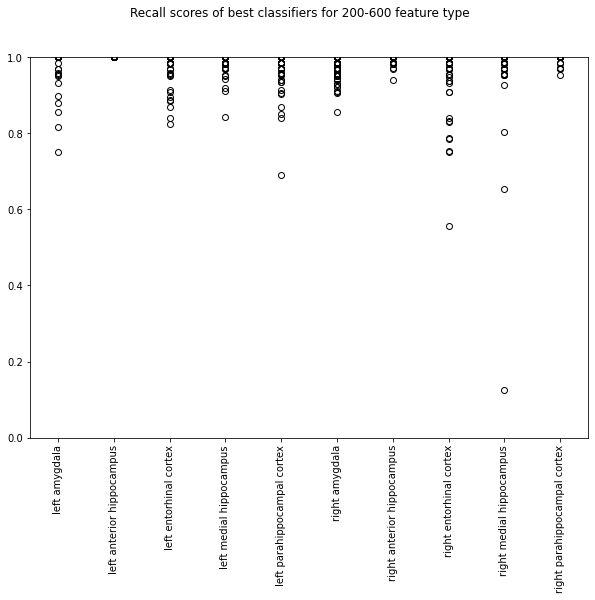

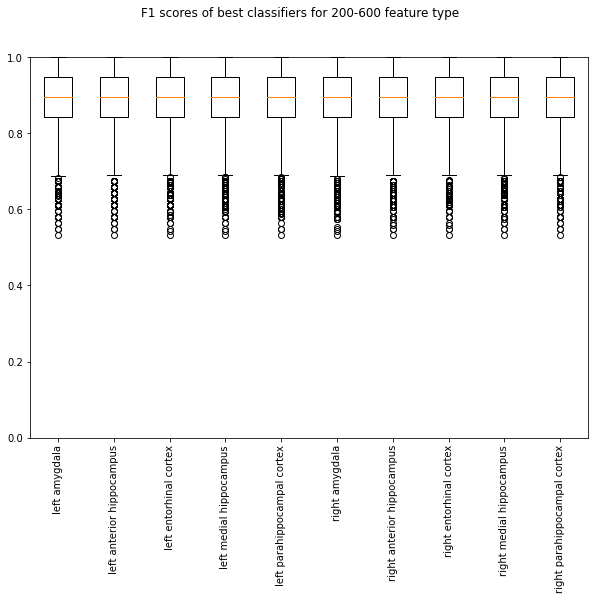

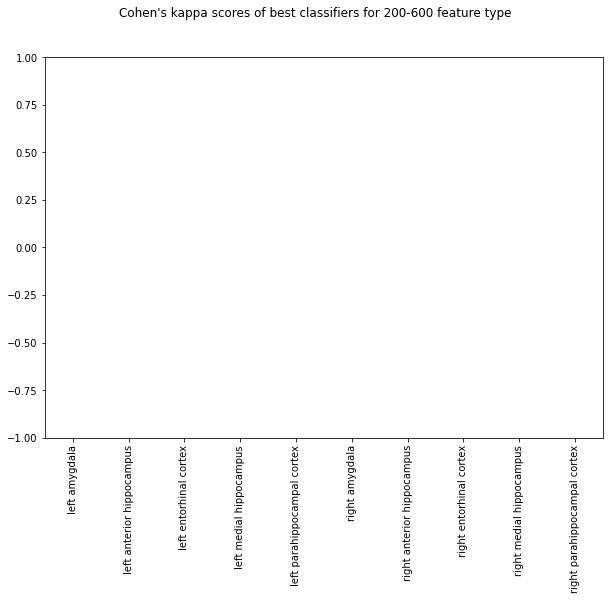

7
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.86375
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: left entorhinal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.885
brain area: left medial hippocampus
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 6.8825
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 6.925
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.9375
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.8175
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.9775
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.89125
brain area: right parahippocampal cortex
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.80125
brai

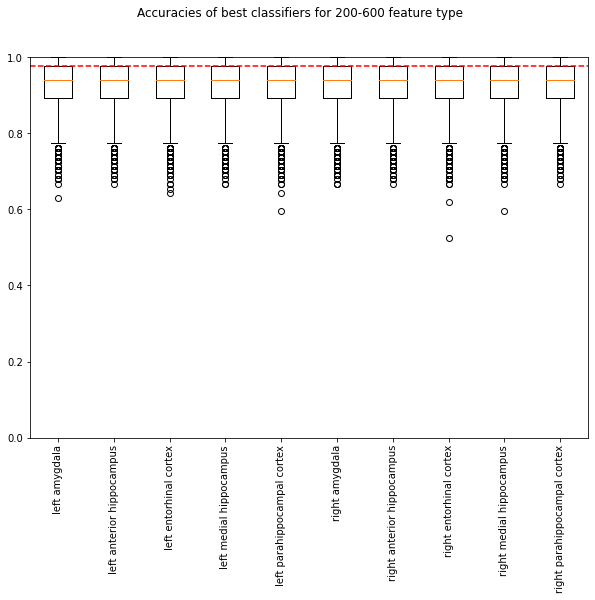

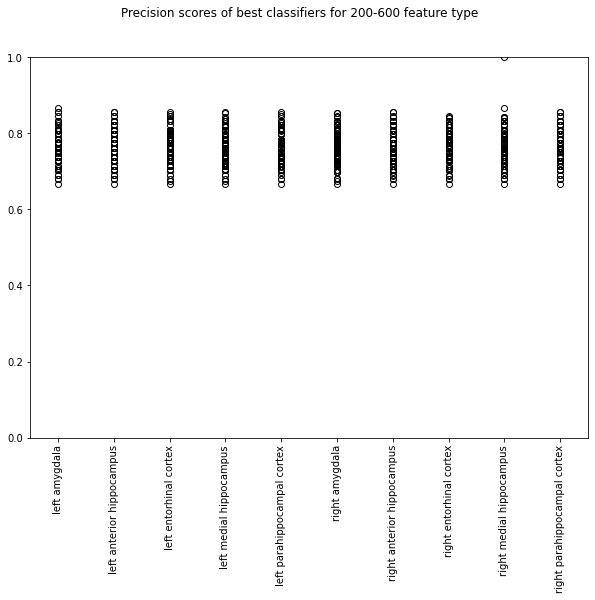

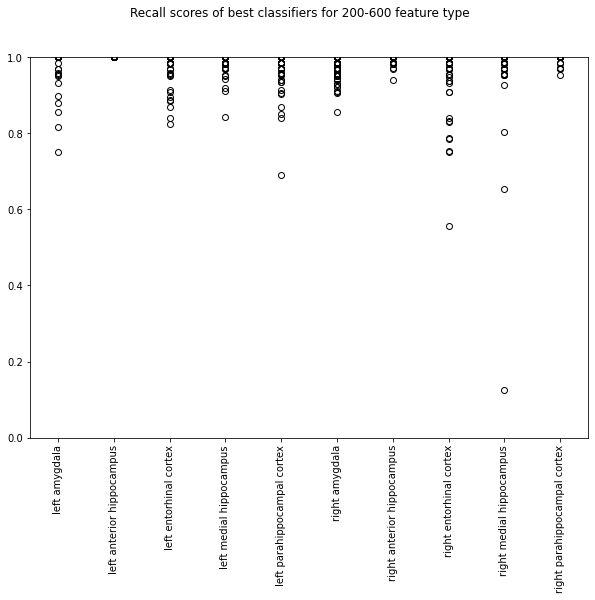

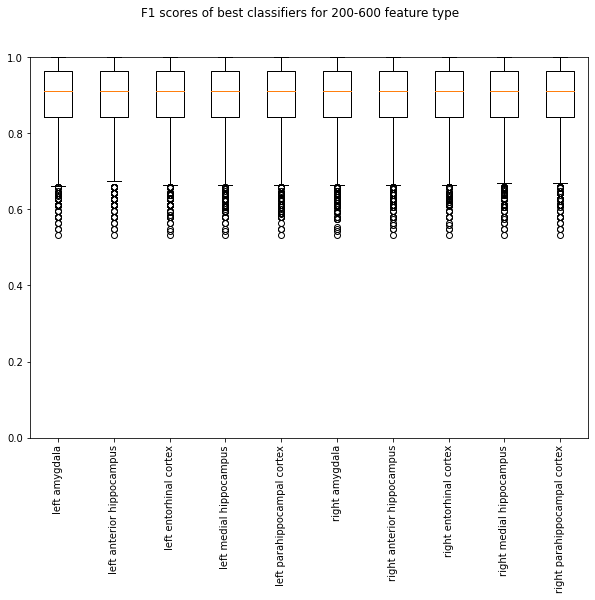

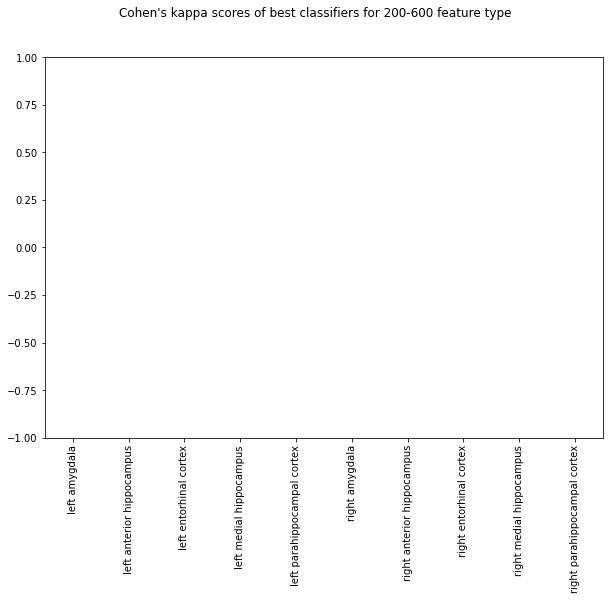

8
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.417777777777777
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: left entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.438888888888889
brain area: left medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.442222222222222
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.472222222222222
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.486666666666666
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.376666666666667
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.518888888888889
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.442222222222222
brain area: right parah

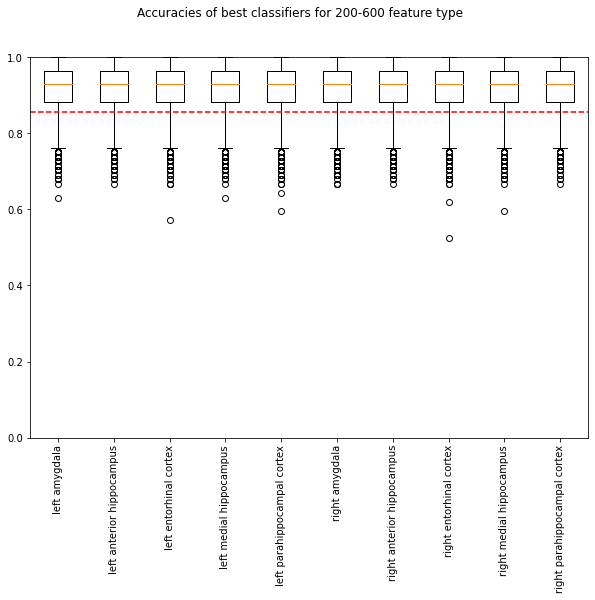

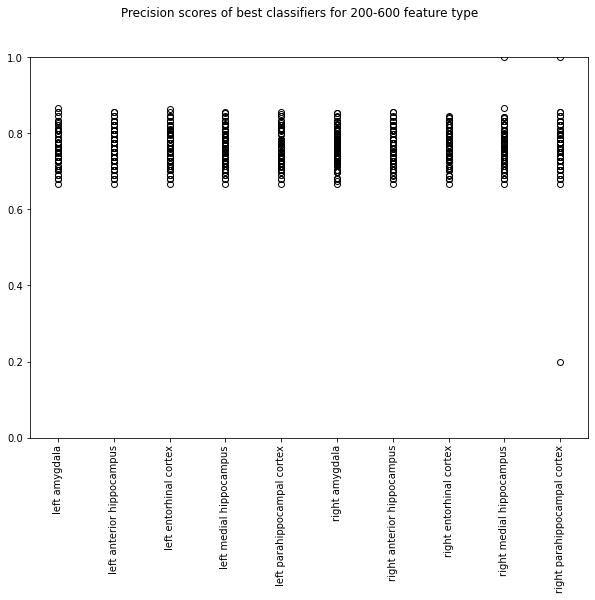

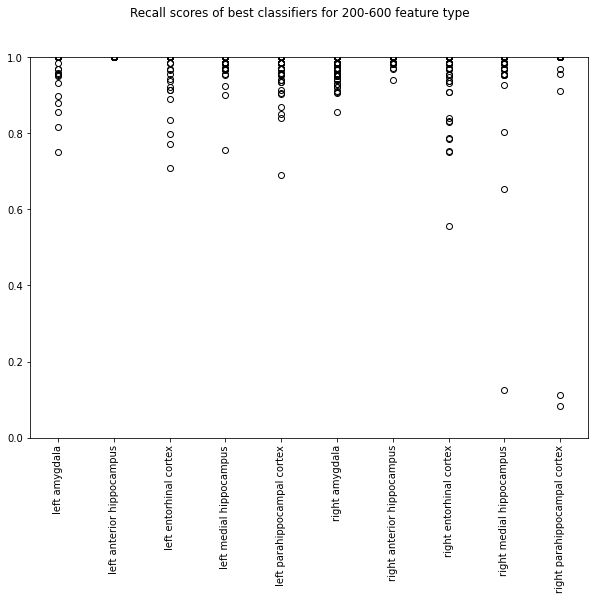

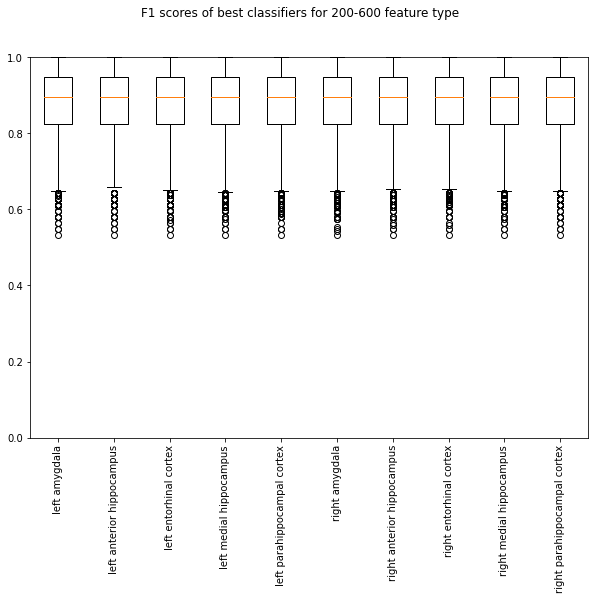

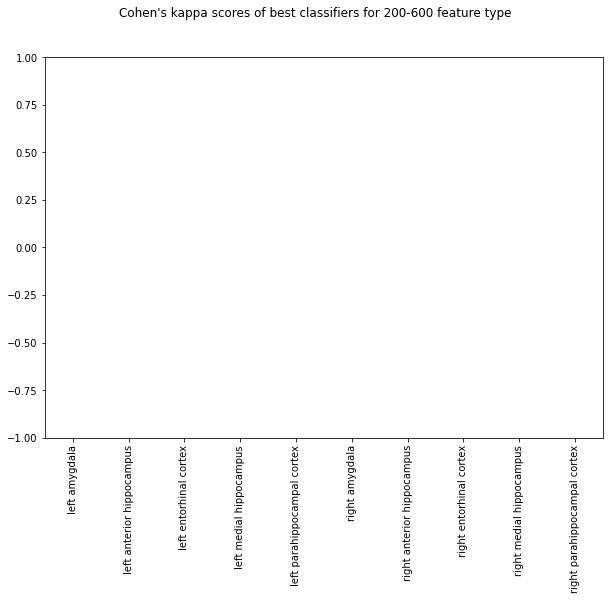

9
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.877
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: left entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.896
brain area: left medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.899
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.927
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.939
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.84
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.968
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.899
brain area: right parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.829
brain area: lef

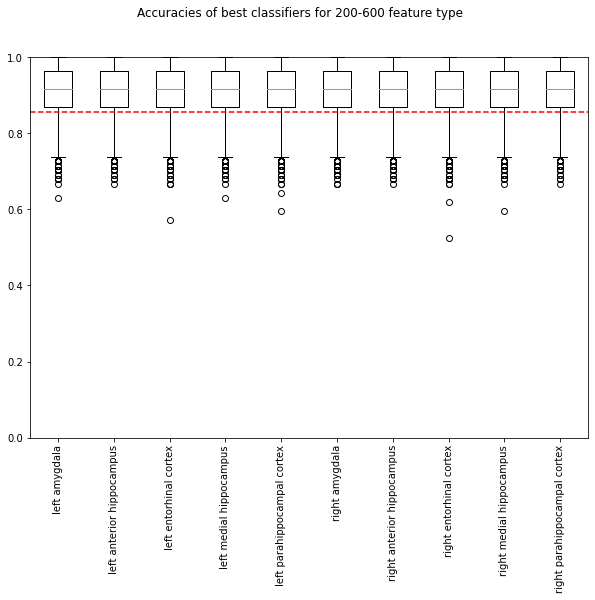

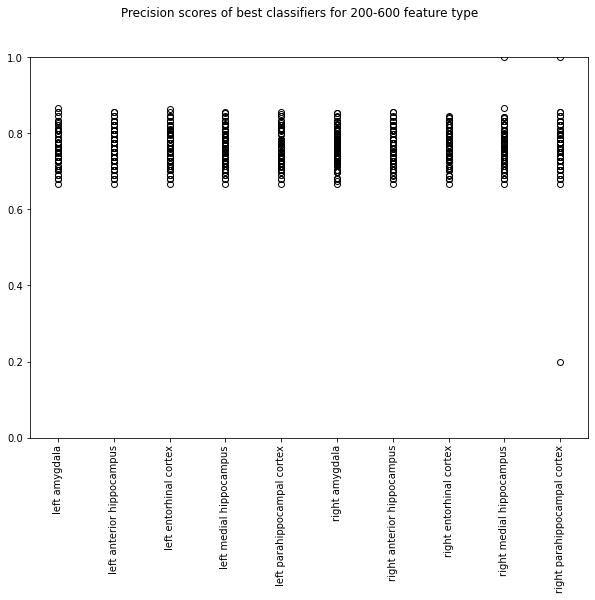

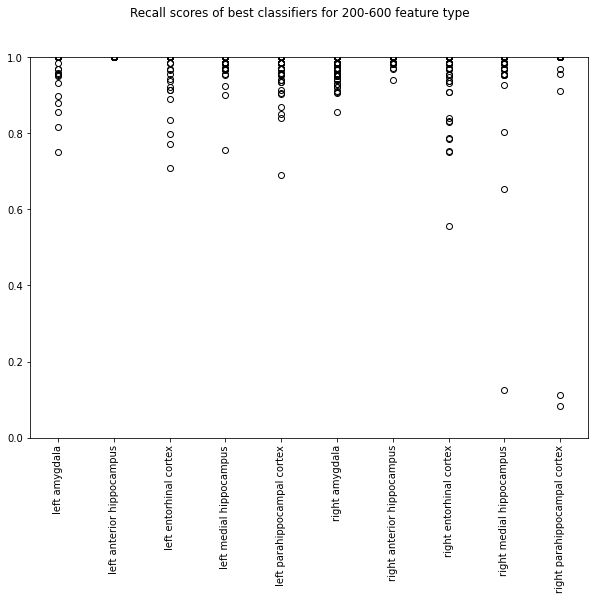

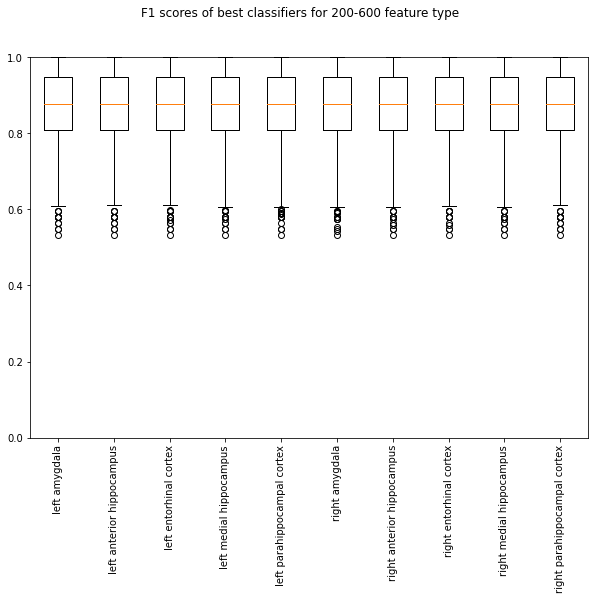

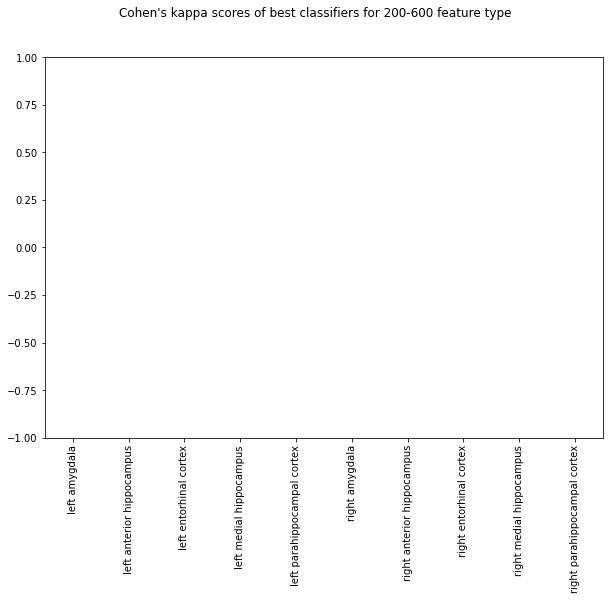

10
brain area: left amygdala
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.691818181818181
brain area: left anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: left entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.709090909090909
brain area: left medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.711818181818182
brain area: left parahippocampal cortex
best classifier: [0.001, 'hinge', 'l2', 'linear']
loss: 7.737272727272727
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.748181818181818
brain area: right anterior hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.658181818181818
brain area: right entorhinal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.774545454545454
brain area: right medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.721818181818182
brain are

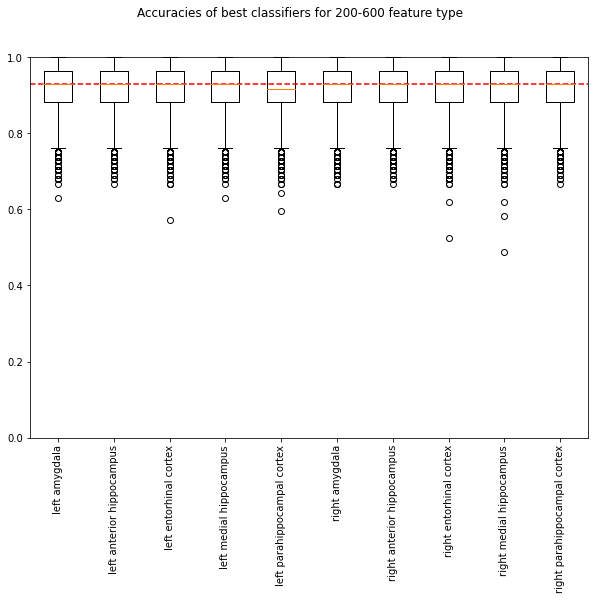

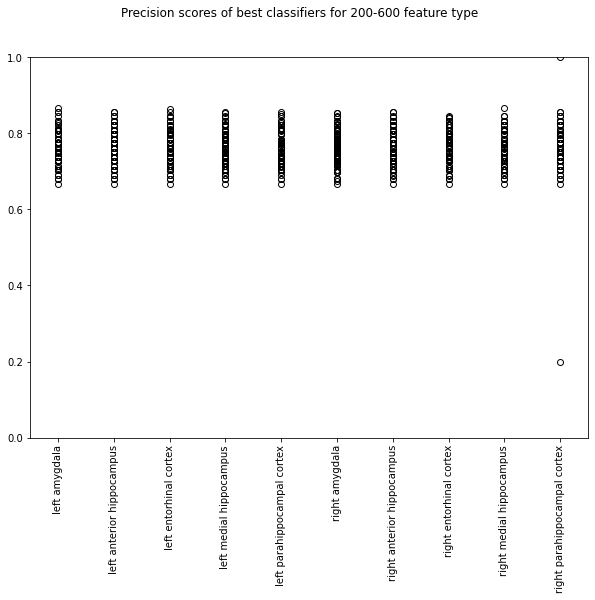

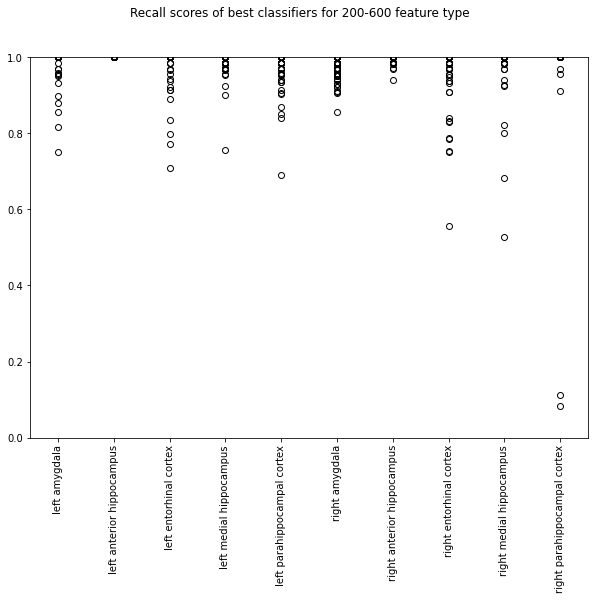

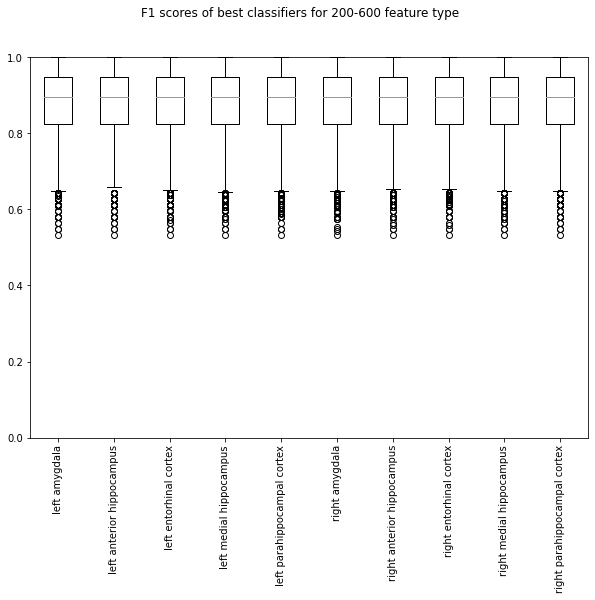

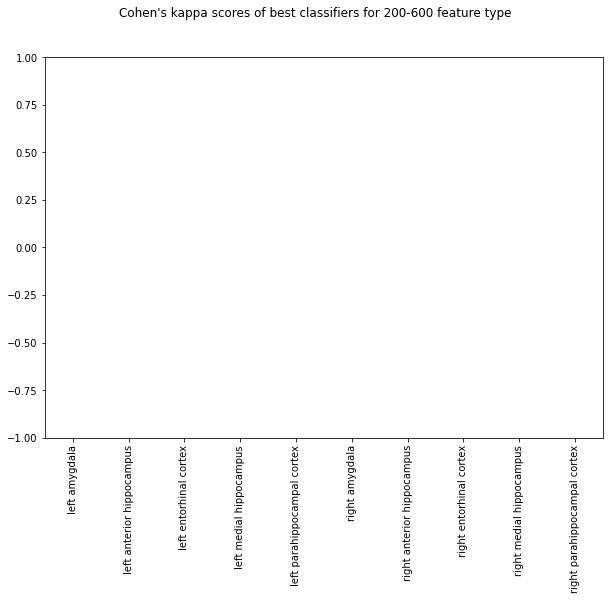

In [18]:
#NEW
#random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        best_params_list_per_area = []
        best_classifier = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[df_patient_info_new['brain_area'].str.contains(brain_area)]
        channel_cols = channel_cols.reset_index()

        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        X = df_data_post[df_data_post.columns & cols_to_use]
        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        movie_stim_percentage = (numb*100)/numb_all
        if label == 0:
            movie_stim_percentage = movie_stim_percentage
        else:
            movie_stim_percentage = 100 - movie_stim_percentage

        for rand_seed in random_seeds:
            np.random.seed(rand_seed) #for train-test split
            strings.append(rand_seed)
            best_params = {}

            # Use a K-fold cross validation with different parameters
            # Create all parameter combinations
            params = {'random_state': [rand_seed],
                      'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                      'loss': ['hinge', 'squared_hinge'],    
                      'penalty': ['l1', 'l2'],
                      #'gamma': ['scale', 'auto'],
                      #'degree': [3]
                     }
            # Create all possible parameter combinations
            combinations_linear = [[i, j, k, l] for i in params['random_state']
                           for j in params['C']
                           for k in params['loss']
                           for l in params ['penalty']]
            for s in reversed(combinations_linear):
                if (s[2] == 'hinge') and (s[3]=='l1'):
                    combinations_linear.remove(s)
            combinations = [[i, j] for i in params['random_state']
                           for j in params['C']
                           #for l in params['gamma']
                           #for k in params['degree']
                           ]

            for kernel in kernels:
                if kernel == 'linear':
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations_linear, kernel, rand_seed, 'CondensedNN')
                else:
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations, kernel, rand_seed, 'CondensedNN') 

                all_losses.append([losses, brain_area])

    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_precisions_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_recalls_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_f1s_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_kappas_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, movie_stim_percentage, fig_save_path)

0
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 20.16
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 20.16
brain area: left entorhinal cortex
best classifier: [0.1, 'hinge', 'l2', 'linear']
loss: 20.15
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 20.16
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 20.16
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss

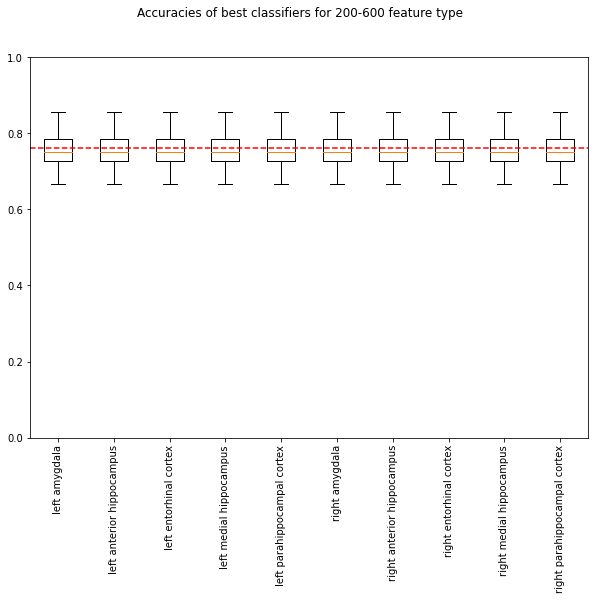

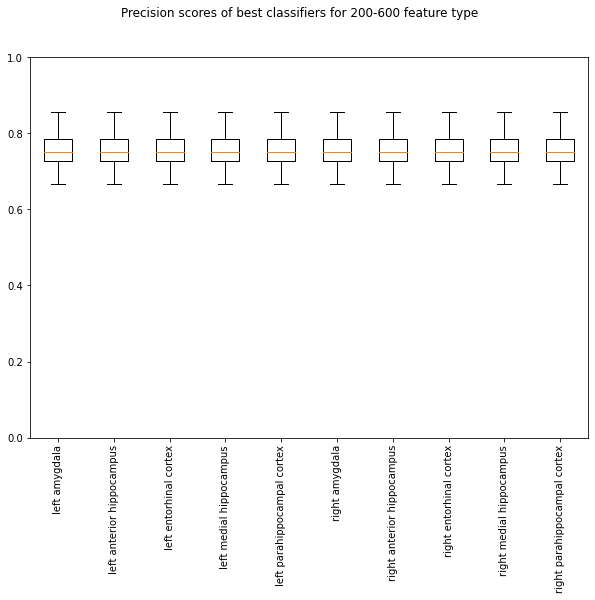

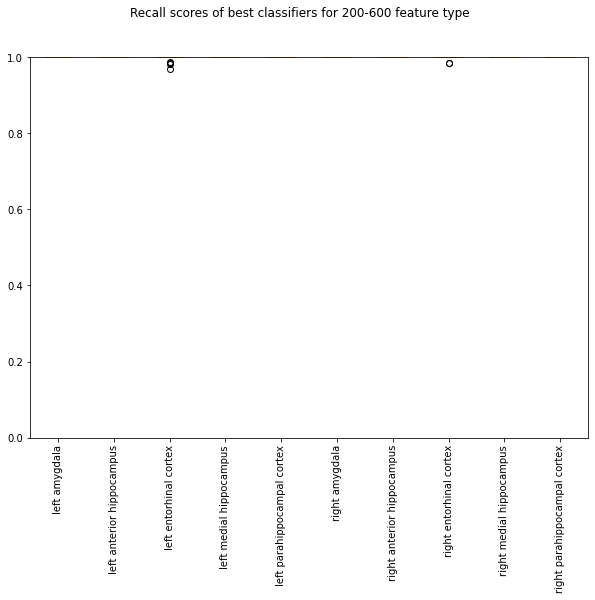

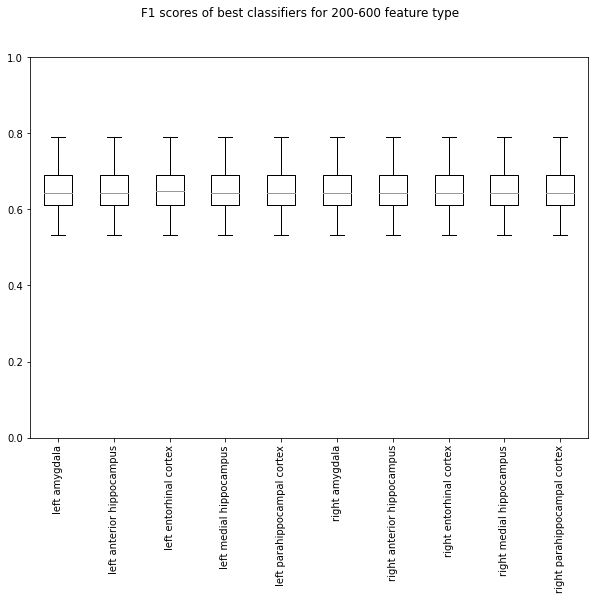

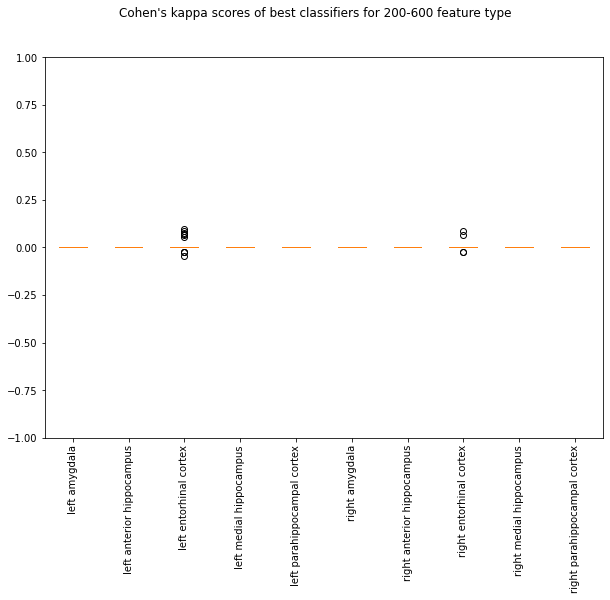

1
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 11.105
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 11.105
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 11.105
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 11.105
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 11.105
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l

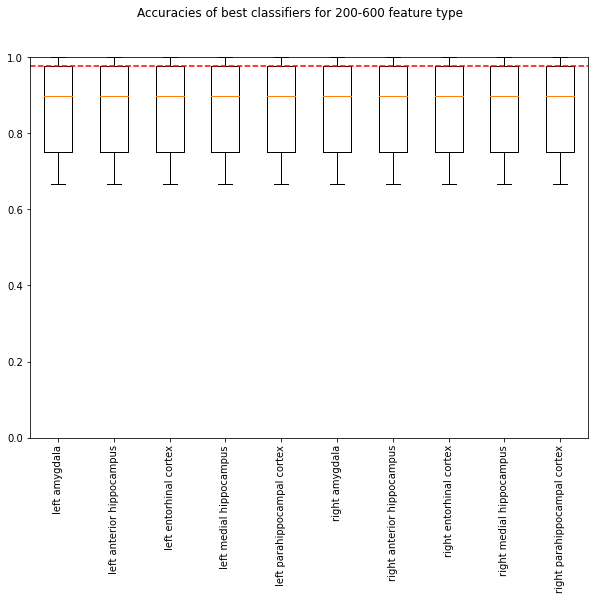

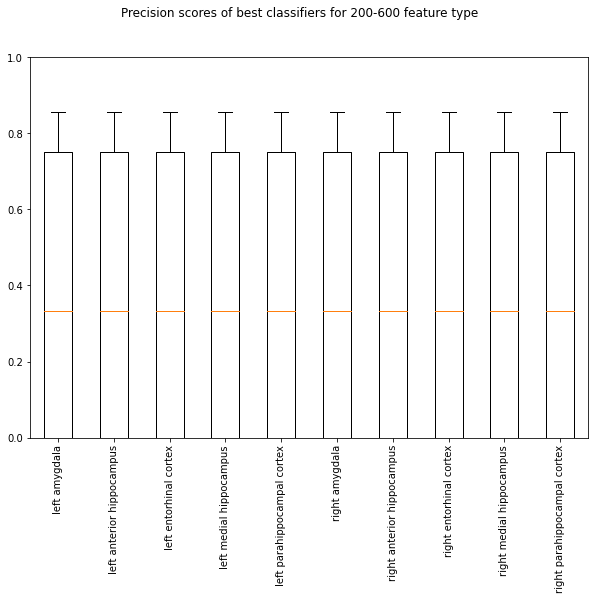

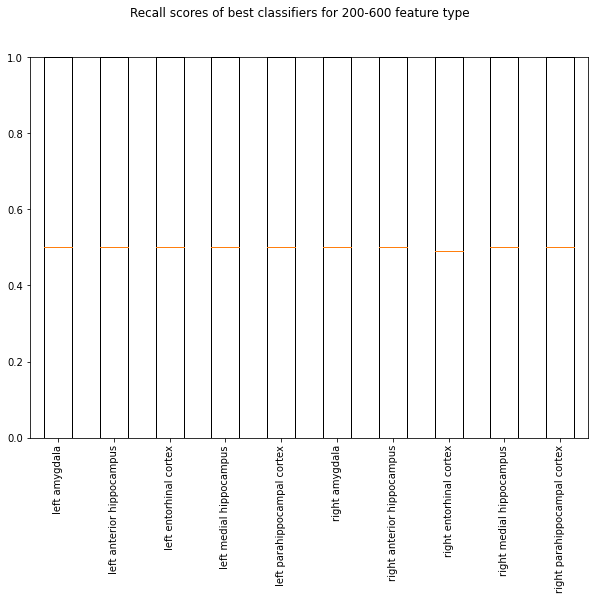

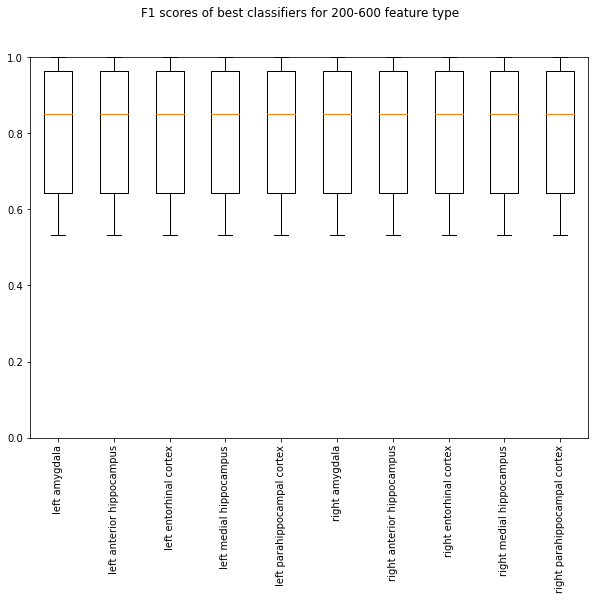

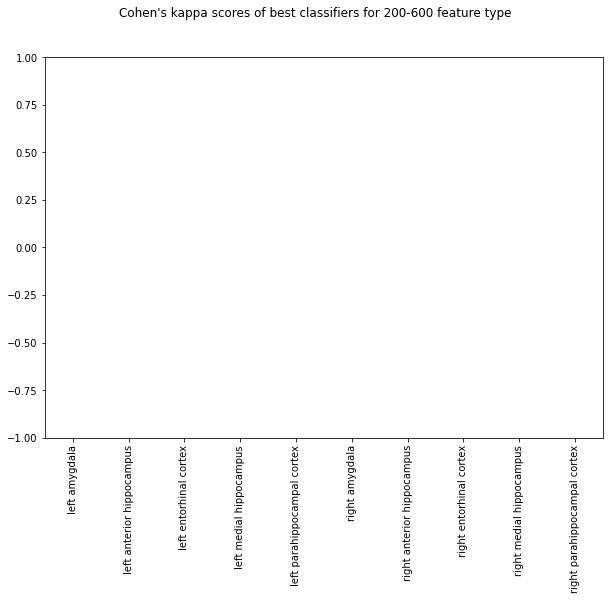

2
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 8.1
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 8.1
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 8.1
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 8.1
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 8.1
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 8.1
bra

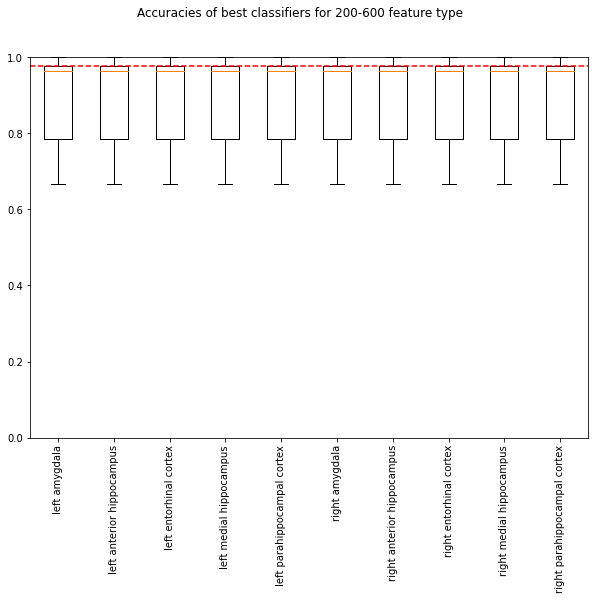

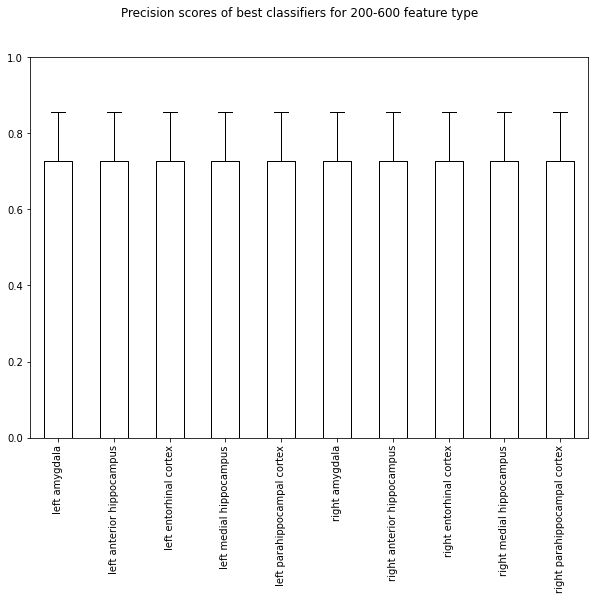

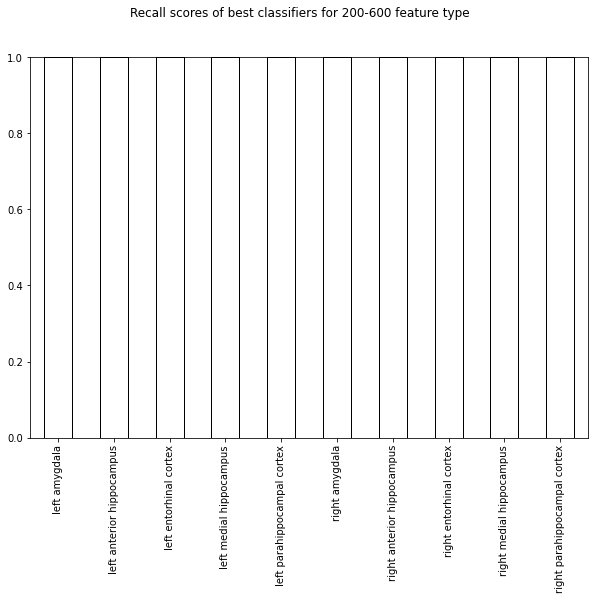

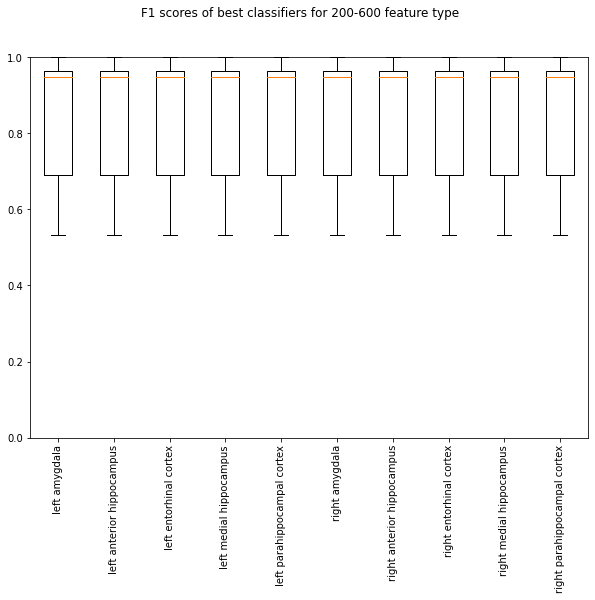

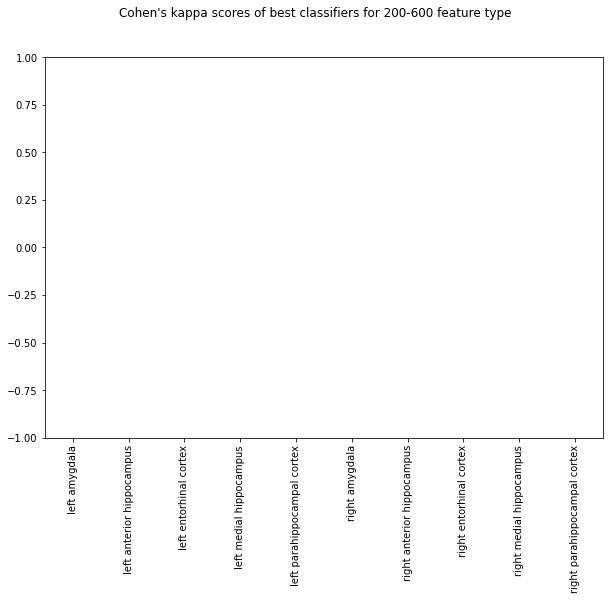

3
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.605
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.605
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.605
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.605
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.605
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'line

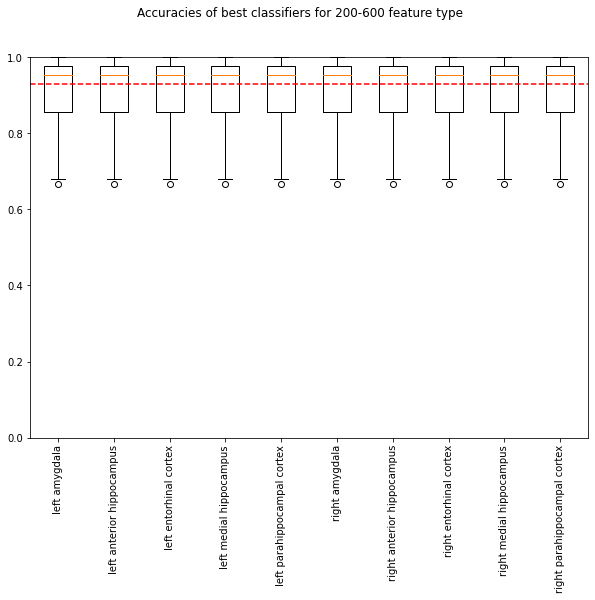

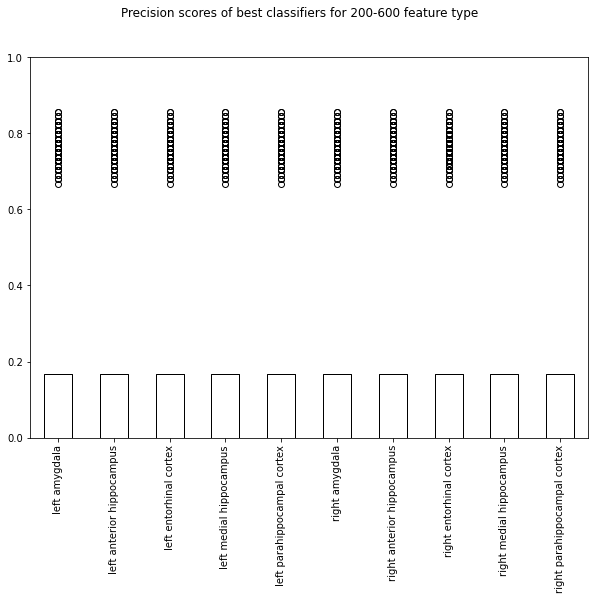

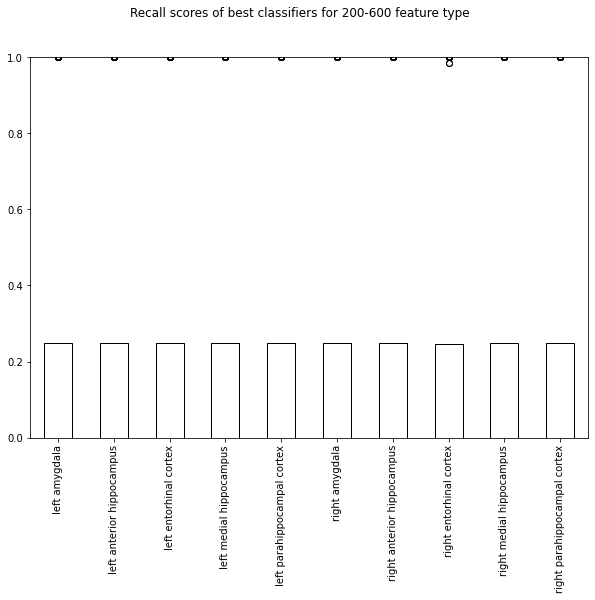

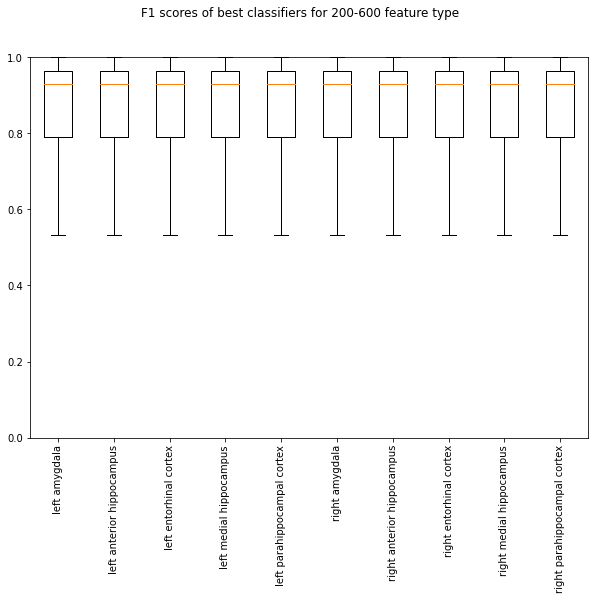

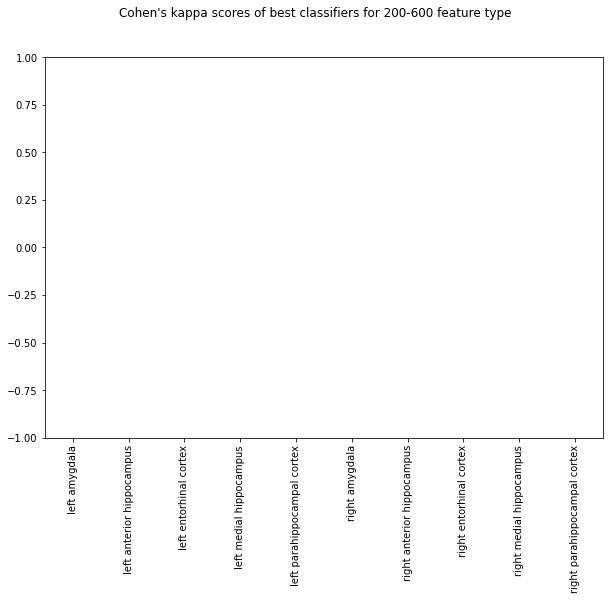

4
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.68
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.68
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.68
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.68
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.68
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss

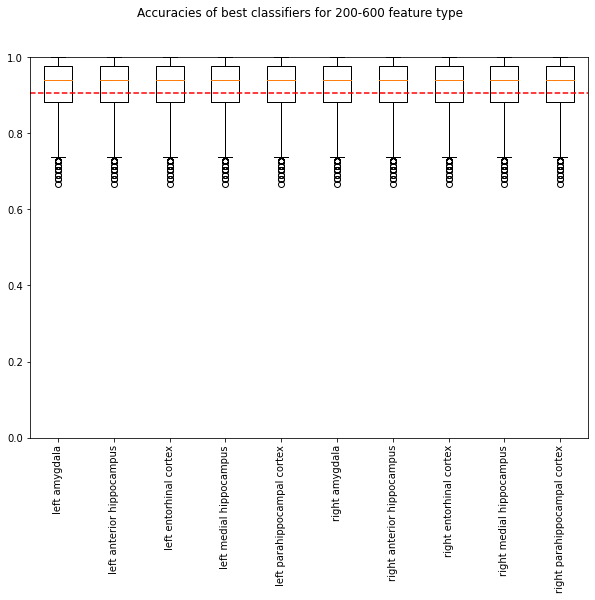

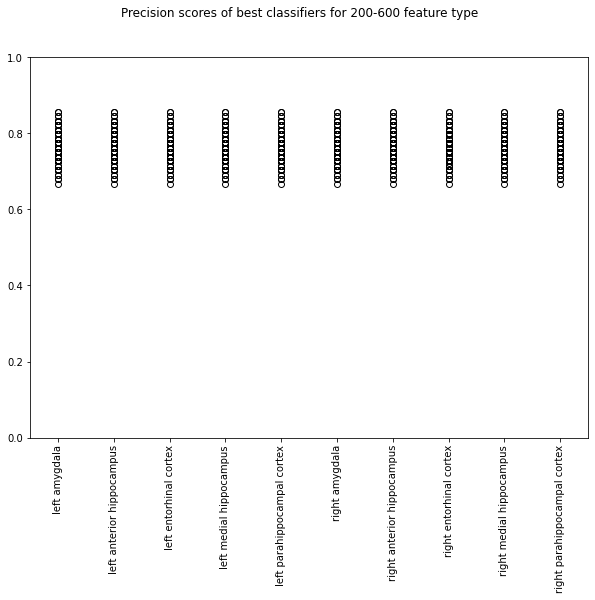

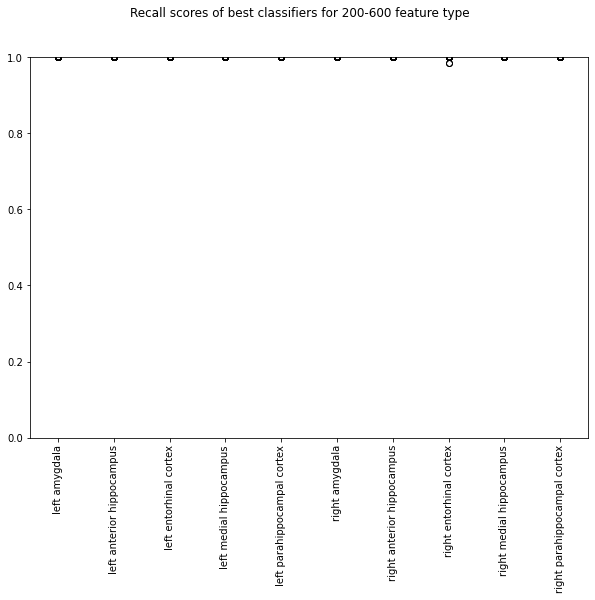

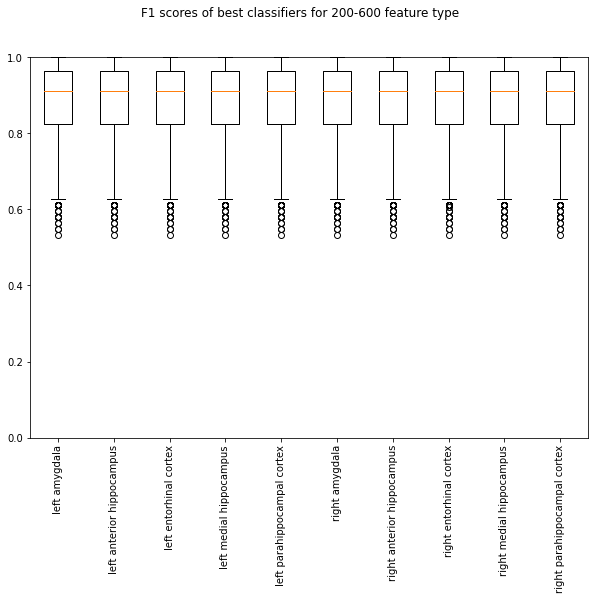

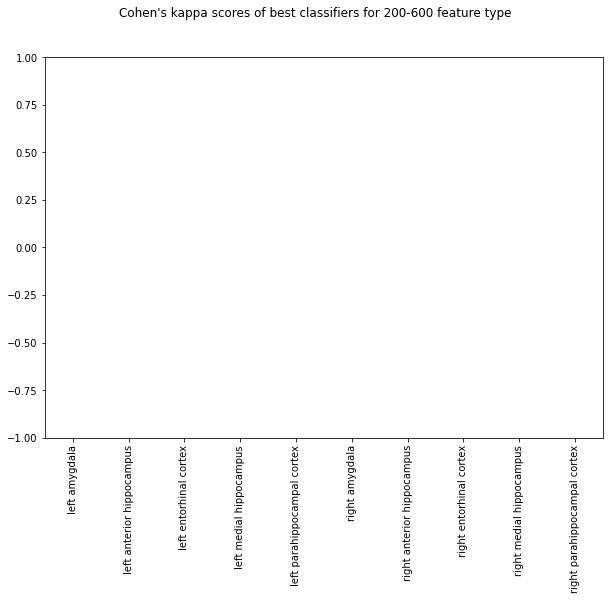

5
brain area: left amygdala
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.71
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.71
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.71
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.71
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.71
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss

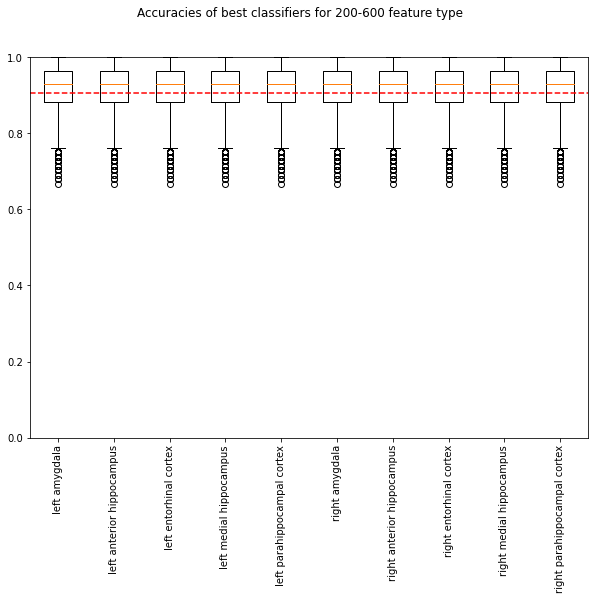

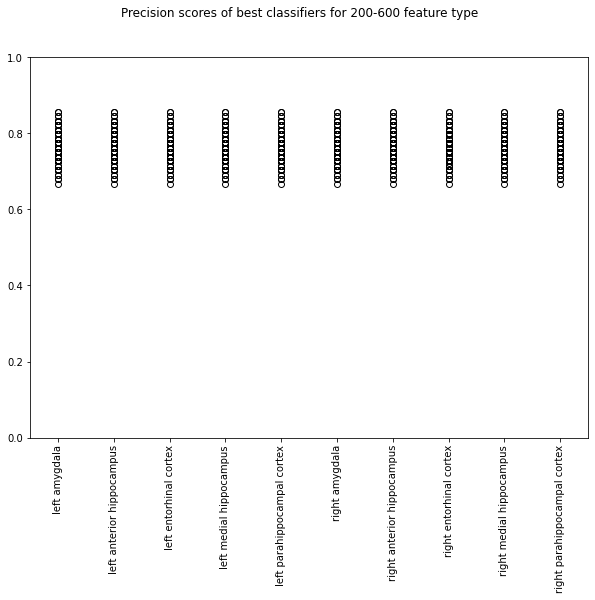

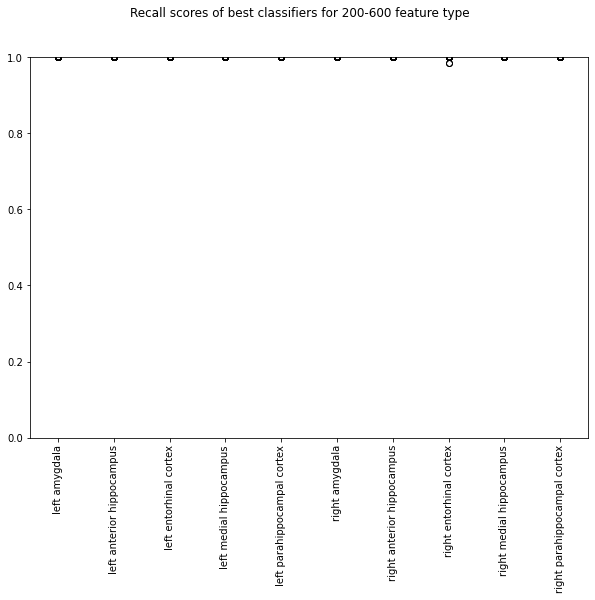

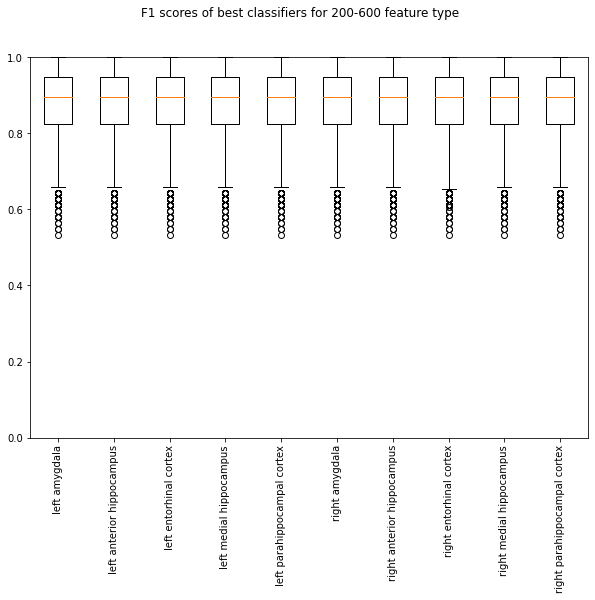

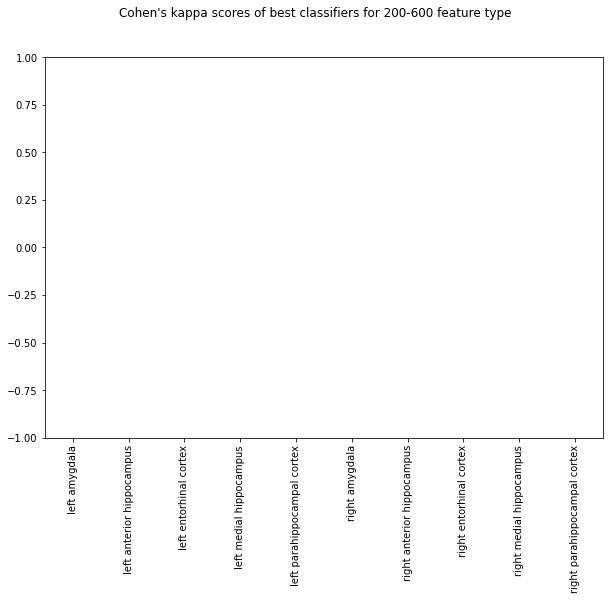

6
brain area: left amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.5042857142857144
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.5042857142857144
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.5042857142857144
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.5042857142857144
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7

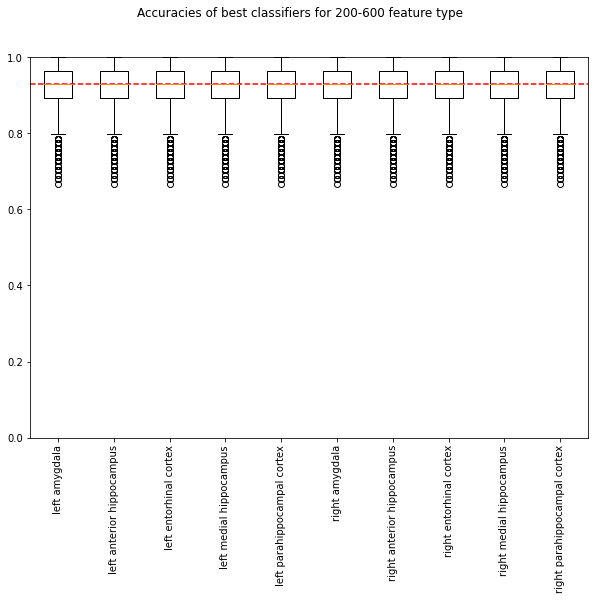

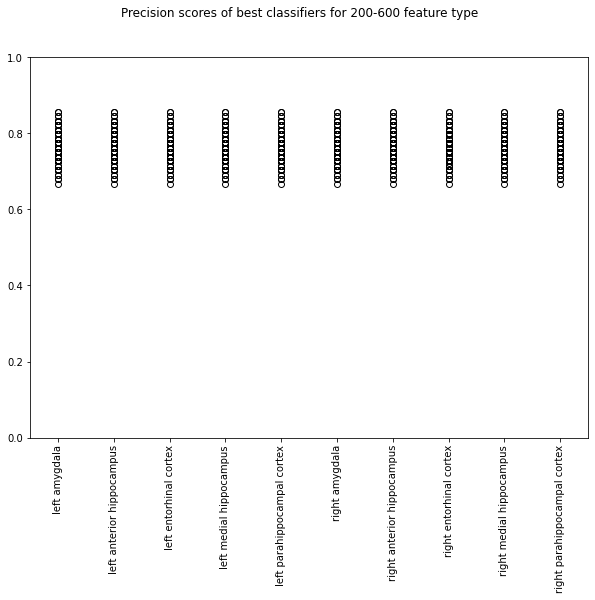

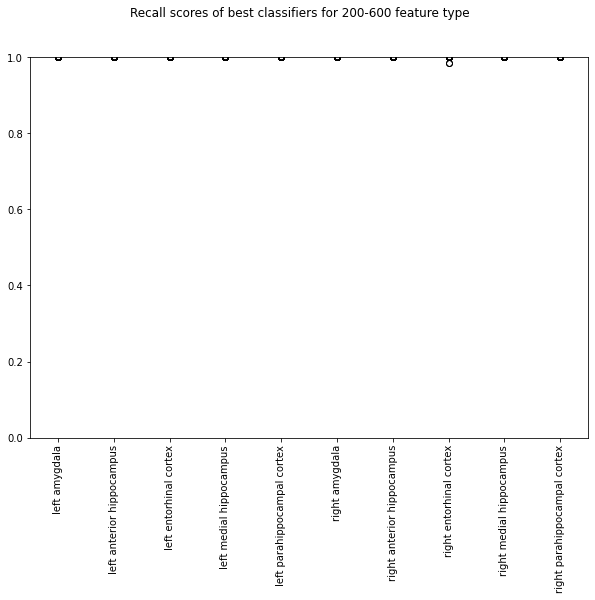

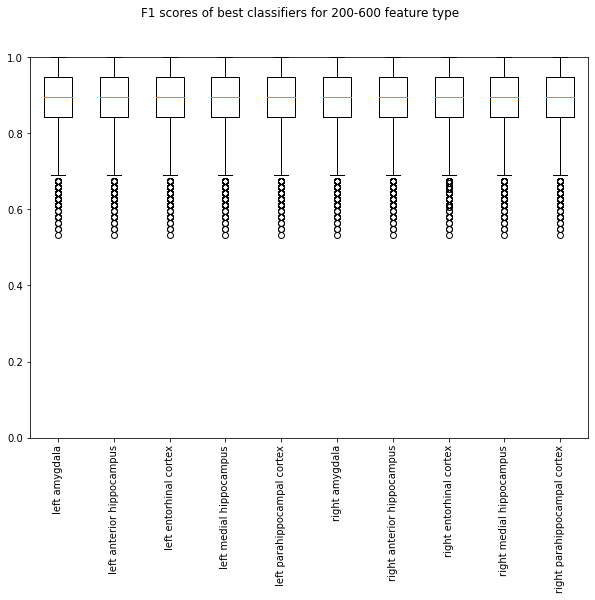

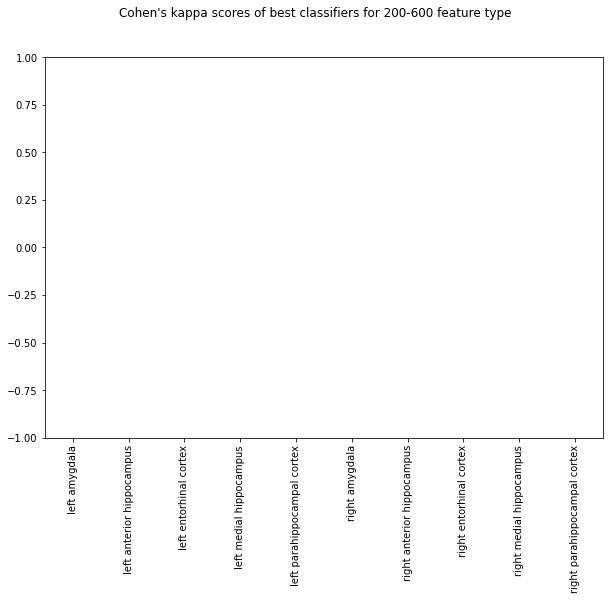

7
brain area: left amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 6.7875
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 6.7875
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 6.7875
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 6.7875
brain area: right parahippocampal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'l

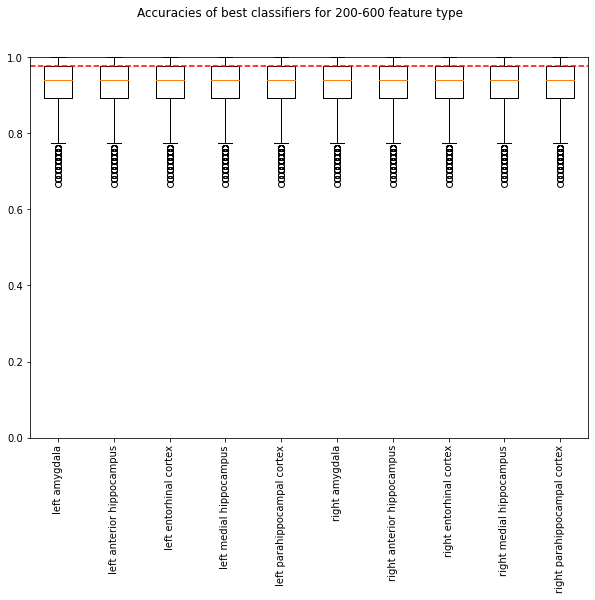

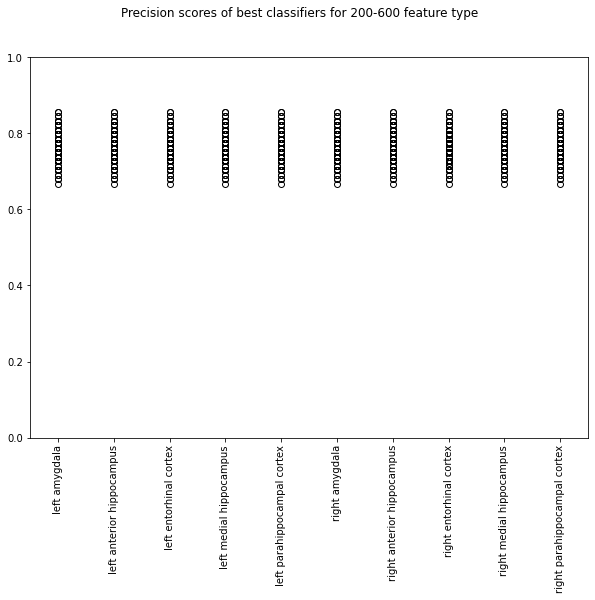

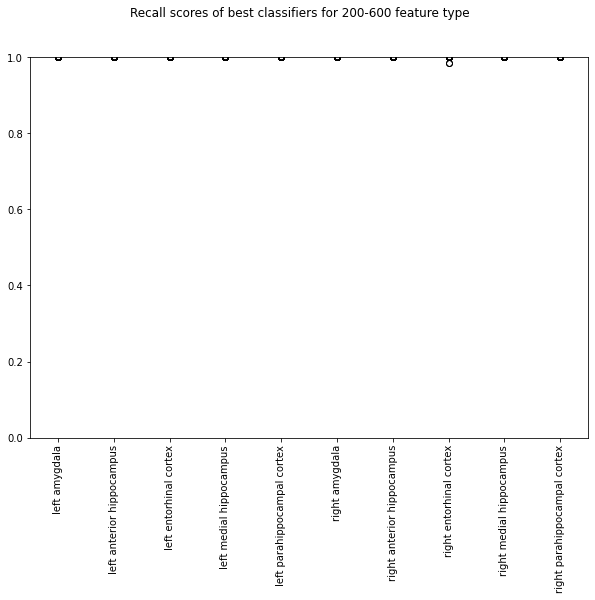

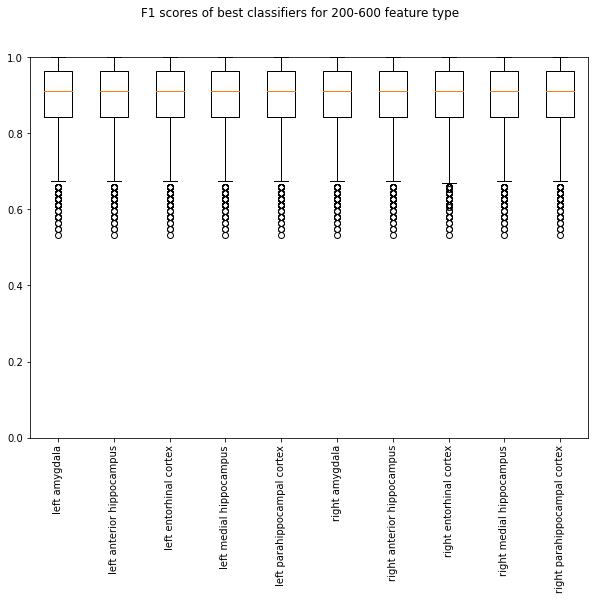

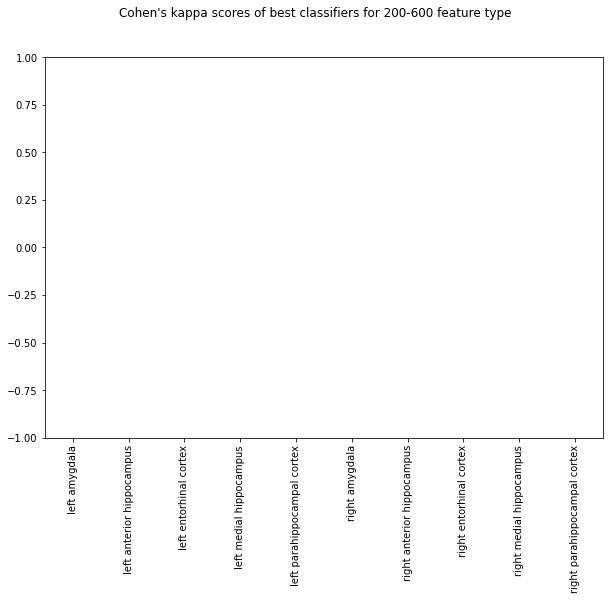

8
brain area: left amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.35
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.35
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.35
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.35
brain area: right parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.35
brain

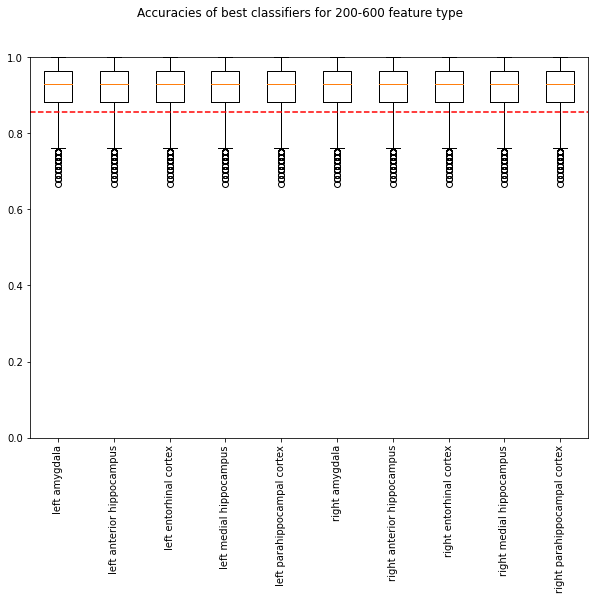

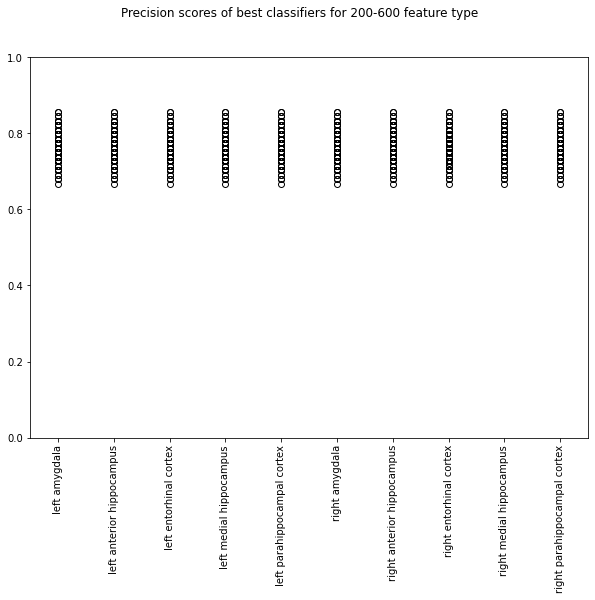

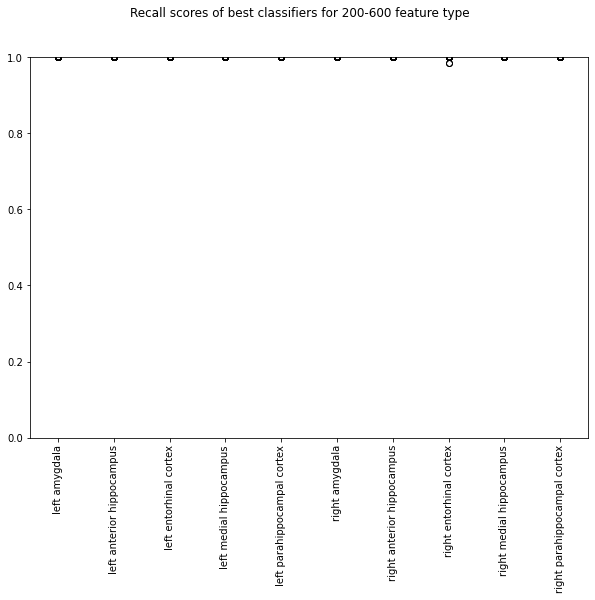

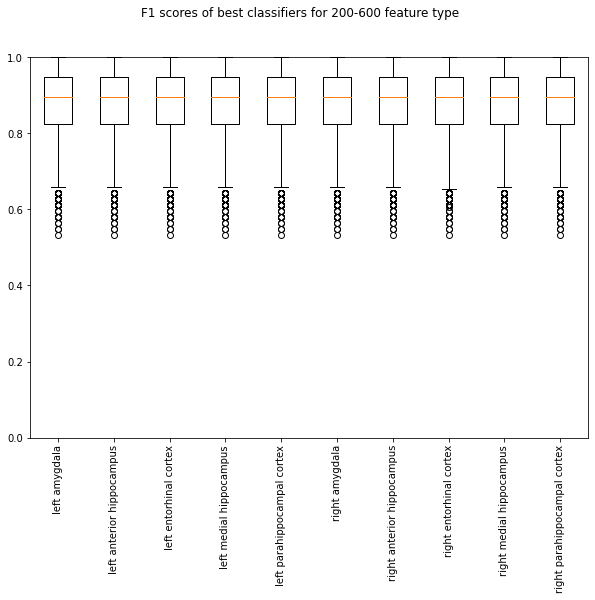

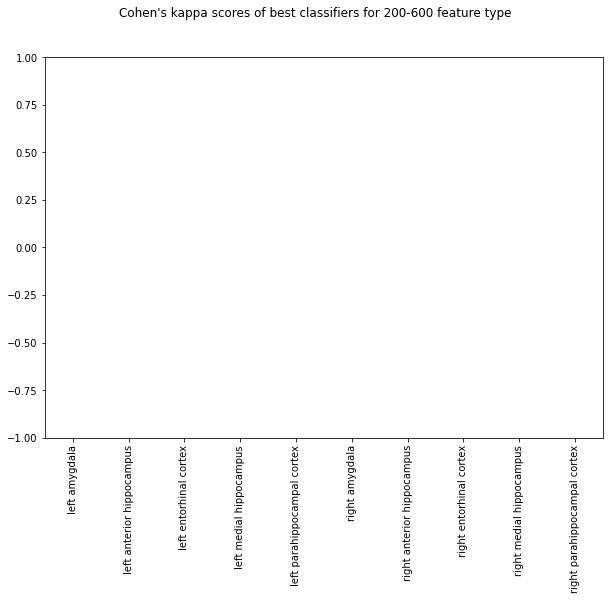

9
brain area: left amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.816
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.816
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.816
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.816
brain area: right parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7

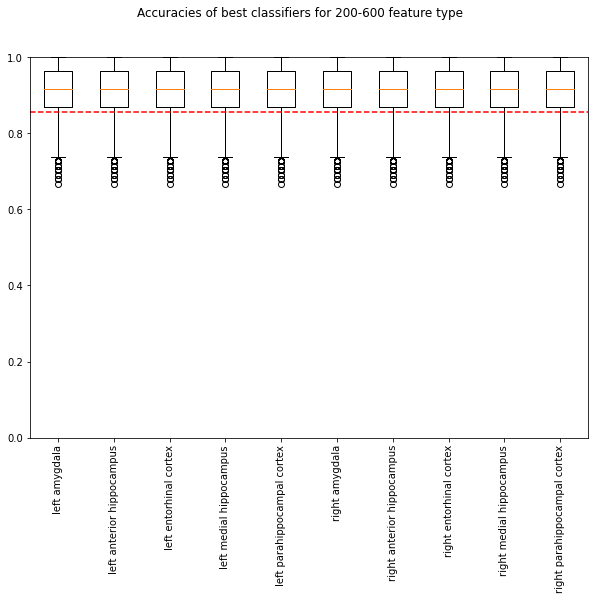

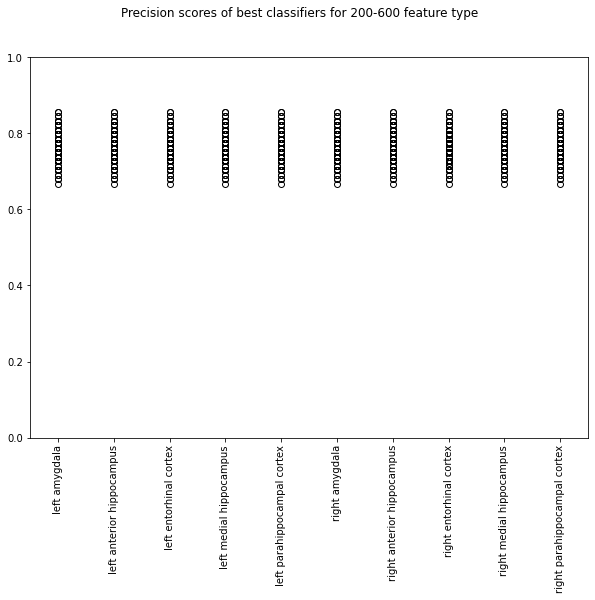

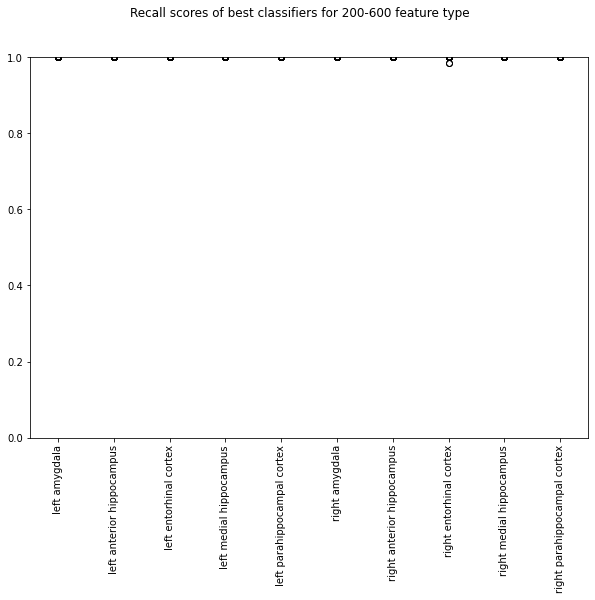

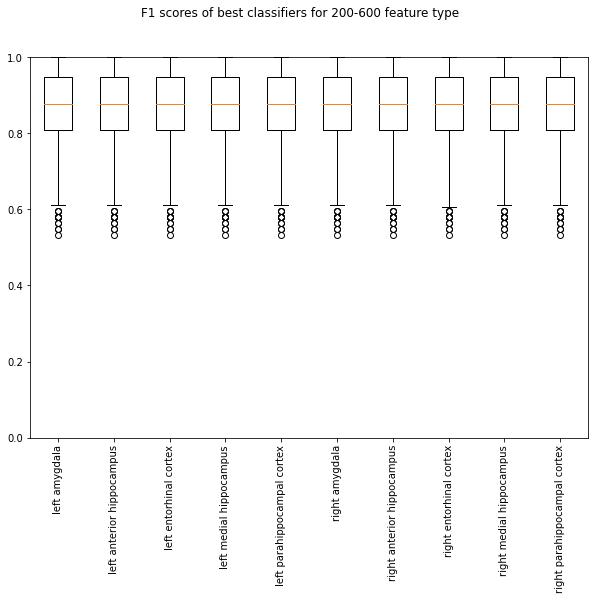

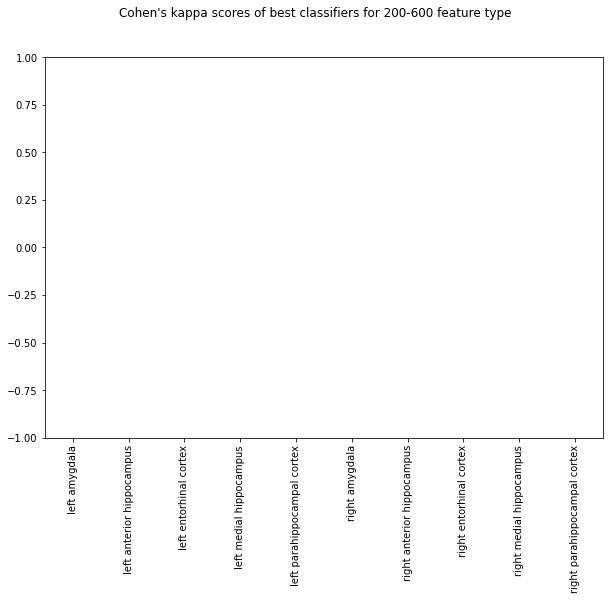

10
brain area: left amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: left anterior hippocampus
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.636363636363637
brain area: left entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.636363636363637
brain area: left medial hippocampus
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: left parahippocampal cortex
best classifier: [0.0001, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: right amygdala
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: right anterior hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.636363636363637
brain area: right entorhinal cortex
best classifier: [0.01, 'squared_hinge', 'l1', 'linear']
loss: 7.636363636363637
brain area: right medial hippocampus
best classifier: [0.0005, 'hinge', 'l2', 'linear']
loss: 7.636363

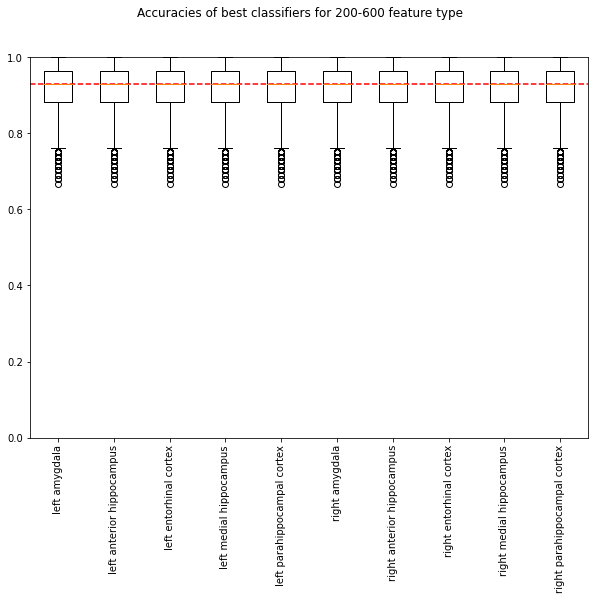

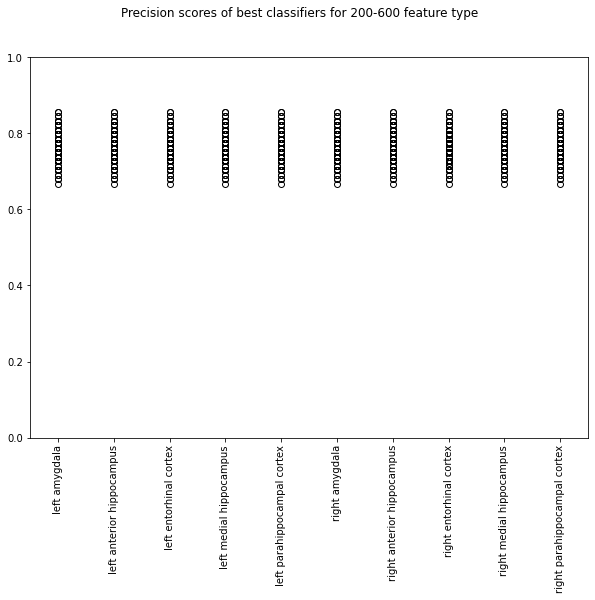

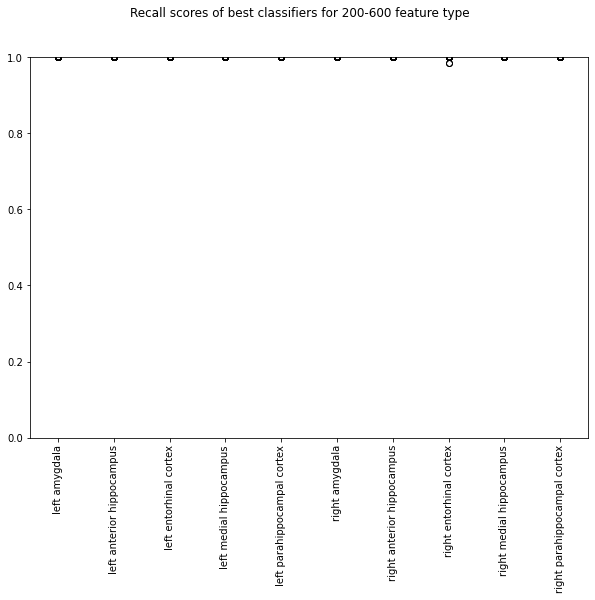

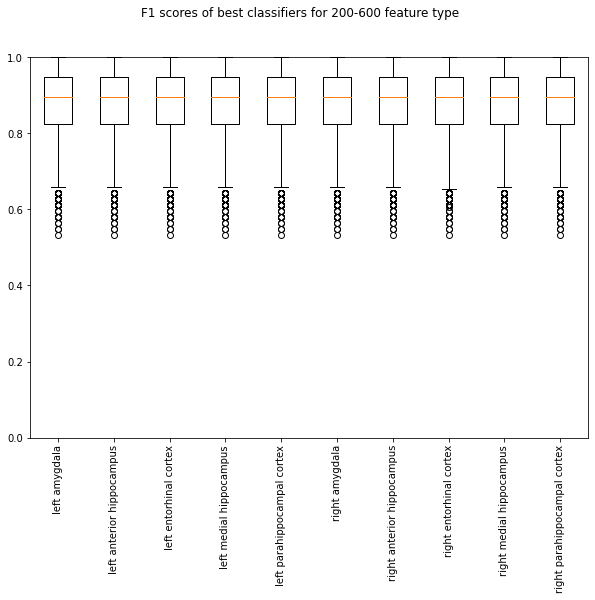

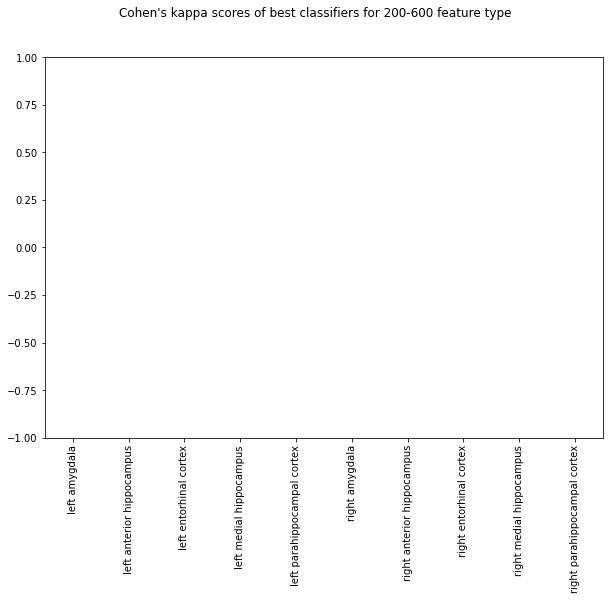

In [19]:
#NEW
#random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        best_params_list_per_area = []
        best_classifier = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[df_patient_info_new['brain_area'].str.contains(brain_area)]
        channel_cols = channel_cols.reset_index()

        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        X = df_data_post[df_data_post.columns & cols_to_use]
        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        movie_stim_percentage = (numb*100)/numb_all
        if label == 0:
            movie_stim_percentage = movie_stim_percentage
        else:
            movie_stim_percentage = 100 - movie_stim_percentage

        for rand_seed in random_seeds:
            np.random.seed(rand_seed) #for train-test split
            strings.append(rand_seed)
            best_params = {}

            # Use a K-fold cross validation with different parameters
            # Create all parameter combinations
            params = {'random_state': [rand_seed],
                      'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                      'loss': ['hinge', 'squared_hinge'],    
                      'penalty': ['l1', 'l2'],
                      #'gamma': ['scale', 'auto'],
                      #'degree': [3]
                     }
            # Create all possible parameter combinations
            combinations_linear = [[i, j, k, l] for i in params['random_state']
                           for j in params['C']
                           for k in params['loss']
                           for l in params ['penalty']]
            for s in reversed(combinations_linear):
                if (s[2] == 'hinge') and (s[3]=='l1'):
                    combinations_linear.remove(s)
            combinations = [[i, j] for i in params['random_state']
                           for j in params['C']
                           #for l in params['gamma']
                           #for k in params['degree']
                           ]

            for kernel in kernels:
                if kernel == 'linear':
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations_linear, kernel, rand_seed, 'OneSidedSelection')
                else:
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations, kernel, rand_seed, 'OneSidedSelection') 

                all_losses.append([losses, brain_area])

    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_precisions_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_recalls_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_f1s_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_kappas_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, movie_stim_percentage, fig_save_path)

In [20]:
#NEW
#random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        best_params_list_per_area = []
        best_classifier = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[df_patient_info_new['brain_area'].str.contains(brain_area)]
        channel_cols = channel_cols.reset_index()

        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_mean')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_median')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_variance')
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600'+'_rms')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))

        X = df_data_post[df_data_post.columns & cols_to_use]
        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        movie_stim_percentage = (numb*100)/numb_all
        if label == 0:
            movie_stim_percentage = movie_stim_percentage
        else:
            movie_stim_percentage = 100 - movie_stim_percentage

        for rand_seed in random_seeds:
            np.random.seed(rand_seed) #for train-test split
            strings.append(rand_seed)
            best_params = {}

            # Use a K-fold cross validation with different parameters
            # Create all parameter combinations
            params = {'random_state': [rand_seed],
                      'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                      'loss': ['hinge', 'squared_hinge'],    
                      'penalty': ['l1', 'l2'],
                      #'gamma': ['scale', 'auto'],
                      #'degree': [3]
                     }
            # Create all possible parameter combinations
            combinations_linear = [[i, j, k, l] for i in params['random_state']
                           for j in params['C']
                           for k in params['loss']
                           for l in params ['penalty']]
            for s in reversed(combinations_linear):
                if (s[2] == 'hinge') and (s[3]=='l1'):
                    combinations_linear.remove(s)
            combinations = [[i, j] for i in params['random_state']
                           for j in params['C']
                           #for l in params['gamma']
                           #for k in params['degree']
                           ]

            for kernel in kernels:
                if kernel == 'linear':
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations_linear, kernel, rand_seed, 'NeighbourCleaningRule')
                else:
                    losses, classifier = decoding.custom_SVM_one_run_resampling(X, y, combinations, kernel, rand_seed, 'NeighbourCleaningRule') 

                all_losses.append([losses, brain_area])

    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_precisions_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_recalls_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_f1s_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)
    decoding.print_avg_kappas_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, movie_stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, movie_stim_percentage, fig_save_path)

0


UnboundLocalError: local variable 'rs' referenced before assignment

In [ ]:
random_seeds = [1, 10, 42, 86, 100]
#random_seeds = [1, 10]
#random_seeds = np.linspace(1, 500, 100, dtype=int)
kernels = ['poly', 'linear', 'rbf', 'sigmoid']
strings = []
all_best_params_list = []
best_params_list = []
all_losses = []
feature_type = '200-600'
K=8

for label in range(len(class_labels)):
    print(label)
    for brain_area in brain_areas:
        best_params_list_per_area = []
        strings.append(brain_area)
        channel_cols = df_patient_info.loc[df_patient_info_new['brain_area'].str.contains(brain_area)]
        channel_cols = channel_cols.reset_index() 
        
        cols_to_use = []
        for filt in filtering_type:
            for i in range(len(channel_cols)):
                #print(for_cols.loc[i,'channel_name'])
                cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_200_600')
                #cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_500_800')            
                #for j in range (1, n_pca_components):
                #    cols_to_use.append(filt+'_'+channel_cols.loc[i,'channel_name']+'_pca_'+str(j))
        X = df_data_post[df_data_post.columns & cols_to_use]

        #for multiclass one-vs-one: belongs to movie or not
        classes_new = classes.copy()
        if label == 0:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 1
        elif label == 1:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
        else:
            classes_new.loc[(classes_new.is_500_days != label),'is_500_days'] = 0
            classes_new.loc[(classes_new.is_500_days == label),'is_500_days'] = 1
        y = classes_new['is_500_days']
        numb_all = len(classes_new['is_500_days'])
        numb = len(classes_new[classes_new['is_500_days']==1])
        stim_percentage = (numb*100)/numb_all
        if label == 0:
            stim_percentage = stim_percentage
        else:
            stim_percentage = 100 - stim_percentage
        
        for rand_seed in random_seeds:
            np.random.seed(rand_seed) #for train-test split
            strings.append(rand_seed)

            best_params = {}
            # Use a K-fold cross validation with different parameters
            # Create all parameter combinations
            params = {'random_state': [rand_seed],
                      'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
                      'loss': ['hinge', 'squared_hinge'],    
                      'penalty': ['l1', 'l2'],
                      #'gamma': ['scale', 'auto'],
                      #'degree': [3]
                     }
            # Create all possible parameter combinations
            combinations_linear = [[i, j, k, l] for i in params['random_state']
                           for j in params['C']
                           for k in params['loss']
                           for l in params ['penalty']]
            for s in reversed(combinations_linear):
                if (s[2] == 'hinge') and (s[3]=='l1'):
                    combinations_linear.remove(s)
            combinations = [[i, j] for i in params['random_state']
                           for j in params['C']
                           #for l in params['gamma']
                           #for k in params['degree']
                           ]

            best_classifier = []

            X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
            for kernel in kernels:
                errors = np.array([])
                strings.append(f'{kernel} classifier')            
                if kernel == 'linear':
                    losses, avg_loss, classifier = decoding.custom_SVM(X_train, y_train, K, combinations_linear, kernel, rand_seed)
                else:
                    losses, avg_loss, classifier = decoding.custom_SVM(X_train, y_train, K, combinations, kernel, rand_seed)   

                best_params = decoding.find_params_with_lowest_loss(avg_loss, kernel)
                string = f'Best parameters for {kernel} classifier: {best_params}'
                strings.append(string)

                if kernel == 'linear':
                    if (best_params['penalty']=='l1') and (best_params['loss']=='squared_hinge'):
                        best_params['dual'] = False
                    elif (best_params['penalty']=='l2') and (best_params['loss']=='hinge'):
                        best_params['dual'] = True
                    else:
                        best_params['dual'] = False
                    best_estimator = svm.LinearSVC(**best_params).fit(X_train, y_train)
                    cv = CountVectorizer()
                    cv.fit(X_train)
                    fig = decoding.plot_coefficients(best_estimator, cv.get_feature_names(), top_features=20)

                else:
                    best_params['kernel'] = kernel
                    best_estimator = svm.SVC(**best_params).fit(X_train, y_train)
                    perm_importance = permutation_importance(best_estimator, X_test, y_test)
                    cv = CountVectorizer()
                    cv.fit(X_train)
                    feature_names = cv.get_feature_names()
                    fig = decoding.plot_coefficients_nonlinear(best_estimator, feature_names, X_test, y_test)
                fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}/{brain_area}_{kernel}_important_features.png', facecolor='white', transparent=False)
                plt.close()

                fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(14,6))
                y_train_score = best_estimator.decision_function(X_train)
                false_pos_rate, true_pos_rate, _ = roc_curve(y_train, y_train_score)
                roc_auc = auc(false_pos_rate, true_pos_rate)
                cc = best_params['C']
                ax1.plot(false_pos_rate, true_pos_rate, label=f'{kernel} SVM C={cc} ROC curve (area = {roc_auc:.2f})', color='b')
                ax1.set_title('Training Data')

                y_test_score = best_estimator.decision_function(X_test)
                false_pos_rate, true_pos_rate, _ = roc_curve(y_test, y_test_score)
                roc_auc = auc(false_pos_rate, true_pos_rate)
                ax2.plot(false_pos_rate, true_pos_rate, label=f'{kernel} SVM C={cc} ROC curve (area = {roc_auc:.2f})', color='b')
                ax2.set_title('Test Data')
                plt.close()

                for ax in fig.axes:
                    ax.plot([0, 1], [0, 1], 'k--')
                    ax.set_xlim([-0.05, 1.0])
                    ax.set_ylim([0.0, 1.05])
                    ax.set_xlabel('False Positive Rate')
                    ax.set_ylabel('True Positive Rate')
                    ax.legend(loc="lower right")
                fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots/{feature_type}/{brain_area}_{kernel}_ROC_curve_best.png', facecolor='white', transparent=False)
                #plt.plot()
                plt.close()

                pred = best_estimator.predict(X_test)
                test_error = np.mean(best_estimator.predict(X_test) != y_test)
                train_accuracy = best_estimator.score(X_train, y_train)
                test_accuracy = best_estimator.score(X_test, y_test)
                f1 = f1_score(y_test, pred, average='weighted')
                cm = sklearn.metrics.confusion_matrix(y_test, pred)
                # Model Precision: what percentage of positive tuples are labeled as such?
                precision = sklearn.metrics.precision_score(y_test, pred)
                # Model Recall: what percentage of positive tuples are labelled as such?
                recall = sklearn.metrics.recall_score(y_test, pred)
                #Cohen's Kappa: clf's accuracy normalized by the imbalance of classes
                kappa = sklearn.metrics.cohen_kappa_score(y_test, pred)

                string = f'Test error for {kernel} classifier: {test_error}'
                strings.append(string)
                string = f'Train accuracy for {kernel} classifier: {train_accuracy*100}'
                strings.append(string)
                string = f'Test accuracy {kernel} classifier: {test_accuracy*100}'
                strings.append(string)
                string = f'F1 ({kernel} Kernel): {f1*100}'
                strings.append(string)
                string = f'Precision: {precision}'
                strings.append(string)
                string = f'Recall: {recall}'
                strings.append(string)
                string = f'Cohen\'s Kappa: {kappa}'
                strings.append(string)
                strings.append(cm)

                loss = np.sum(np.abs(pred - y_test)) 
                errors = np.append(errors, loss)

                all_best_params_list.append(brain_area)
                all_best_params_list.append(best_params)            

                best_classifier.append([loss, best_params, test_accuracy, brain_area])
                all_losses.append([losses, brain_area])

            best_params_clf = decoding.find_classifier_with_lowest_loss(best_classifier)
            best_params_list.append(best_params_clf)

    with open(f'{top_dir}/06-decoding_{patient_id}/ovo_movie_vs_nonmovie_{feature_type}.txt', 'w') as f:
        for item in strings:
            f.write("%s\n" % item)


    #open_file = open(f'{top_dir}/06-decoding/best_params_ovo_movie_vs_nonmovie_{feature_type}.pkl', "wb")
    #pickle.dump(best_params_list, open_file)
    #open_file.close()

    params = {'C': [0.0001, 0.0005, 0.001, 0.01, 0.1, 1, 10], 
              'loss': ['hinge', 'squared_hinge'],    
              'penalty': ['l1', 'l2'],
              #'gamma': ['scale', 'auto'],
              #'degree': [3]
             }
    # Create all possible parameter combinations
    comb_linear = [[i, j, k] for i in params['C']
                   for j in params['loss']
                   for k in params ['penalty']]
    for s in reversed(comb_linear):
        if (s[1] == 'hinge') and (s[2]=='l1'):
            comb_linear.remove(s)
    comb_rest = [[i] for i in params['C']
                   #for l in params['gamma']
                   #for k in params['degree']
                   ]


    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}/characters/{label}'
    decoding.print_avg_accuracies_per_area(all_losses, comb_linear, comb_rest, kernels, brain_areas, stim_percentage, fig_save_path)

    best_clfs = decoding.select_clf_lowest_loss(all_losses, comb_linear, comb_rest, kernels, brain_areas)

    fig_save_path = f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}/characters/{label}'
    decoding.print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, stim_percentage, fig_save_path)

In [ ]:
#print best clfs per area
def print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, stim_percentage, fig_save_path):
    mean_accuracies = []
    std_accuracies = []
    accuracies = []
    for i in range(len(brain_areas)):
        brain_area = brain_areas[i]
        print(f'brain area: {brain_area}')
        best_clf = best_clfs[i]
        one_area = []

        for sublist in all_losses:
            if sublist[1] == brain_area:
                one_area.append(sublist[0])
                print(sublist)
        one_area = [item for sublist in one_area for item in sublist]

        acc=[]
        kappa=[]
        for sublist in one_area:
            print(sublist)
            if (sublist[2] == best_clf[-1]) and (sublist[3] == best_clf[:-1]):
                acc.append(sublist[0])
            #if (sublist[2] == best_clf[-1]) and (sublist[3] == best_clf[:-1]):
                #kappa.append()
        accuracies.append(acc)
        mean_accuracies.append(np.mean(acc))
        std_accuracies.append(np.std(acc))
        #here kappa, matrix

        print(f'best classifier: {best_clf}')
        print(f'{mean_accuracies[i]}')

    #plot
    fig = plt.figure(figsize =(10, 7))
    string = f'Accuracies of best classifiers for {feature_type} feature type'
    fig.suptitle(string)
    plt.boxplot(accuracies, labels=brain_areas)
    plt.ylim(0,1)
    plt.axhline(stim_percentage/100, c='r', linestyle='--')
    plt.xticks(rotation=90)
    plt.show()
    fig.savefig(f'{fig_save_path}/Accuracies_of_best_classifiers_for_{feature_type}_feature_type.png', facecolor='white', transparent=False)

In [ ]:
print_best_clfs_per_area(all_losses, best_clfs, brain_areas, feature_type, stim_percentage, fig_save_path)

In [ ]:
#re-run best classifiers
accuracies = []
random_seeds = np.linspace(1, 500, 100, dtype=int)
for i in range(len(brain_areas)):
    brain_area = brain_areas[i]
    clf = best_clfs[i]
    kernel = clf[-1]
    print(brain_area)
    accuracies_area = []
    for rand_seed in random_seeds:
        np.random.seed(rand_seed) #for train-test split
        X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)
        if clf[-1] == 'linear':
            if (clf[2]=='l1') and (clf[1]=='squared_hinge'):
                dual = False
            elif (clf[2]=='l2') and (clf[1]=='hinge'):
                dual = True
            else:
                dual = False
            best_estimator = svm.LinearSVC(penalty=clf[2], loss=clf[1], C=clf[0], dual=dual, random_state=rand_seed).fit(X_train, y_train)
            cv = CountVectorizer()
            cv.fit(X_train)
            fig = decoding.plot_coefficients(best_estimator, cv.get_feature_names(), top_features=20)

        else:
            best_estimator = svm.SVC(C=clf[0], kernel=clf[-1], random_state=rand_seed).fit(X_train, y_train)
            perm_importance = permutation_importance(best_estimator, X_test, y_test)
            cv = CountVectorizer()
            cv.fit(X_train)
            feature_names = cv.get_feature_names()
            fig = decoding.plot_coefficients_nonlinear(best_estimator, feature_names, X_test, y_test)
        #plt.show()
        fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}/{brain_area}_{kernel}_important_features.png', facecolor='white', transparent=False)
        plt.close()

        fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(14,6))
        y_train_score = best_estimator.decision_function(X_train)
        false_pos_rate, true_pos_rate, _ = roc_curve(y_train, y_train_score)
        roc_auc = auc(false_pos_rate, true_pos_rate)
        cc = clf[0]
        ax1.plot(false_pos_rate, true_pos_rate, label=f'{kernel} SVM C={cc} ROC curve (area = {roc_auc:.2f})', color='b')
        ax1.set_title('Training Data')

        y_test_score = best_estimator.decision_function(X_test)
        false_pos_rate, true_pos_rate, _ = roc_curve(y_test, y_test_score)
        roc_auc = auc(false_pos_rate, true_pos_rate)
        ax2.plot(false_pos_rate, true_pos_rate, label=f'{kernel} SVM C={cc} ROC curve (area = {roc_auc:.2f})', color='b')
        ax2.set_title('Test Data')
        plt.close()

        for ax in fig.axes:
            ax.plot([0, 1], [0, 1], 'k--')
            ax.set_xlim([-0.05, 1.0])
            ax.set_ylim([0.0, 1.05])
            ax.set_xlabel('False Positive Rate')
            ax.set_ylabel('True Positive Rate')
            ax.legend(loc="lower right")
        fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots_best/{feature_type}/{brain_area}_{kernel}_ROC_curve_best.png', facecolor='white', transparent=False)
        #plt.plot()
        plt.close()

        pred = best_estimator.predict(X_test)
        test_error = np.mean(best_estimator.predict(X_test) != y_test)
        train_accuracy = best_estimator.score(X_train, y_train)
        test_accuracy = best_estimator.score(X_test, y_test)
        f1 = f1_score(y_test, pred, average='weighted')
        cm = sklearn.metrics.confusion_matrix(y_test, pred)
        # Model Precision: what percentage of positive tuples are labeled as such?
        precision = sklearn.metrics.precision_score(y_test, pred)
        # Model Recall: what percentage of positive tuples are labelled as such?
        recall = sklearn.metrics.recall_score(y_test, pred)

        string = f'Test error for {kernel} classifier: {test_error}'
        #print(string)
        strings.append(string)
        string = f'Train accuracy for {kernel} classifier: {train_accuracy*100}'
        #print(string)
        strings.append(string)
        string = f'Test accuracy {kernel} classifier: {test_accuracy*100}'
        #print(string)
        strings.append(string)
        string = f'F1 ({kernel} Kernel): {f1*100}'
        #print(string)
        strings.append(string)
        string = f'Precision: {precision}'
        #print(string)
        strings.append(string)
        string = f'Recall: {recall}'
        #print(string)
        strings.append(string)            
        #print(cm)
        strings.append(cm)
        accuracies_area.append(test_accuracy)
    accuracies.append(accuracies_area)

#accuracies of best classifiers per area
mean_accuracies = []
std_accuracies = []
for i in range(len(brain_areas)):
    acc = accuracies[i]
    mean_accuracies.append(np.mean(acc))
    std_accuracies.append(np.std(acc))

#plot
fig = plt.figure(figsize =(10, 7))
string = f'Accuracies of best classifiers for {feature_type} feature type'
fig.suptitle(string)
# Creating plot
plt.boxplot(accuracies, labels=brain_areas)
plt.ylim(0,1)
plt.axhline(movie_stim_percentage/100, c='r', linestyle='--')
plt.xticks(rotation=90)
plt.show()
fig.savefig(f'{top_dir}/06-decoding_{patient_id}/plots_best/Accuracies of best classifiers for {feature_type} feature type.png',facecolor='white', transparent=False)